
## Avant de commencer le TP, 
- vérifiez que vous êtes sur un environnement GPU et python 3 : 
  
  Éxecution -> Modifier le type d'éxecution -> Type d'éxecution = python2, Accélerateur matériel = GPU

- Fichier -> Sauvegarder une copie dans mon drive

In [ ]:
!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git

Cloning into 'deep-learning-polytech-tp6-7'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 19 (delta 2), reused 7 (delta 1), pack-reused 8
Unpacking objects: 100% (19/19), done.


In [ ]:
cd deep-learning-polytech-tp6-7

/content/deep-learning-polytech-tp6-7


In [ ]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets

from tme6 import *

PRINT_INTERVAL = 200
PATH="datasets"

In [ ]:
x=torch.randn(1,1,32,32)
nn.Conv2d(1, 2, (5, 5), stride=1, padding=2)(x).shape

torch.Size([1, 2, 32, 32])

In [ ]:
class ConvNet(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        # MNIST
        
        super(ConvNet, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(1, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(400, 120),
            nn.Tanh(),
            nn.Linear(120, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.MNIST(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.MNIST(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=100, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


=== EPOCH 1 =====

[TRAIN Batch 000/469]	Time 0.144s (0.144s)	Loss 2.3044 (2.3044)	Prec@1   7.0 (  7.0)	Prec@5  50.0 ( 50.0)


<Figure size 432x288 with 0 Axes>

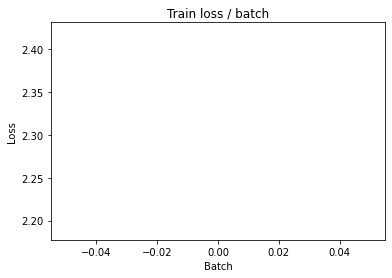

[TRAIN Batch 200/469]	Time 0.003s (0.013s)	Loss 0.3311 (1.1400)	Prec@1  92.2 ( 67.9)	Prec@5 100.0 ( 91.8)


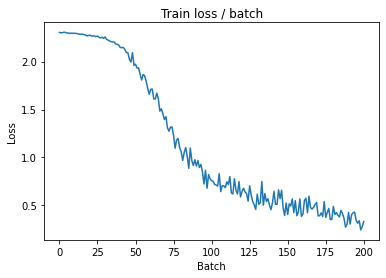

[TRAIN Batch 400/469]	Time 0.004s (0.012s)	Loss 0.1210 (0.6966)	Prec@1  97.7 ( 80.4)	Prec@5 100.0 ( 95.7)


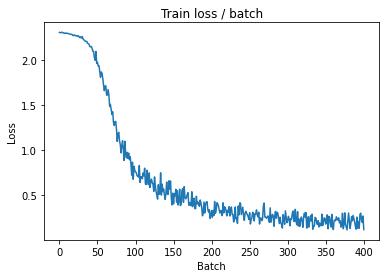


===============> Total time 5s	Avg loss 0.6194	Avg Prec@1 82.58 %	Avg Prec@5 96.31 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0949 (0.0949)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.1471	Avg Prec@1 95.60 %	Avg Prec@5 99.89 %



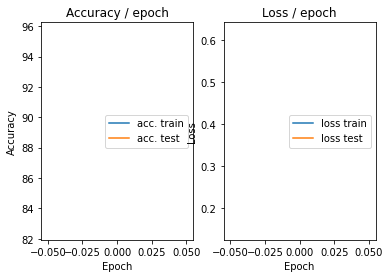

=== EPOCH 2 =====

[TRAIN Batch 000/469]	Time 0.113s (0.113s)	Loss 0.1520 (0.1520)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


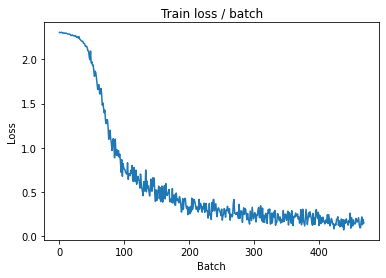

[TRAIN Batch 200/469]	Time 0.016s (0.013s)	Loss 0.1455 (0.1333)	Prec@1  96.1 ( 96.2)	Prec@5 100.0 ( 99.9)


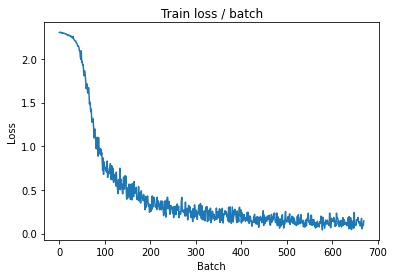

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.1496 (0.1201)	Prec@1  94.5 ( 96.5)	Prec@5 100.0 ( 99.9)


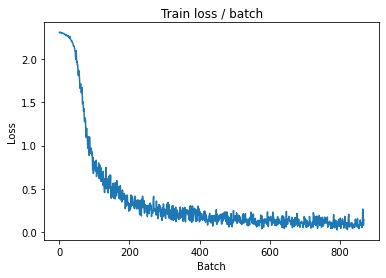


===============> Total time 6s	Avg loss 0.1174	Avg Prec@1 96.53 %	Avg Prec@5 99.91 %

[EVAL Batch 000/079]	Time 0.107s (0.107s)	Loss 0.0418 (0.0418)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0818	Avg Prec@1 97.66 %	Avg Prec@5 99.97 %



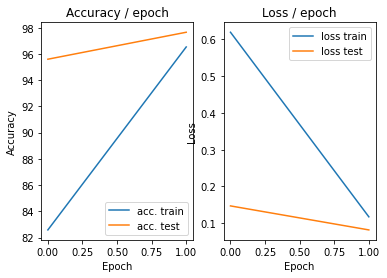

=== EPOCH 3 =====

[TRAIN Batch 000/469]	Time 0.113s (0.113s)	Loss 0.0612 (0.0612)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


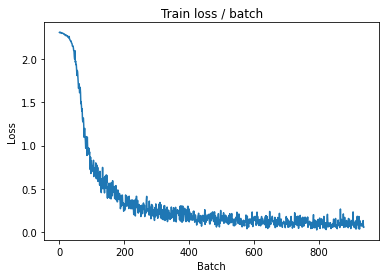

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0777 (0.0835)	Prec@1  95.3 ( 97.5)	Prec@5 100.0 ( 99.9)


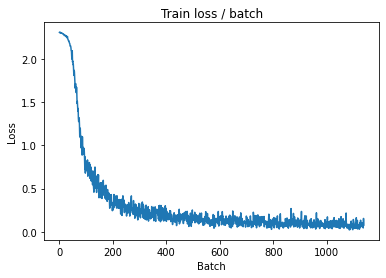

[TRAIN Batch 400/469]	Time 0.018s (0.012s)	Loss 0.1023 (0.0803)	Prec@1  96.9 ( 97.6)	Prec@5 100.0 (100.0)


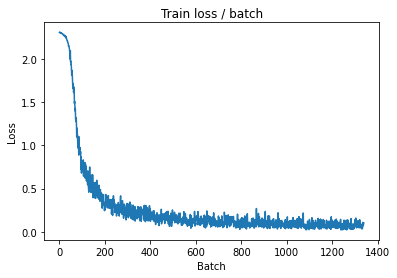


===============> Total time 5s	Avg loss 0.0784	Avg Prec@1 97.66 %	Avg Prec@5 99.95 %

[EVAL Batch 000/079]	Time 0.104s (0.104s)	Loss 0.0195 (0.0195)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0571	Avg Prec@1 98.20 %	Avg Prec@5 99.99 %



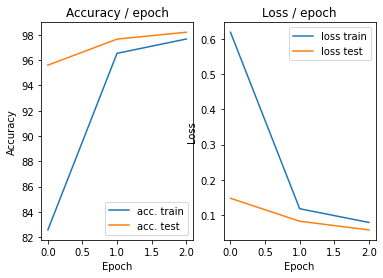

=== EPOCH 4 =====

[TRAIN Batch 000/469]	Time 0.115s (0.115s)	Loss 0.0838 (0.0838)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


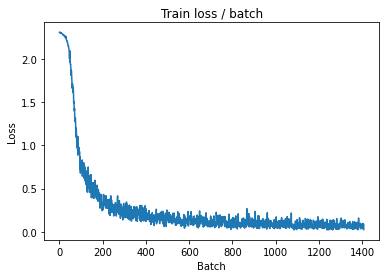

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.1091 (0.0635)	Prec@1  96.9 ( 98.2)	Prec@5 100.0 (100.0)


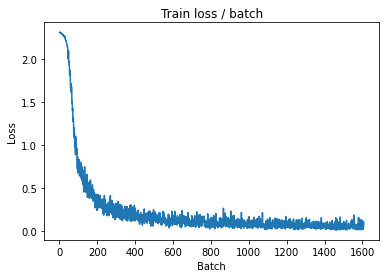

[TRAIN Batch 400/469]	Time 0.014s (0.012s)	Loss 0.0285 (0.0626)	Prec@1  99.2 ( 98.2)	Prec@5 100.0 (100.0)


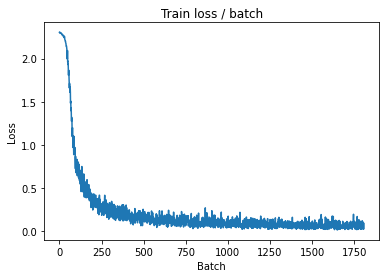


===============> Total time 5s	Avg loss 0.0618	Avg Prec@1 98.22 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.106s (0.106s)	Loss 0.0140 (0.0140)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0492	Avg Prec@1 98.49 %	Avg Prec@5 99.99 %



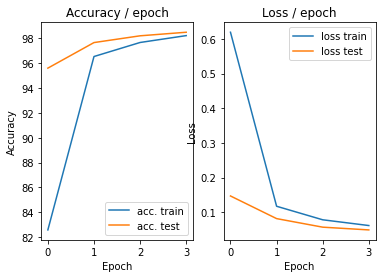

=== EPOCH 5 =====

[TRAIN Batch 000/469]	Time 0.110s (0.110s)	Loss 0.0341 (0.0341)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


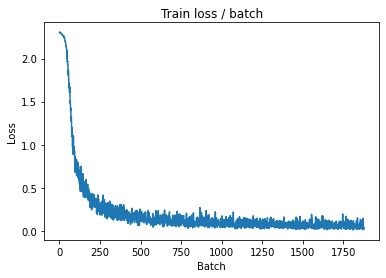

[TRAIN Batch 200/469]	Time 0.022s (0.014s)	Loss 0.0223 (0.0538)	Prec@1  99.2 ( 98.4)	Prec@5 100.0 (100.0)


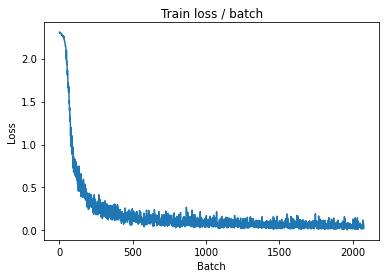

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0537 (0.0519)	Prec@1  98.4 ( 98.5)	Prec@5 100.0 (100.0)


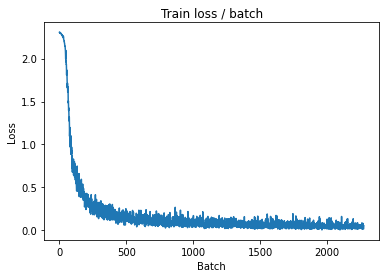


===============> Total time 6s	Avg loss 0.0515	Avg Prec@1 98.48 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0124 (0.0124)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0442	Avg Prec@1 98.57 %	Avg Prec@5 100.00 %



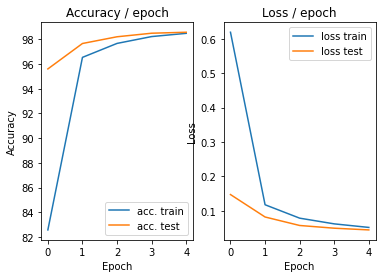

=== EPOCH 6 =====

[TRAIN Batch 000/469]	Time 0.109s (0.109s)	Loss 0.0290 (0.0290)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


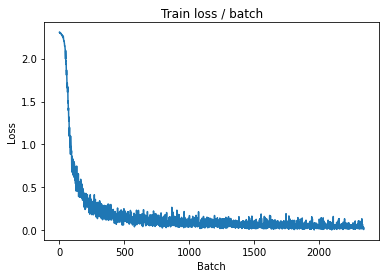

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0787 (0.0455)	Prec@1  97.7 ( 98.6)	Prec@5 100.0 (100.0)


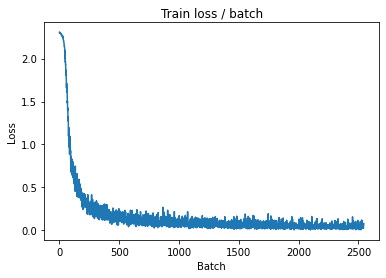

[TRAIN Batch 400/469]	Time 0.006s (0.012s)	Loss 0.0403 (0.0445)	Prec@1  98.4 ( 98.7)	Prec@5 100.0 (100.0)


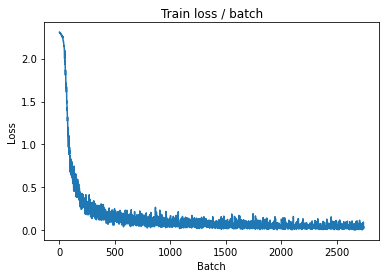


===============> Total time 5s	Avg loss 0.0446	Avg Prec@1 98.70 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0146 (0.0146)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0402	Avg Prec@1 98.75 %	Avg Prec@5 99.98 %



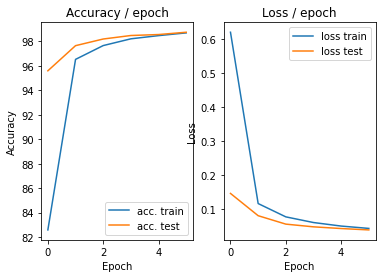

=== EPOCH 7 =====

[TRAIN Batch 000/469]	Time 0.115s (0.115s)	Loss 0.0514 (0.0514)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


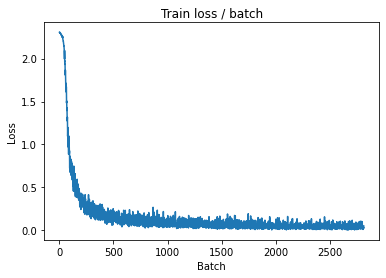

[TRAIN Batch 200/469]	Time 0.012s (0.013s)	Loss 0.0129 (0.0389)	Prec@1 100.0 ( 98.9)	Prec@5 100.0 (100.0)


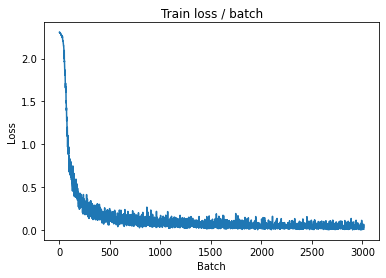

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.1028 (0.0398)	Prec@1  96.9 ( 98.8)	Prec@5 100.0 (100.0)


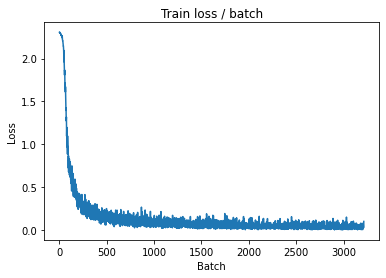


===============> Total time 6s	Avg loss 0.0394	Avg Prec@1 98.85 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.100s (0.100s)	Loss 0.0077 (0.0077)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0381	Avg Prec@1 98.81 %	Avg Prec@5 100.00 %



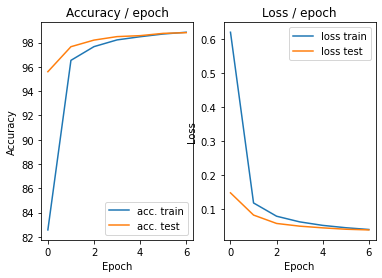

=== EPOCH 8 =====

[TRAIN Batch 000/469]	Time 0.114s (0.114s)	Loss 0.0227 (0.0227)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


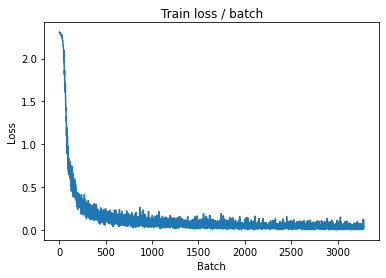

[TRAIN Batch 200/469]	Time 0.012s (0.013s)	Loss 0.0138 (0.0350)	Prec@1 100.0 ( 99.0)	Prec@5 100.0 (100.0)


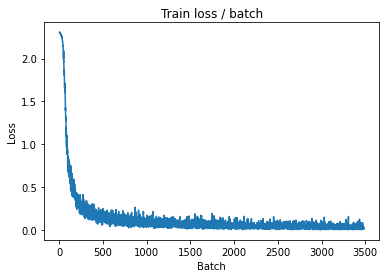

[TRAIN Batch 400/469]	Time 0.005s (0.013s)	Loss 0.0137 (0.0346)	Prec@1 100.0 ( 99.0)	Prec@5 100.0 (100.0)


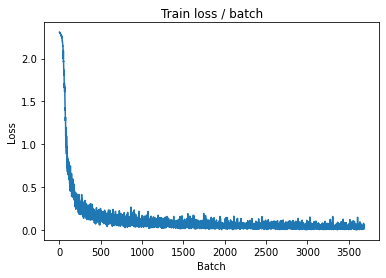


===============> Total time 6s	Avg loss 0.0347	Avg Prec@1 98.98 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0146 (0.0146)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0397	Avg Prec@1 98.70 %	Avg Prec@5 99.99 %



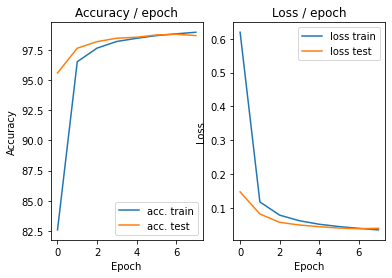

=== EPOCH 9 =====

[TRAIN Batch 000/469]	Time 0.131s (0.131s)	Loss 0.0258 (0.0258)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


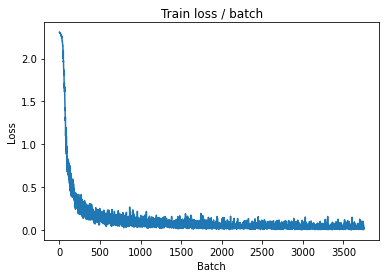

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0227 (0.0320)	Prec@1  98.4 ( 99.1)	Prec@5 100.0 (100.0)


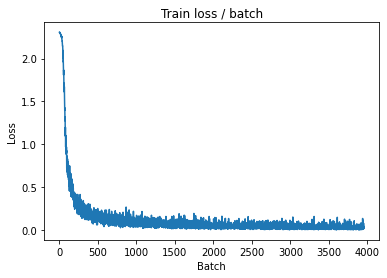

[TRAIN Batch 400/469]	Time 0.019s (0.013s)	Loss 0.0849 (0.0322)	Prec@1  96.9 ( 99.1)	Prec@5 100.0 (100.0)


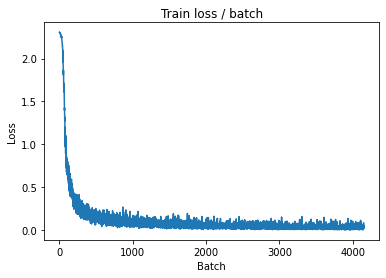


===============> Total time 6s	Avg loss 0.0311	Avg Prec@1 99.12 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0129 (0.0129)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0395	Avg Prec@1 98.69 %	Avg Prec@5 100.00 %



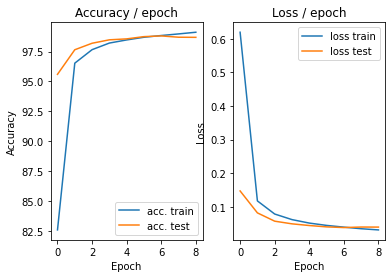

=== EPOCH 10 =====

[TRAIN Batch 000/469]	Time 0.108s (0.108s)	Loss 0.0238 (0.0238)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


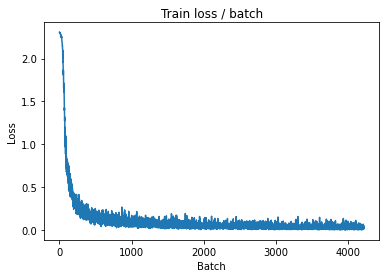

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0408 (0.0303)	Prec@1  98.4 ( 99.1)	Prec@5 100.0 (100.0)


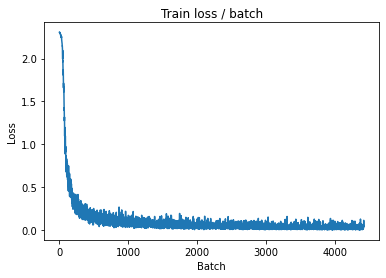

[TRAIN Batch 400/469]	Time 0.007s (0.012s)	Loss 0.0369 (0.0279)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


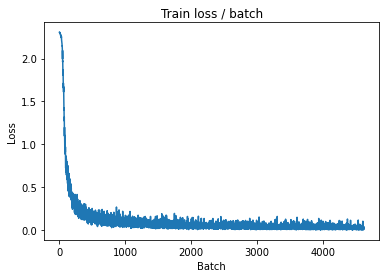


===============> Total time 5s	Avg loss 0.0282	Avg Prec@1 99.18 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0117 (0.0117)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0369	Avg Prec@1 98.89 %	Avg Prec@5 100.00 %



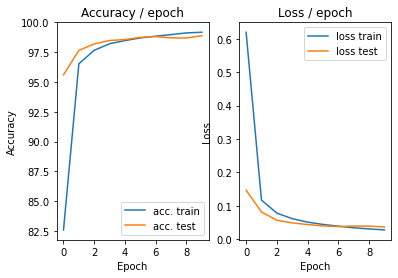

=== EPOCH 11 =====

[TRAIN Batch 000/469]	Time 0.116s (0.116s)	Loss 0.0122 (0.0122)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


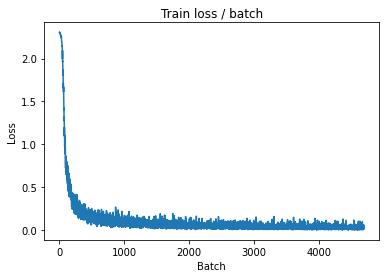

[TRAIN Batch 200/469]	Time 0.015s (0.014s)	Loss 0.0239 (0.0256)	Prec@1  99.2 ( 99.3)	Prec@5 100.0 (100.0)


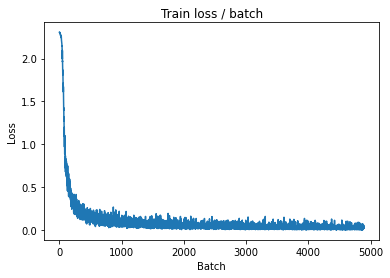

[TRAIN Batch 400/469]	Time 0.005s (0.013s)	Loss 0.0182 (0.0252)	Prec@1  99.2 ( 99.3)	Prec@5 100.0 (100.0)


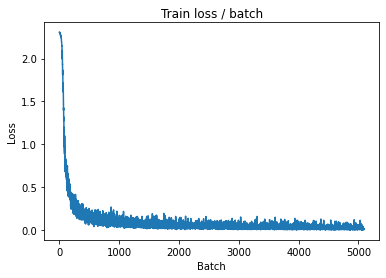


===============> Total time 6s	Avg loss 0.0256	Avg Prec@1 99.28 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0145 (0.0145)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0333	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



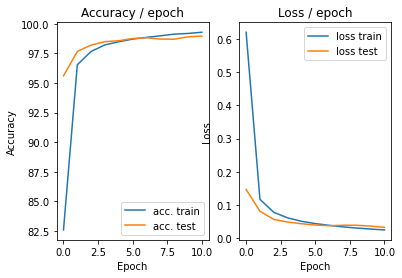

=== EPOCH 12 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0152 (0.0152)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


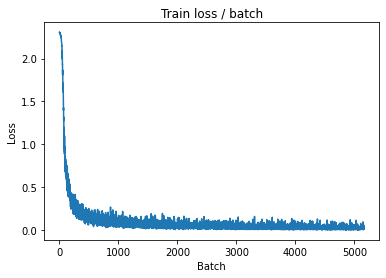

[TRAIN Batch 200/469]	Time 0.006s (0.013s)	Loss 0.0051 (0.0205)	Prec@1 100.0 ( 99.4)	Prec@5 100.0 (100.0)


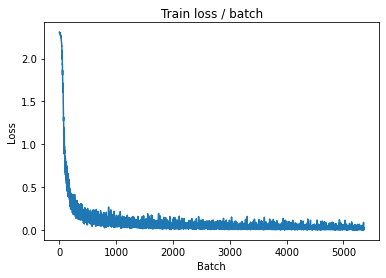

[TRAIN Batch 400/469]	Time 0.016s (0.013s)	Loss 0.0141 (0.0222)	Prec@1 100.0 ( 99.4)	Prec@5 100.0 (100.0)


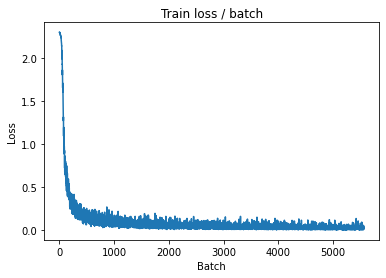


===============> Total time 6s	Avg loss 0.0229	Avg Prec@1 99.35 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 0.0198 (0.0198)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0334	Avg Prec@1 98.92 %	Avg Prec@5 100.00 %



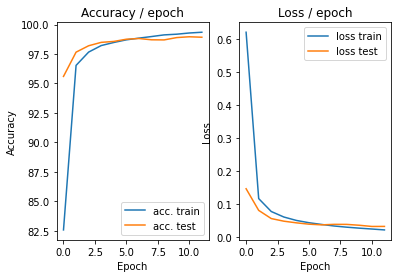

=== EPOCH 13 =====

[TRAIN Batch 000/469]	Time 0.120s (0.120s)	Loss 0.0305 (0.0305)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


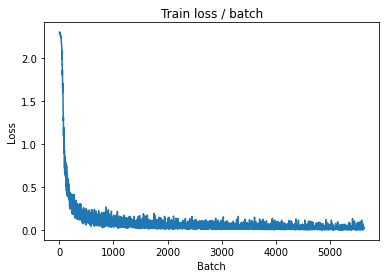

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0170 (0.0210)	Prec@1  99.2 ( 99.4)	Prec@5 100.0 (100.0)


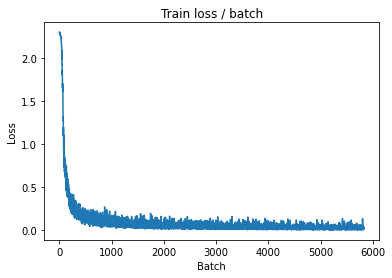

[TRAIN Batch 400/469]	Time 0.006s (0.013s)	Loss 0.0236 (0.0204)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


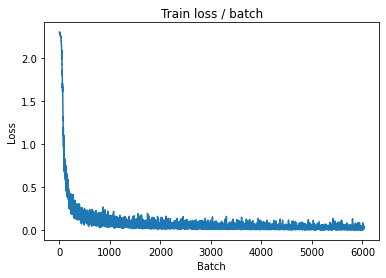


===============> Total time 6s	Avg loss 0.0203	Avg Prec@1 99.45 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0090 (0.0090)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0327	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



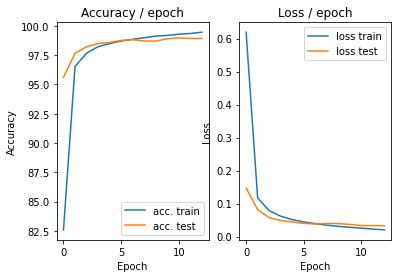

=== EPOCH 14 =====

[TRAIN Batch 000/469]	Time 0.108s (0.108s)	Loss 0.0279 (0.0279)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


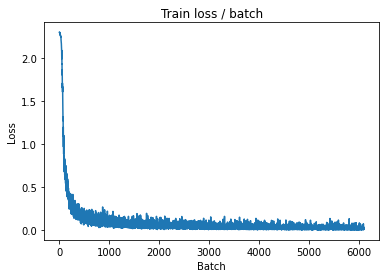

[TRAIN Batch 200/469]	Time 0.017s (0.013s)	Loss 0.0143 (0.0174)	Prec@1  99.2 ( 99.6)	Prec@5 100.0 (100.0)


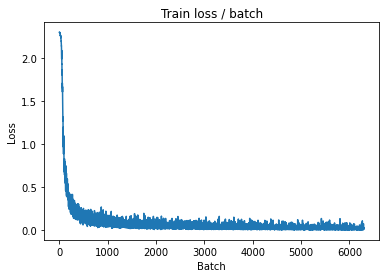

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0085 (0.0187)	Prec@1 100.0 ( 99.5)	Prec@5 100.0 (100.0)


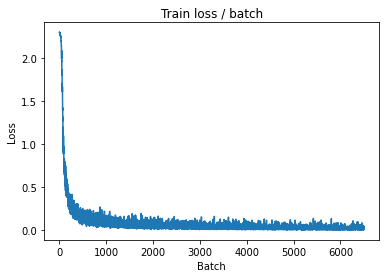


===============> Total time 6s	Avg loss 0.0185	Avg Prec@1 99.51 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0206 (0.0206)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0322	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



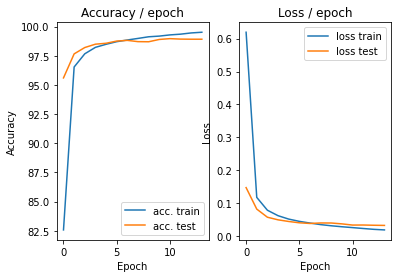

=== EPOCH 15 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0105 (0.0105)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


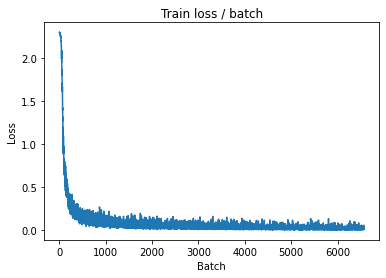

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0221 (0.0168)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


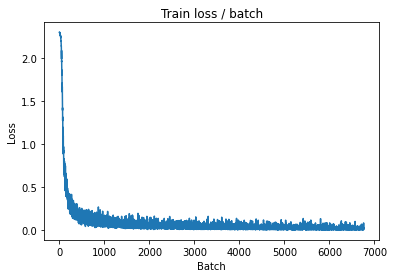

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0049 (0.0170)	Prec@1 100.0 ( 99.5)	Prec@5 100.0 (100.0)


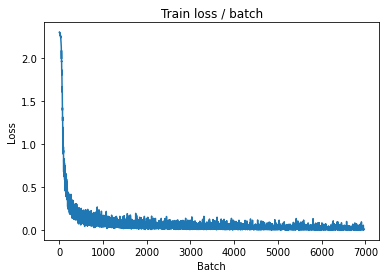


===============> Total time 6s	Avg loss 0.0172	Avg Prec@1 99.54 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0183 (0.0183)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0321	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



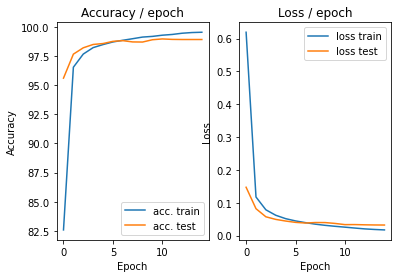

=== EPOCH 16 =====

[TRAIN Batch 000/469]	Time 0.120s (0.120s)	Loss 0.0141 (0.0141)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


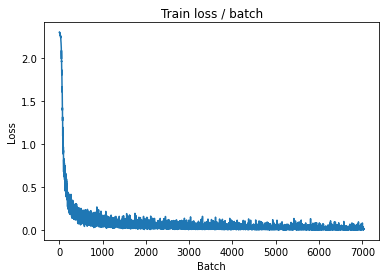

[TRAIN Batch 200/469]	Time 0.005s (0.013s)	Loss 0.0074 (0.0140)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


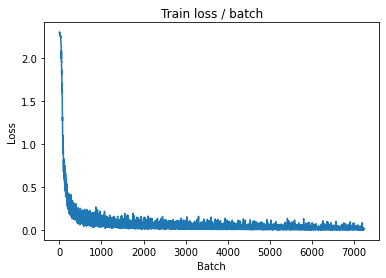

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0626 (0.0155)	Prec@1  98.4 ( 99.6)	Prec@5 100.0 (100.0)


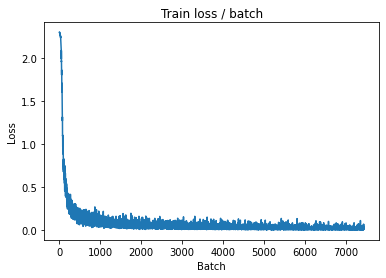


===============> Total time 6s	Avg loss 0.0155	Avg Prec@1 99.61 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0260 (0.0260)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0356	Avg Prec@1 98.92 %	Avg Prec@5 99.99 %



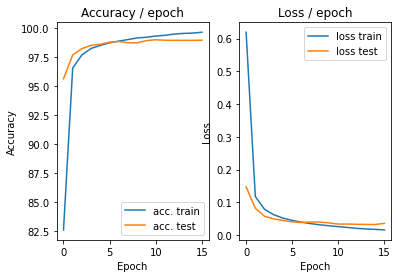

=== EPOCH 17 =====

[TRAIN Batch 000/469]	Time 0.129s (0.129s)	Loss 0.0271 (0.0271)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


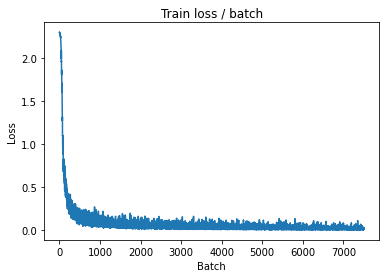

[TRAIN Batch 200/469]	Time 0.024s (0.014s)	Loss 0.0124 (0.0154)	Prec@1  99.2 ( 99.6)	Prec@5 100.0 (100.0)


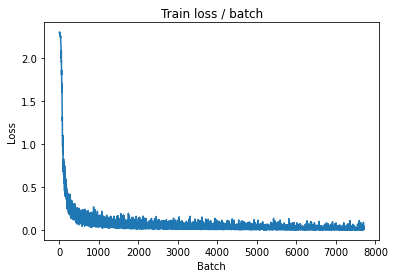

[TRAIN Batch 400/469]	Time 0.017s (0.014s)	Loss 0.0124 (0.0140)	Prec@1  99.2 ( 99.6)	Prec@5 100.0 (100.0)


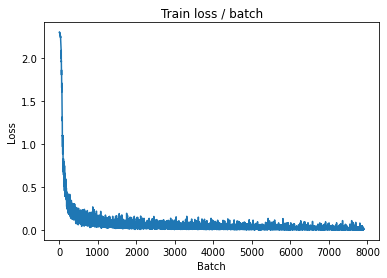


===============> Total time 6s	Avg loss 0.0140	Avg Prec@1 99.65 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 0.0141 (0.0141)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0315	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



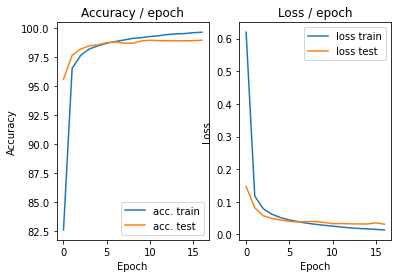

=== EPOCH 18 =====

[TRAIN Batch 000/469]	Time 0.111s (0.111s)	Loss 0.0020 (0.0020)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


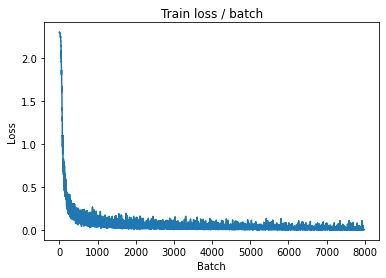

[TRAIN Batch 200/469]	Time 0.006s (0.013s)	Loss 0.0026 (0.0118)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


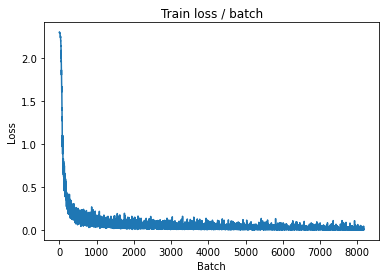

[TRAIN Batch 400/469]	Time 0.019s (0.013s)	Loss 0.0115 (0.0129)	Prec@1  99.2 ( 99.7)	Prec@5 100.0 (100.0)


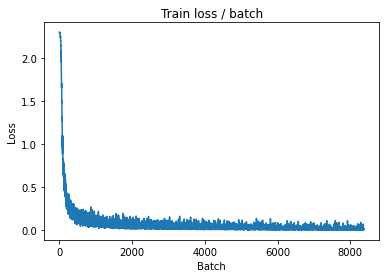


===============> Total time 6s	Avg loss 0.0129	Avg Prec@1 99.70 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0123 (0.0123)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0319	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



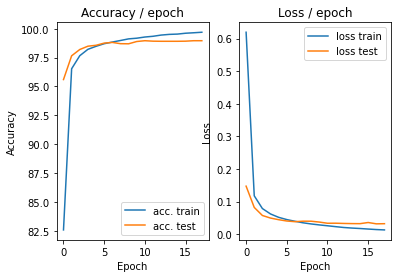

=== EPOCH 19 =====

[TRAIN Batch 000/469]	Time 0.118s (0.118s)	Loss 0.0051 (0.0051)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


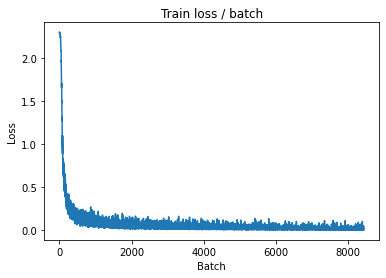

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0060 (0.0119)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


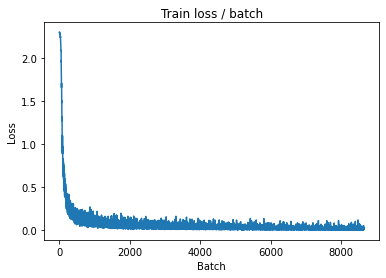

[TRAIN Batch 400/469]	Time 0.015s (0.013s)	Loss 0.0047 (0.0114)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


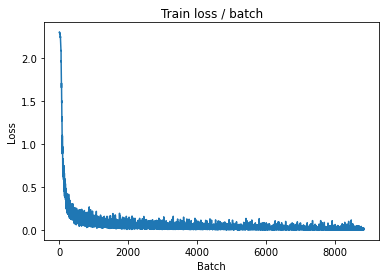


===============> Total time 6s	Avg loss 0.0116	Avg Prec@1 99.72 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0191 (0.0191)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0334	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



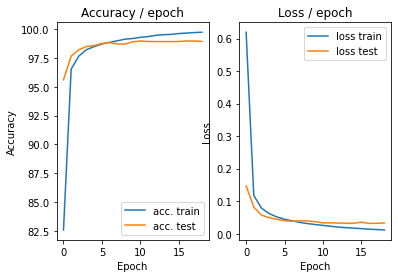

=== EPOCH 20 =====

[TRAIN Batch 000/469]	Time 0.121s (0.121s)	Loss 0.0040 (0.0040)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


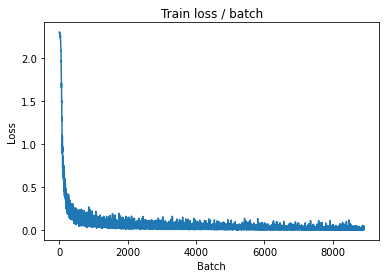

[TRAIN Batch 200/469]	Time 0.019s (0.014s)	Loss 0.0164 (0.0105)	Prec@1  99.2 ( 99.8)	Prec@5 100.0 (100.0)


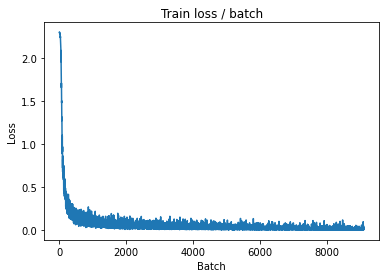

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.0059 (0.0106)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


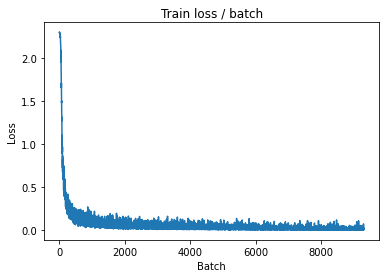


===============> Total time 6s	Avg loss 0.0106	Avg Prec@1 99.78 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0191 (0.0191)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0315	Avg Prec@1 98.94 %	Avg Prec@5 100.00 %



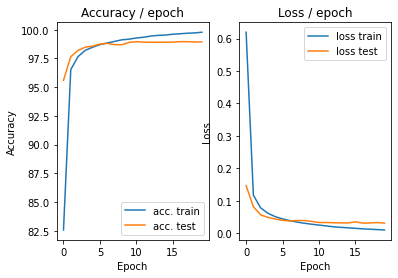

=== EPOCH 21 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0059 (0.0059)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


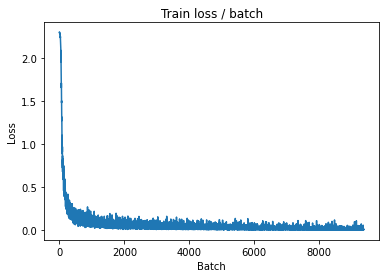

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0050 (0.0094)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


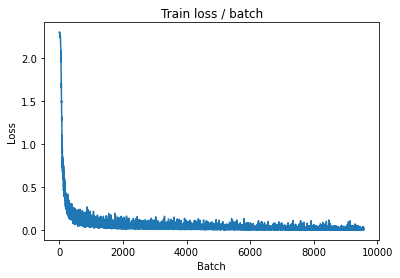

[TRAIN Batch 400/469]	Time 0.022s (0.013s)	Loss 0.0079 (0.0096)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


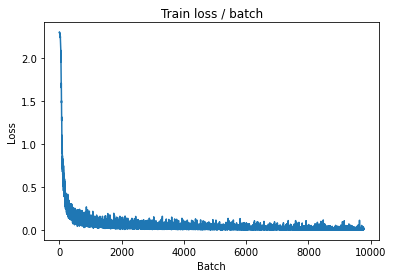


===============> Total time 6s	Avg loss 0.0098	Avg Prec@1 99.78 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0282 (0.0282)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0313	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



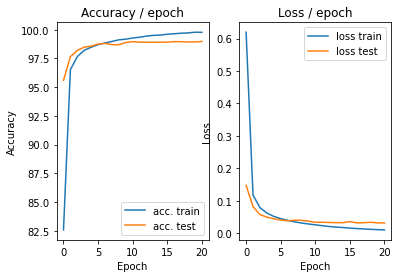

=== EPOCH 22 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0052 (0.0052)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


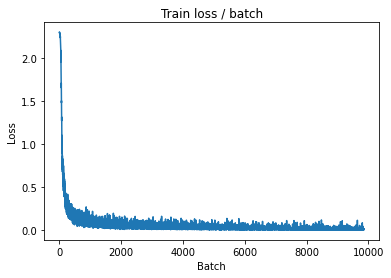

[TRAIN Batch 200/469]	Time 0.010s (0.013s)	Loss 0.0065 (0.0078)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


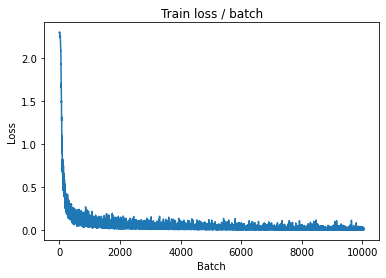

[TRAIN Batch 400/469]	Time 0.008s (0.013s)	Loss 0.0039 (0.0086)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


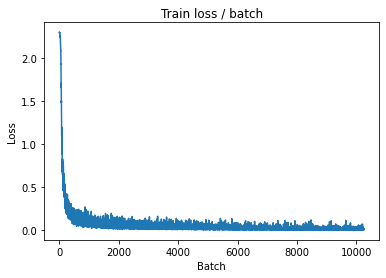


===============> Total time 6s	Avg loss 0.0087	Avg Prec@1 99.81 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0360 (0.0360)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0357	Avg Prec@1 98.81 %	Avg Prec@5 100.00 %



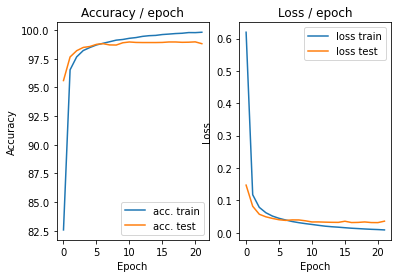

=== EPOCH 23 =====

[TRAIN Batch 000/469]	Time 0.112s (0.112s)	Loss 0.0084 (0.0084)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


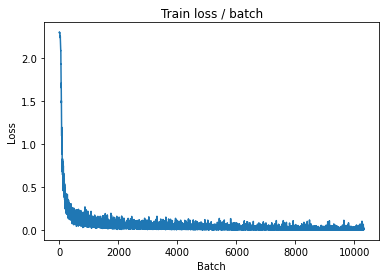

[TRAIN Batch 200/469]	Time 0.005s (0.014s)	Loss 0.0025 (0.0082)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


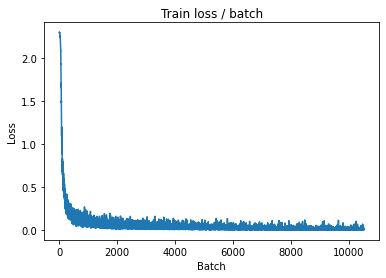

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0025 (0.0083)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


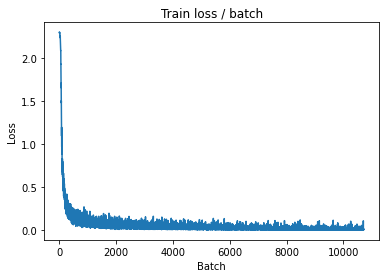


===============> Total time 6s	Avg loss 0.0083	Avg Prec@1 99.82 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0249 (0.0249)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0326	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



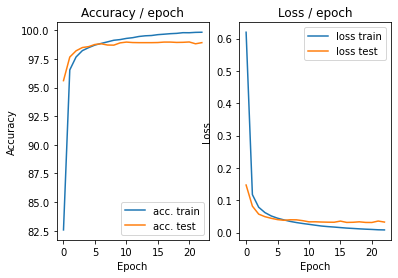

=== EPOCH 24 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0063 (0.0063)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


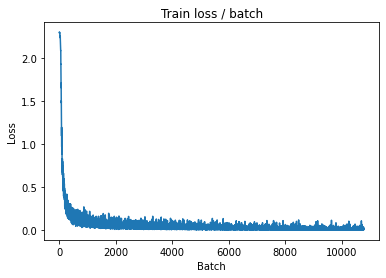

[TRAIN Batch 200/469]	Time 0.009s (0.013s)	Loss 0.0014 (0.0073)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


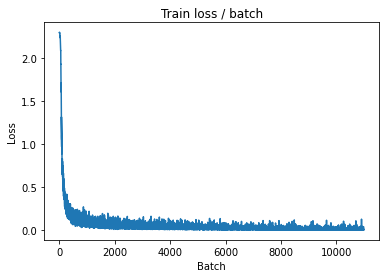

[TRAIN Batch 400/469]	Time 0.021s (0.013s)	Loss 0.0028 (0.0075)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


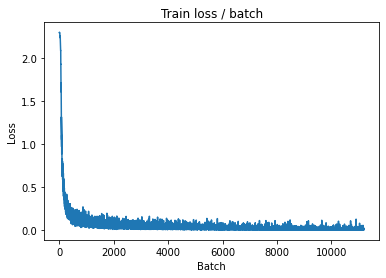


===============> Total time 6s	Avg loss 0.0077	Avg Prec@1 99.85 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0209 (0.0209)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0314	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



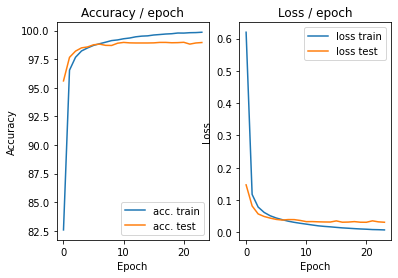

=== EPOCH 25 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0018 (0.0018)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


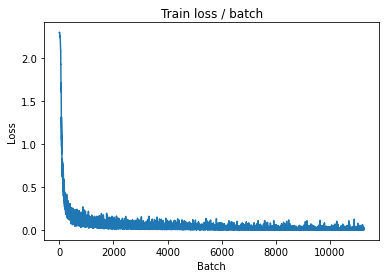

[TRAIN Batch 200/469]	Time 0.015s (0.013s)	Loss 0.0028 (0.0068)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


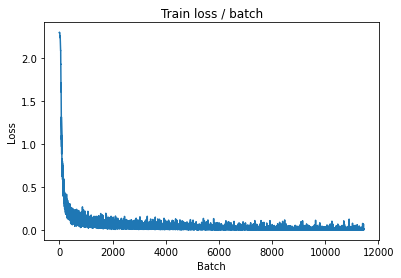

[TRAIN Batch 400/469]	Time 0.009s (0.013s)	Loss 0.0015 (0.0070)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


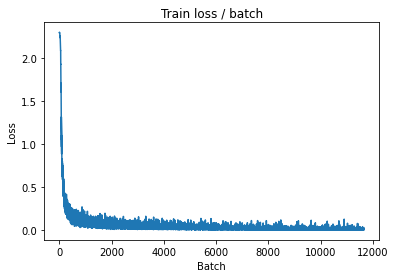


===============> Total time 6s	Avg loss 0.0071	Avg Prec@1 99.87 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 0.0351 (0.0351)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0317	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



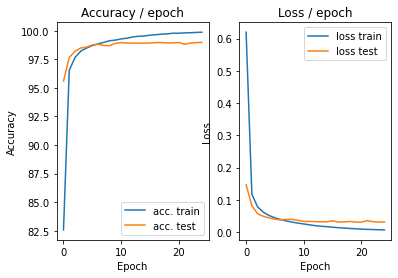

=== EPOCH 26 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0015 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


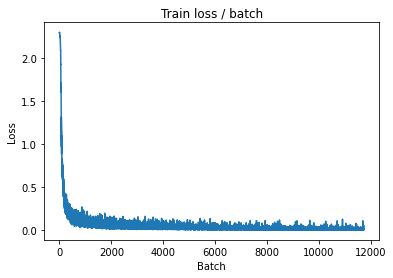

[TRAIN Batch 200/469]	Time 0.004s (0.014s)	Loss 0.0039 (0.0061)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


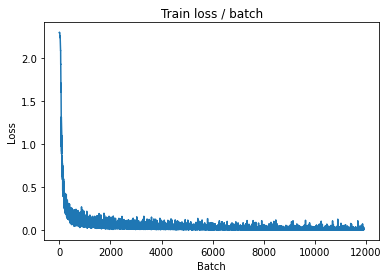

[TRAIN Batch 400/469]	Time 0.007s (0.013s)	Loss 0.0314 (0.0062)	Prec@1  98.4 ( 99.9)	Prec@5 100.0 (100.0)


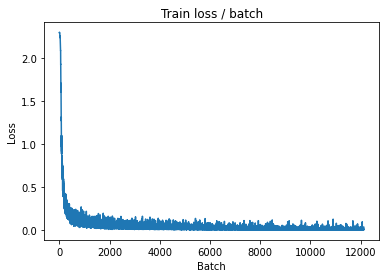


===============> Total time 6s	Avg loss 0.0065	Avg Prec@1 99.90 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0274 (0.0274)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0326	Avg Prec@1 98.91 %	Avg Prec@5 99.99 %



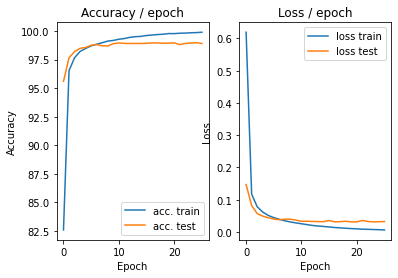

=== EPOCH 27 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0091 (0.0091)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


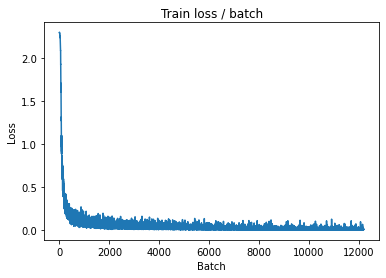

[TRAIN Batch 200/469]	Time 0.006s (0.013s)	Loss 0.0024 (0.0056)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


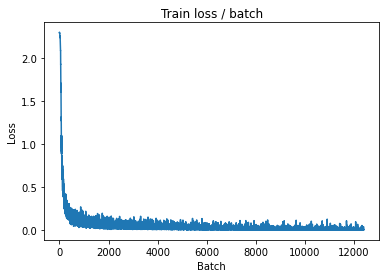

[TRAIN Batch 400/469]	Time 0.005s (0.013s)	Loss 0.0099 (0.0061)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


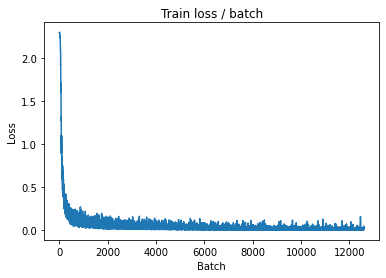


===============> Total time 6s	Avg loss 0.0060	Avg Prec@1 99.90 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.107s (0.107s)	Loss 0.0263 (0.0263)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0323	Avg Prec@1 98.94 %	Avg Prec@5 100.00 %



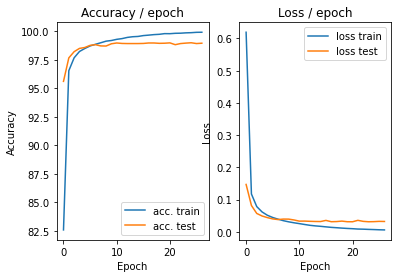

=== EPOCH 28 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0033 (0.0033)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


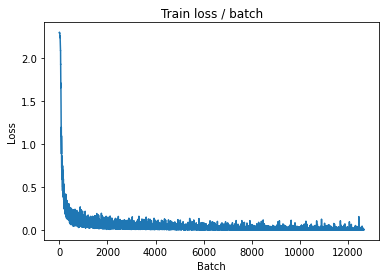

[TRAIN Batch 200/469]	Time 0.021s (0.013s)	Loss 0.0010 (0.0053)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


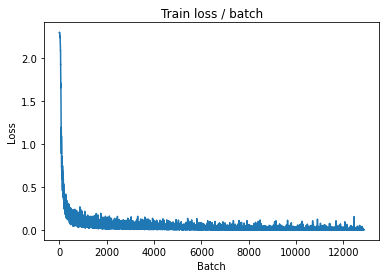

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0029 (0.0054)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


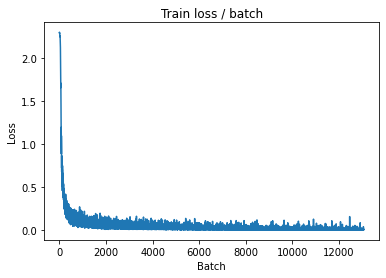


===============> Total time 6s	Avg loss 0.0056	Avg Prec@1 99.92 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.106s (0.106s)	Loss 0.0241 (0.0241)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0332	Avg Prec@1 98.86 %	Avg Prec@5 100.00 %



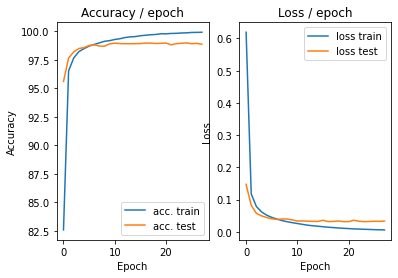

=== EPOCH 29 =====

[TRAIN Batch 000/469]	Time 0.114s (0.114s)	Loss 0.0041 (0.0041)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


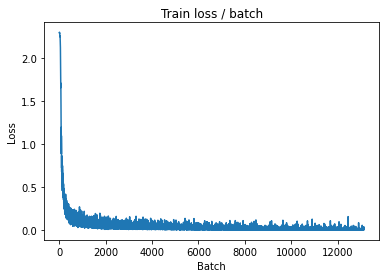

[TRAIN Batch 200/469]	Time 0.019s (0.014s)	Loss 0.0012 (0.0055)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


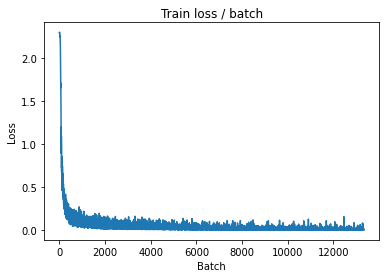

[TRAIN Batch 400/469]	Time 0.004s (0.014s)	Loss 0.0023 (0.0055)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


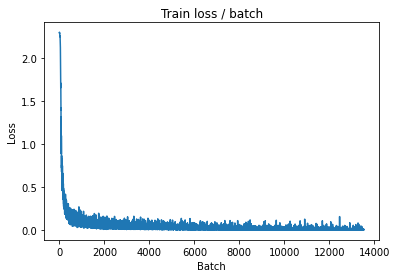


===============> Total time 6s	Avg loss 0.0053	Avg Prec@1 99.93 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0385 (0.0385)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0323	Avg Prec@1 99.01 %	Avg Prec@5 100.00 %



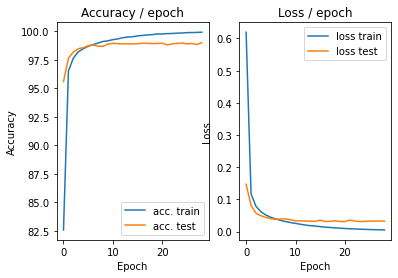

=== EPOCH 30 =====

[TRAIN Batch 000/469]	Time 0.117s (0.117s)	Loss 0.0022 (0.0022)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


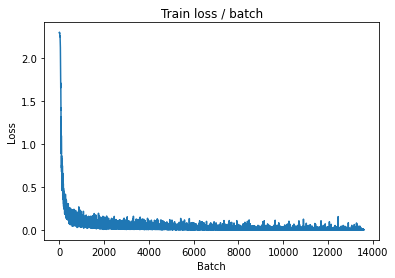

[TRAIN Batch 200/469]	Time 0.005s (0.013s)	Loss 0.0016 (0.0042)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


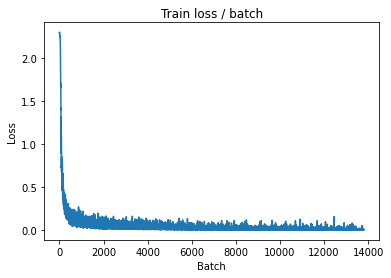

[TRAIN Batch 400/469]	Time 0.007s (0.013s)	Loss 0.0038 (0.0047)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


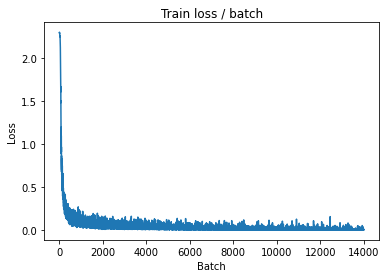


===============> Total time 6s	Avg loss 0.0048	Avg Prec@1 99.93 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0250 (0.0250)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0327	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



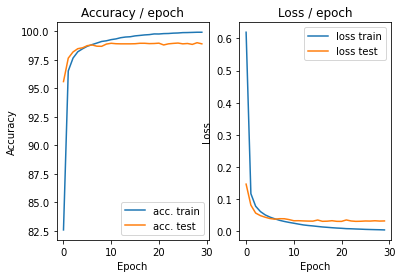

=== EPOCH 31 =====

[TRAIN Batch 000/469]	Time 0.117s (0.117s)	Loss 0.0153 (0.0153)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


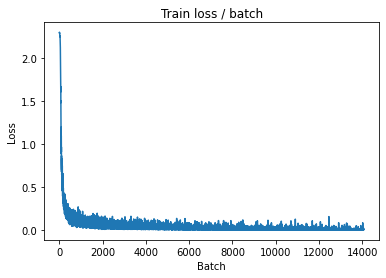

[TRAIN Batch 200/469]	Time 0.009s (0.013s)	Loss 0.0072 (0.0045)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


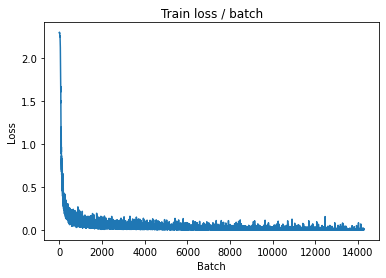

[TRAIN Batch 400/469]	Time 0.021s (0.013s)	Loss 0.0010 (0.0046)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


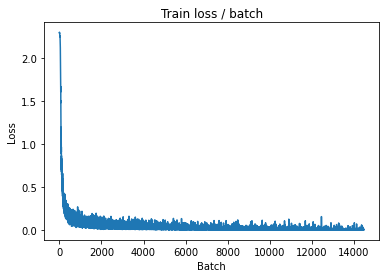


===============> Total time 6s	Avg loss 0.0045	Avg Prec@1 99.94 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0320 (0.0320)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0326	Avg Prec@1 99.00 %	Avg Prec@5 100.00 %



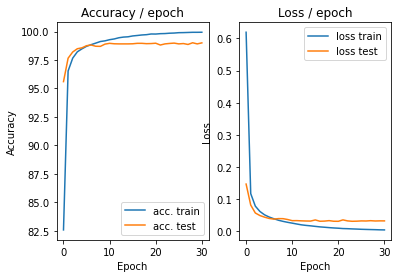

=== EPOCH 32 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0016 (0.0016)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


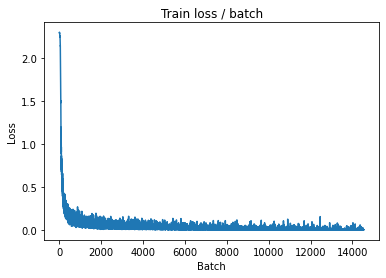

[TRAIN Batch 200/469]	Time 0.020s (0.014s)	Loss 0.0034 (0.0035)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


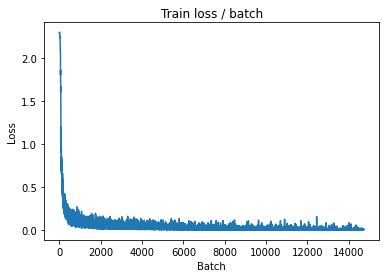

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0035 (0.0040)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


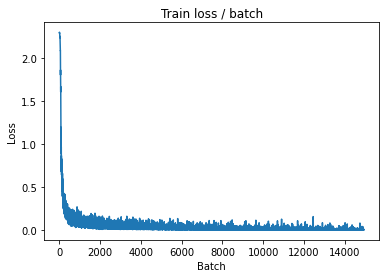


===============> Total time 6s	Avg loss 0.0042	Avg Prec@1 99.95 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0246 (0.0246)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0324	Avg Prec@1 99.02 %	Avg Prec@5 100.00 %



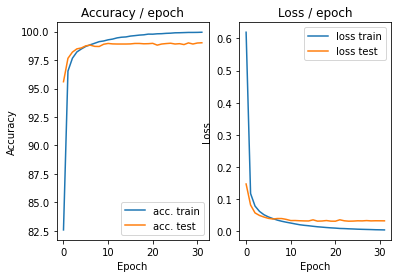

=== EPOCH 33 =====

[TRAIN Batch 000/469]	Time 0.121s (0.121s)	Loss 0.0035 (0.0035)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


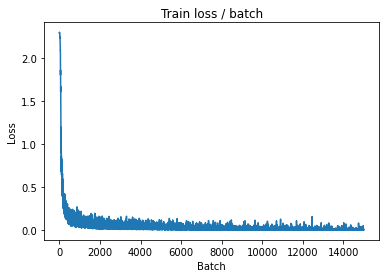

[TRAIN Batch 200/469]	Time 0.020s (0.013s)	Loss 0.0007 (0.0038)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


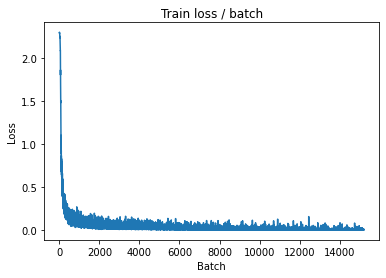

[TRAIN Batch 400/469]	Time 0.022s (0.013s)	Loss 0.0028 (0.0038)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


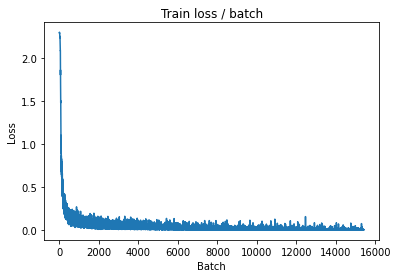


===============> Total time 6s	Avg loss 0.0039	Avg Prec@1 99.95 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0315 (0.0315)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0327	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



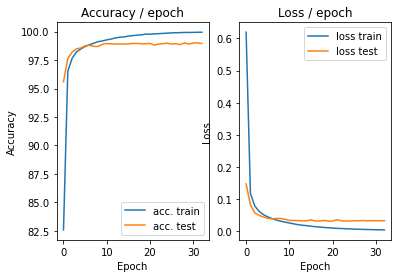

=== EPOCH 34 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0023 (0.0023)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


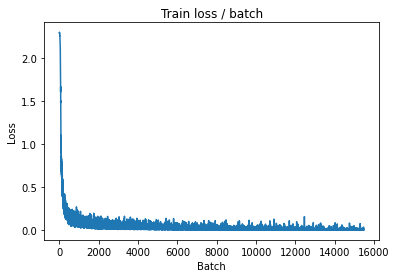

[TRAIN Batch 200/469]	Time 0.026s (0.013s)	Loss 0.0024 (0.0031)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


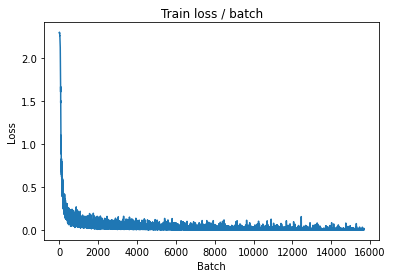

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.0037 (0.0034)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


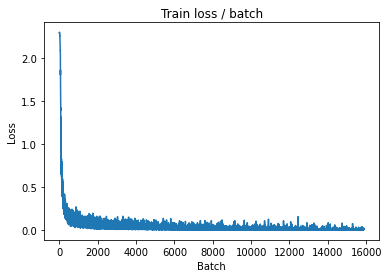


===============> Total time 6s	Avg loss 0.0036	Avg Prec@1 99.96 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0351 (0.0351)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0328	Avg Prec@1 98.92 %	Avg Prec@5 100.00 %



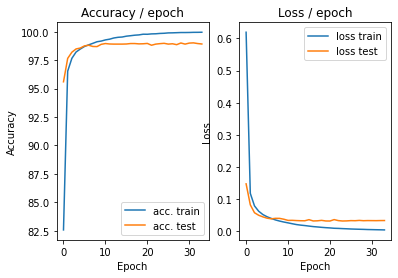

=== EPOCH 35 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0098 (0.0098)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


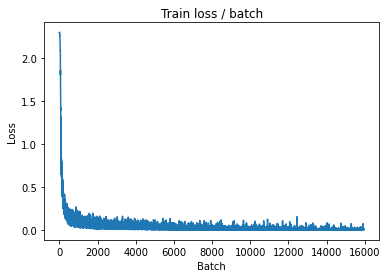

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0008 (0.0034)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


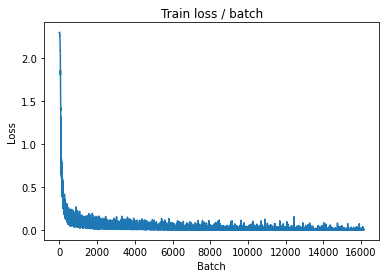

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0011 (0.0035)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


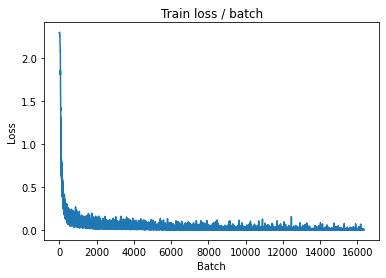


===============> Total time 6s	Avg loss 0.0035	Avg Prec@1 99.96 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0413 (0.0413)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0348	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



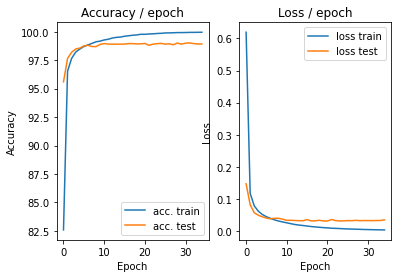

=== EPOCH 36 =====

[TRAIN Batch 000/469]	Time 0.130s (0.130s)	Loss 0.0058 (0.0058)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


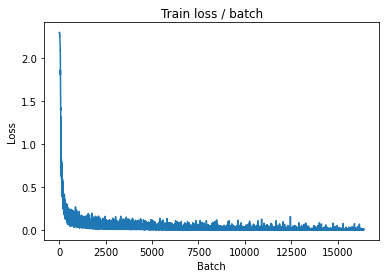

[TRAIN Batch 200/469]	Time 0.009s (0.013s)	Loss 0.0016 (0.0027)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


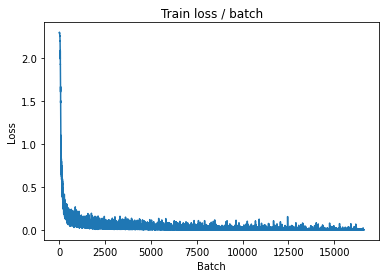

[TRAIN Batch 400/469]	Time 0.014s (0.013s)	Loss 0.0027 (0.0030)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


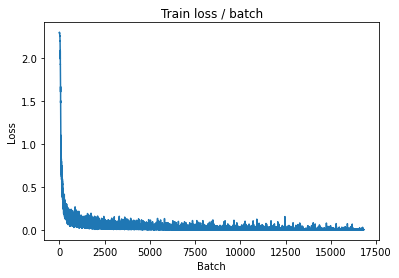


===============> Total time 6s	Avg loss 0.0031	Avg Prec@1 99.96 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0446 (0.0446)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0331	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



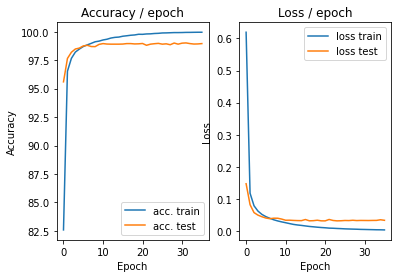

=== EPOCH 37 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0025 (0.0025)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


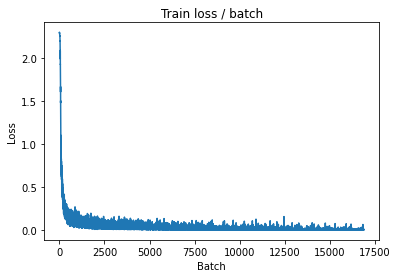

[TRAIN Batch 200/469]	Time 0.016s (0.013s)	Loss 0.0032 (0.0029)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


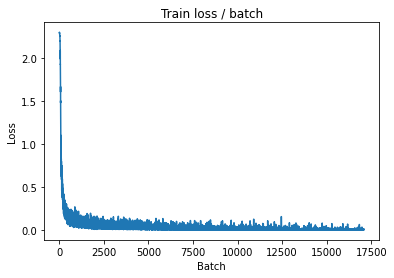

[TRAIN Batch 400/469]	Time 0.016s (0.013s)	Loss 0.0033 (0.0030)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


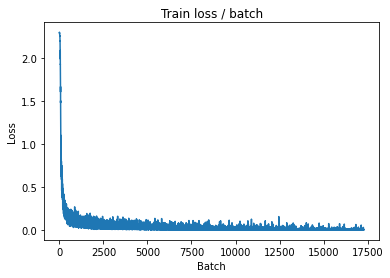


===============> Total time 6s	Avg loss 0.0030	Avg Prec@1 99.97 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0420 (0.0420)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0340	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



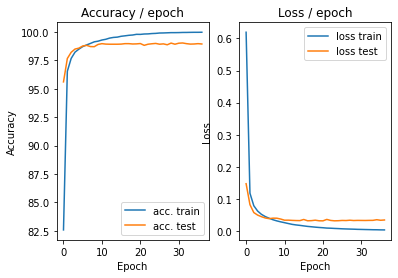

=== EPOCH 38 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0011 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


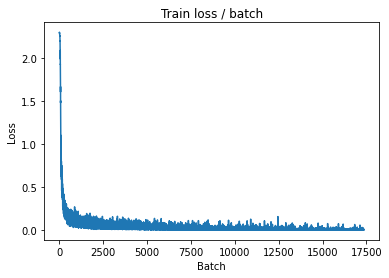

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0023 (0.0026)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


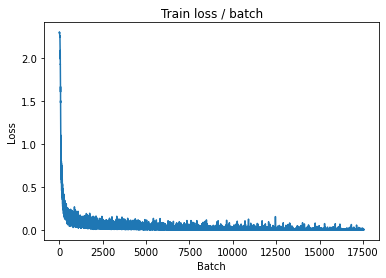

[TRAIN Batch 400/469]	Time 0.014s (0.013s)	Loss 0.0028 (0.0029)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


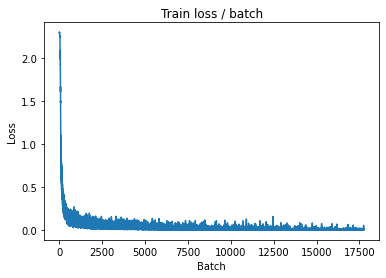


===============> Total time 6s	Avg loss 0.0029	Avg Prec@1 99.97 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0446 (0.0446)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0341	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



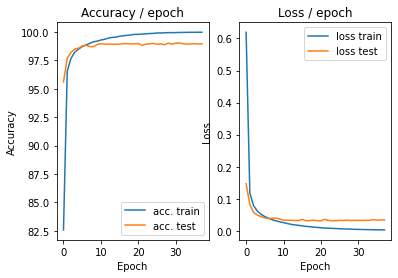

=== EPOCH 39 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


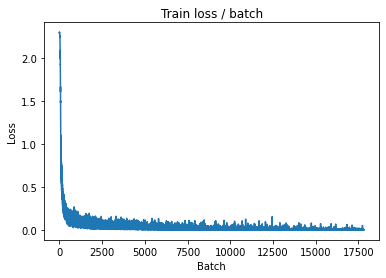

[TRAIN Batch 200/469]	Time 0.003s (0.013s)	Loss 0.0024 (0.0026)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


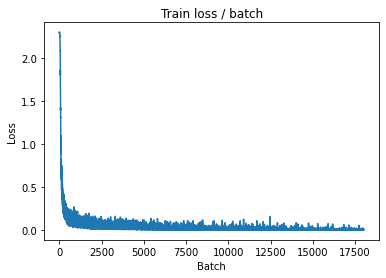

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0017 (0.0026)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


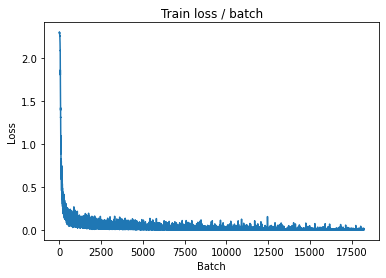


===============> Total time 6s	Avg loss 0.0026	Avg Prec@1 99.98 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0484 (0.0484)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0340	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



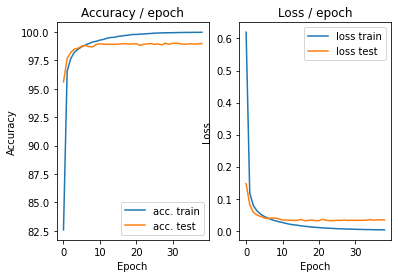

=== EPOCH 40 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


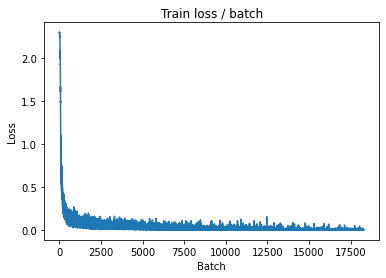

[TRAIN Batch 200/469]	Time 0.015s (0.013s)	Loss 0.0026 (0.0026)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


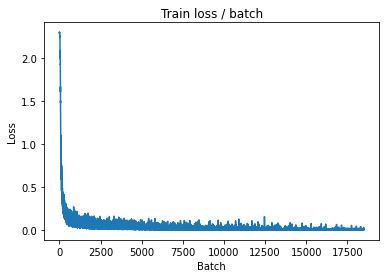

[TRAIN Batch 400/469]	Time 0.012s (0.013s)	Loss 0.0012 (0.0025)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


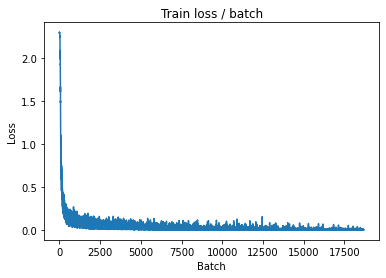


===============> Total time 6s	Avg loss 0.0025	Avg Prec@1 99.97 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0441 (0.0441)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0339	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



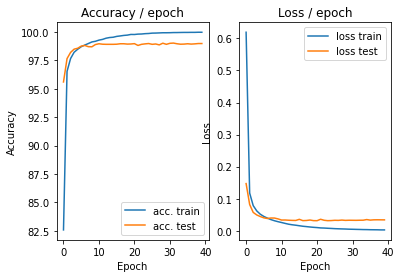

=== EPOCH 41 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0033 (0.0033)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


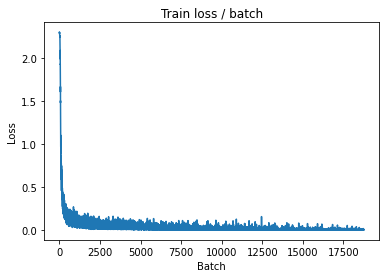

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0044 (0.0022)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


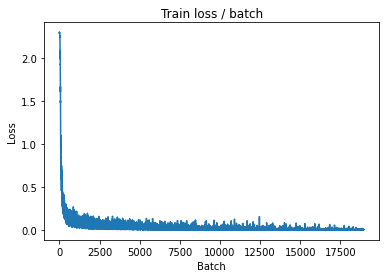

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0008 (0.0024)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


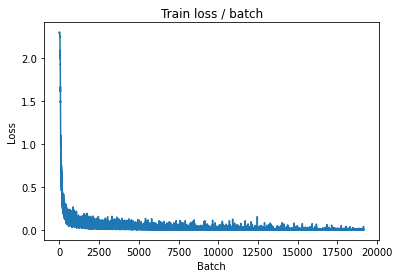


===============> Total time 6s	Avg loss 0.0023	Avg Prec@1 99.98 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0432 (0.0432)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0335	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



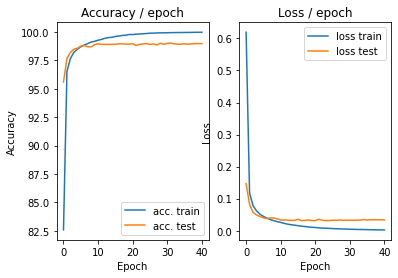

=== EPOCH 42 =====

[TRAIN Batch 000/469]	Time 0.129s (0.129s)	Loss 0.0010 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


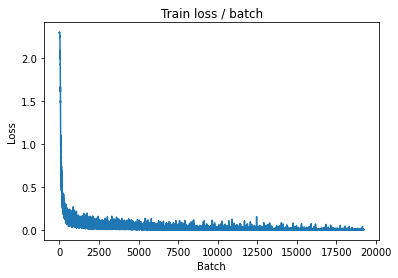

[TRAIN Batch 200/469]	Time 0.017s (0.013s)	Loss 0.0021 (0.0021)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


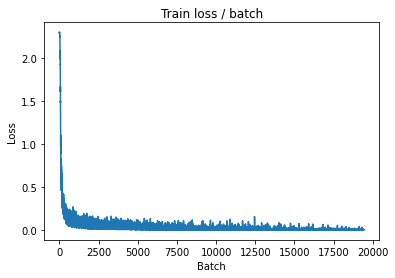

[TRAIN Batch 400/469]	Time 0.013s (0.013s)	Loss 0.0163 (0.0022)	Prec@1  99.2 (100.0)	Prec@5 100.0 (100.0)


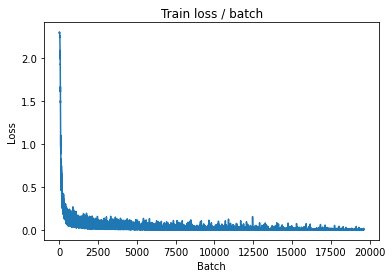


===============> Total time 6s	Avg loss 0.0021	Avg Prec@1 99.98 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0413 (0.0413)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0338	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



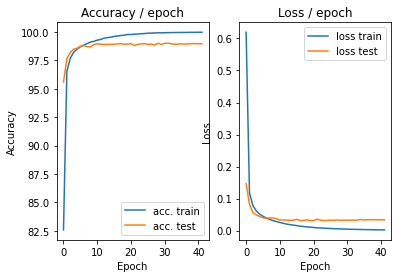

=== EPOCH 43 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0008 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


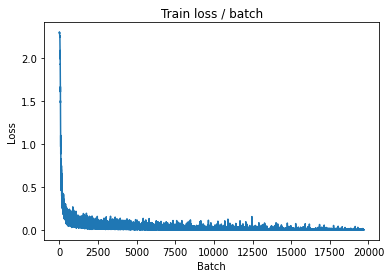

[TRAIN Batch 200/469]	Time 0.021s (0.014s)	Loss 0.0011 (0.0017)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


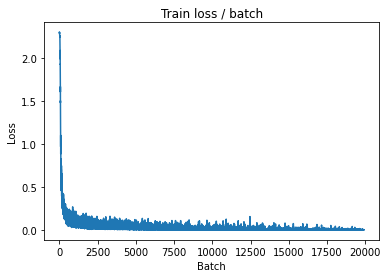

[TRAIN Batch 400/469]	Time 0.006s (0.013s)	Loss 0.0025 (0.0020)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


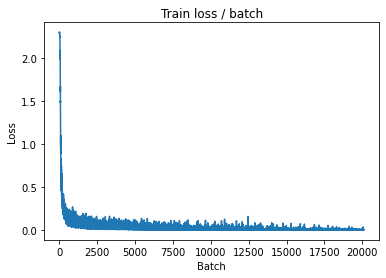


===============> Total time 6s	Avg loss 0.0020	Avg Prec@1 99.98 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0404 (0.0404)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0335	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



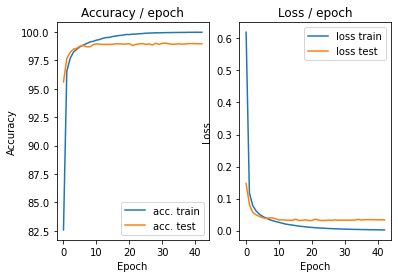

=== EPOCH 44 =====

[TRAIN Batch 000/469]	Time 0.126s (0.126s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


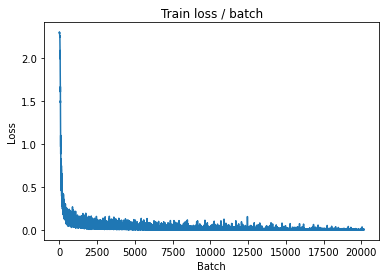

[TRAIN Batch 200/469]	Time 0.010s (0.013s)	Loss 0.0006 (0.0018)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


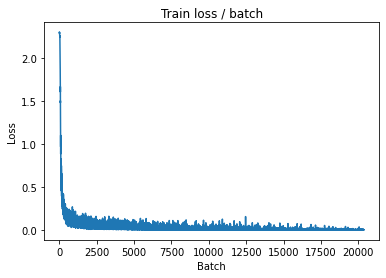

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.0061 (0.0020)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


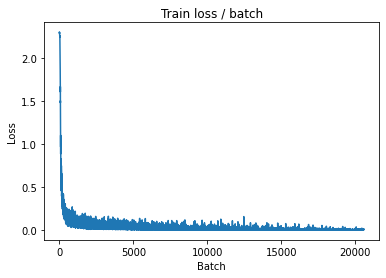


===============> Total time 6s	Avg loss 0.0019	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.107s (0.107s)	Loss 0.0463 (0.0463)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0344	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



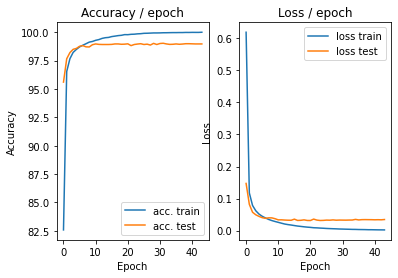

=== EPOCH 45 =====

[TRAIN Batch 000/469]	Time 0.121s (0.121s)	Loss 0.0033 (0.0033)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


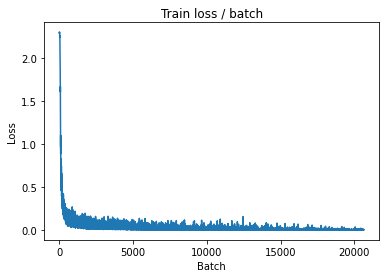

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0007 (0.0017)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


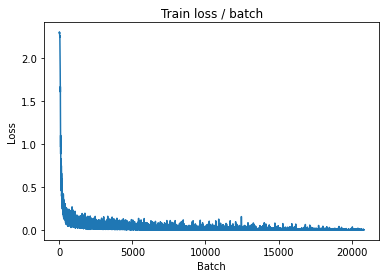

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0016 (0.0017)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


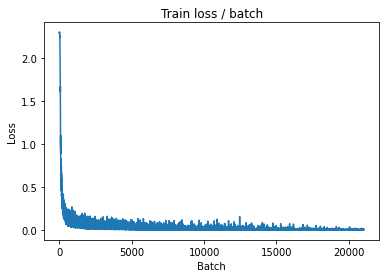


===============> Total time 6s	Avg loss 0.0018	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 0.0451 (0.0451)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0346	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



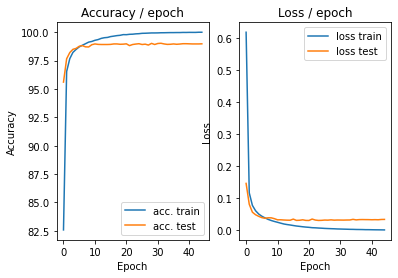

=== EPOCH 46 =====

[TRAIN Batch 000/469]	Time 0.120s (0.120s)	Loss 0.0043 (0.0043)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


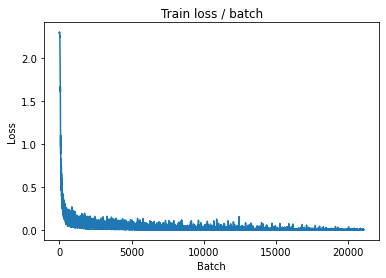

[TRAIN Batch 200/469]	Time 0.021s (0.014s)	Loss 0.0006 (0.0017)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


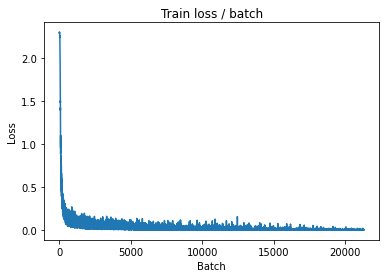

[TRAIN Batch 400/469]	Time 0.019s (0.013s)	Loss 0.0007 (0.0018)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


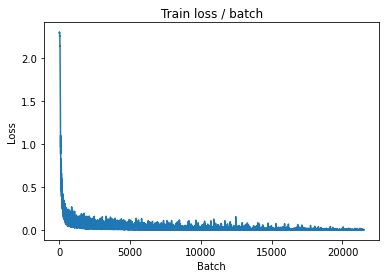


===============> Total time 6s	Avg loss 0.0017	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0527 (0.0527)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0345	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



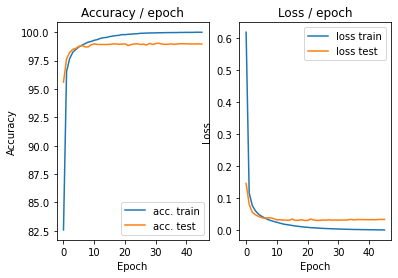

=== EPOCH 47 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


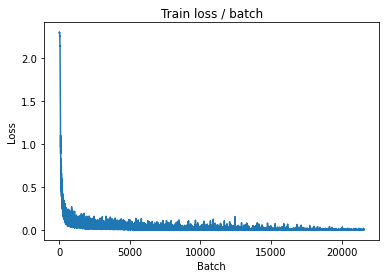

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0007 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


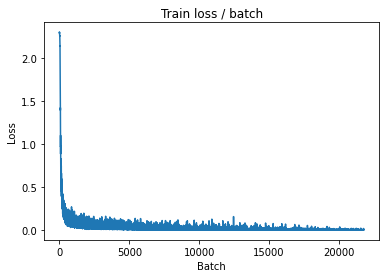

[TRAIN Batch 400/469]	Time 0.020s (0.013s)	Loss 0.0039 (0.0016)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


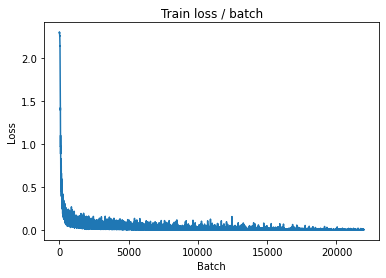


===============> Total time 6s	Avg loss 0.0016	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0465 (0.0465)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0354	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



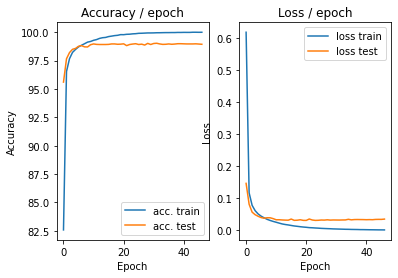

=== EPOCH 48 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


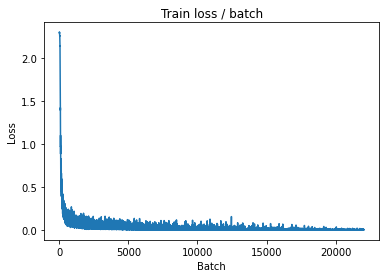

[TRAIN Batch 200/469]	Time 0.008s (0.013s)	Loss 0.0011 (0.0014)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


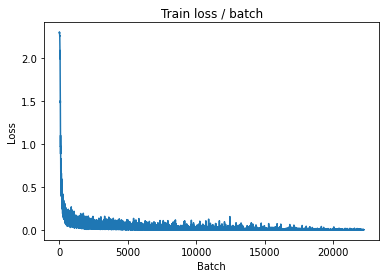

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0006 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


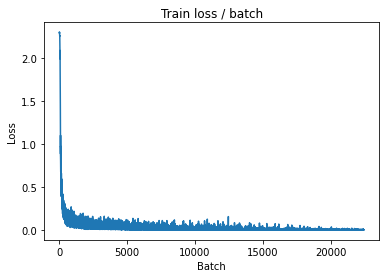


===============> Total time 6s	Avg loss 0.0015	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0519 (0.0519)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0368	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



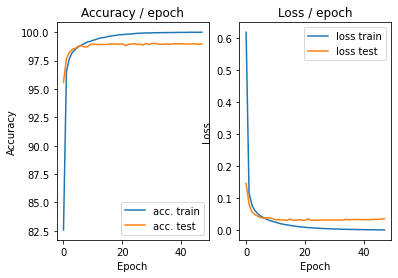

=== EPOCH 49 =====

[TRAIN Batch 000/469]	Time 0.118s (0.118s)	Loss 0.0011 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


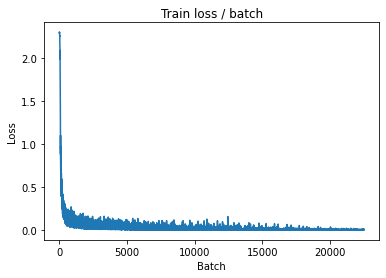

[TRAIN Batch 200/469]	Time 0.004s (0.014s)	Loss 0.0012 (0.0016)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


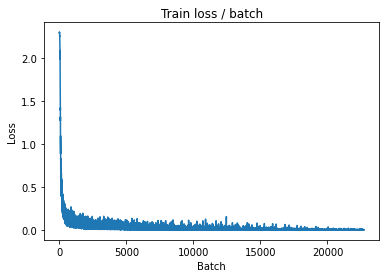

[TRAIN Batch 400/469]	Time 0.005s (0.013s)	Loss 0.0009 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


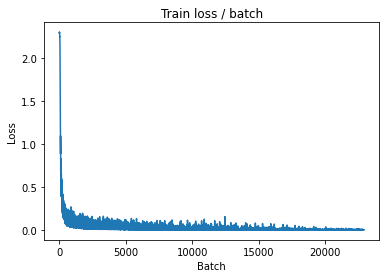


===============> Total time 6s	Avg loss 0.0015	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 0.0548 (0.0548)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0347	Avg Prec@1 99.00 %	Avg Prec@5 100.00 %



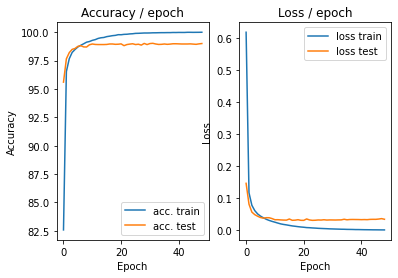

=== EPOCH 50 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0009 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


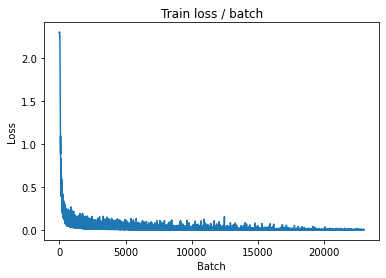

[TRAIN Batch 200/469]	Time 0.019s (0.013s)	Loss 0.0004 (0.0014)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


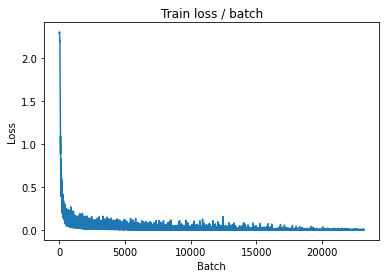

[TRAIN Batch 400/469]	Time 0.019s (0.013s)	Loss 0.0011 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


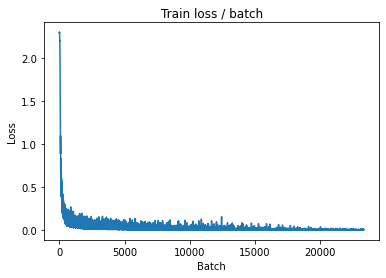


===============> Total time 6s	Avg loss 0.0014	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0509 (0.0509)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0348	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



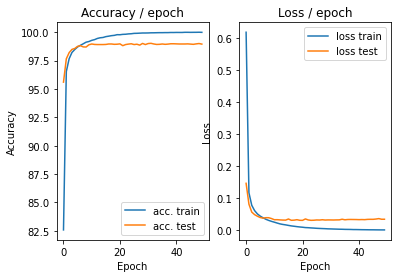

=== EPOCH 51 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0015 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


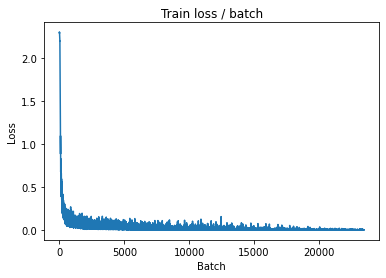

[TRAIN Batch 200/469]	Time 0.009s (0.013s)	Loss 0.0017 (0.0014)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


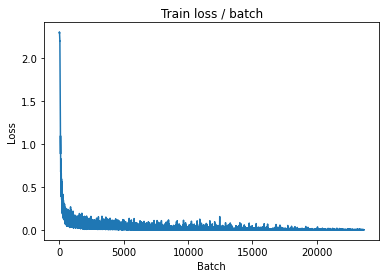

[TRAIN Batch 400/469]	Time 0.024s (0.013s)	Loss 0.0013 (0.0013)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


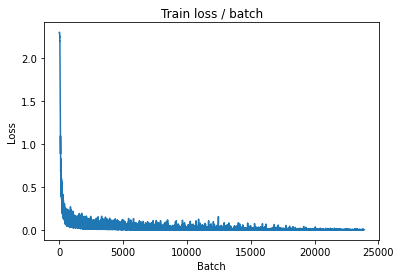


===============> Total time 6s	Avg loss 0.0013	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0601 (0.0601)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0353	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



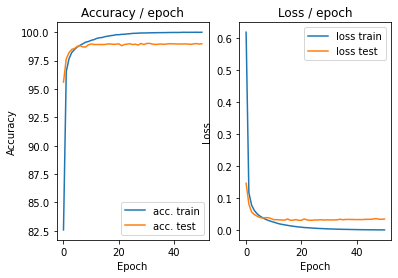

=== EPOCH 52 =====

[TRAIN Batch 000/469]	Time 0.112s (0.112s)	Loss 0.0015 (0.0015)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


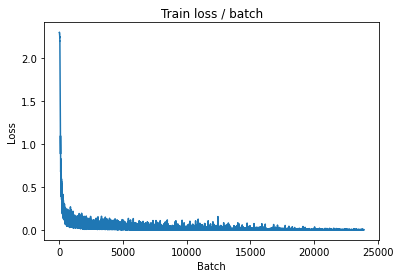

[TRAIN Batch 200/469]	Time 0.020s (0.014s)	Loss 0.0002 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


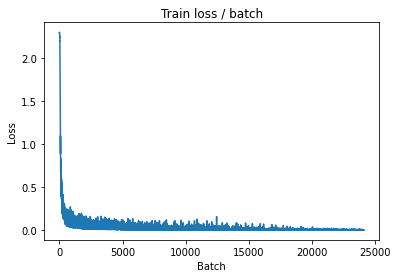

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.0015 (0.0012)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


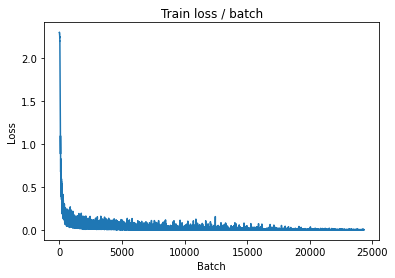


===============> Total time 6s	Avg loss 0.0013	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0526 (0.0526)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0358	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



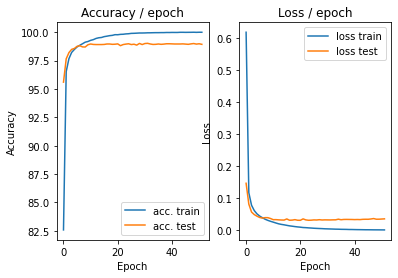

=== EPOCH 53 =====

[TRAIN Batch 000/469]	Time 0.135s (0.135s)	Loss 0.0013 (0.0013)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


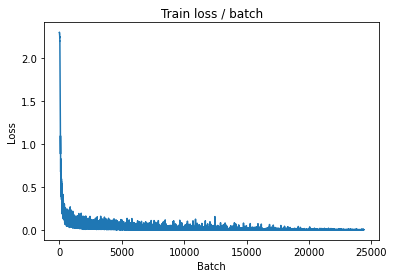

[TRAIN Batch 200/469]	Time 0.013s (0.013s)	Loss 0.0004 (0.0012)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


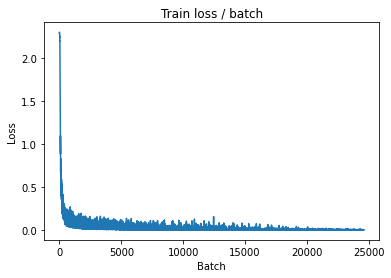

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0016 (0.0012)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


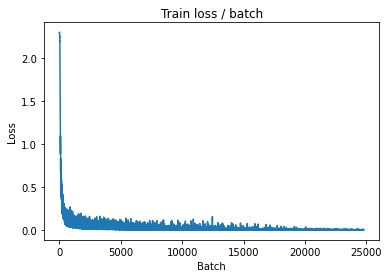


===============> Total time 6s	Avg loss 0.0012	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0559 (0.0559)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0353	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



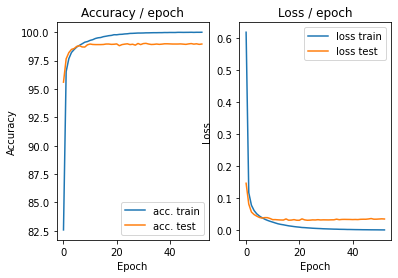

=== EPOCH 54 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0009 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


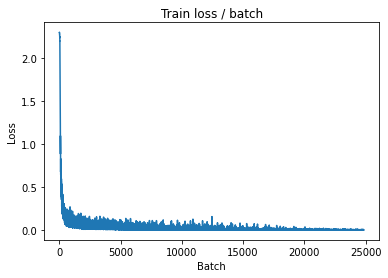

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0007 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


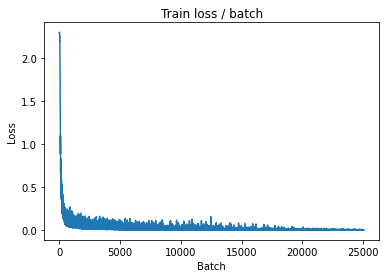

[TRAIN Batch 400/469]	Time 0.022s (0.013s)	Loss 0.0015 (0.0012)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


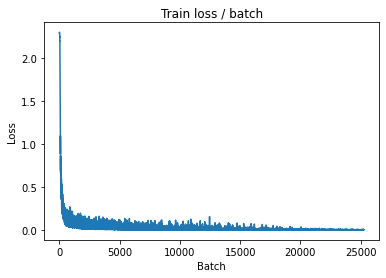


===============> Total time 6s	Avg loss 0.0012	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0552 (0.0552)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0350	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



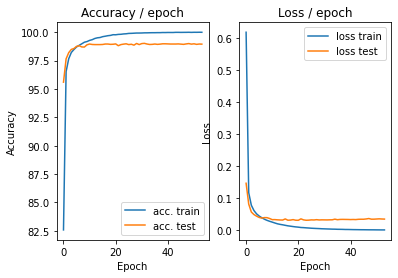

=== EPOCH 55 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


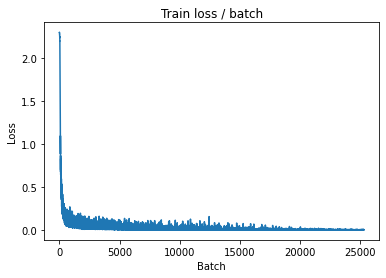

[TRAIN Batch 200/469]	Time 0.021s (0.014s)	Loss 0.0008 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


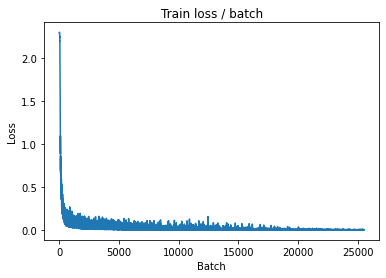

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0005 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


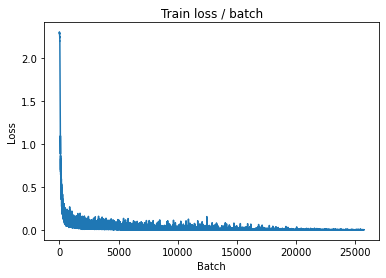


===============> Total time 6s	Avg loss 0.0011	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 0.0539 (0.0539)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0351	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



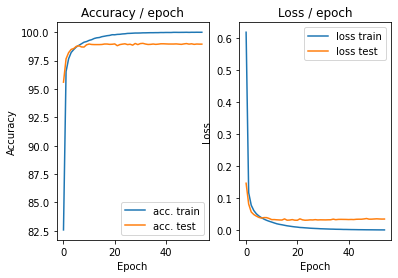

=== EPOCH 56 =====

[TRAIN Batch 000/469]	Time 0.121s (0.121s)	Loss 0.0011 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


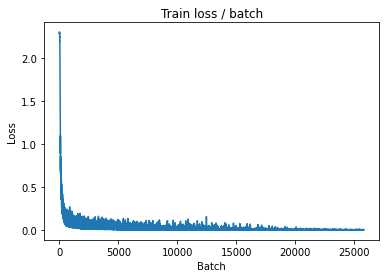

[TRAIN Batch 200/469]	Time 0.018s (0.013s)	Loss 0.0009 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


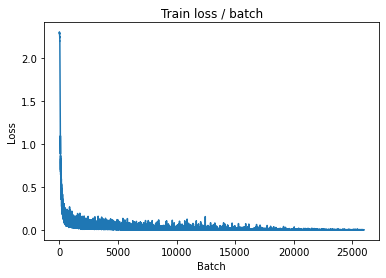

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0009 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


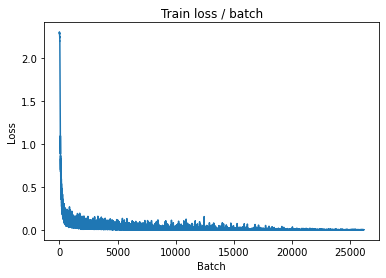


===============> Total time 6s	Avg loss 0.0011	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 0.0485 (0.0485)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0359	Avg Prec@1 98.91 %	Avg Prec@5 100.00 %



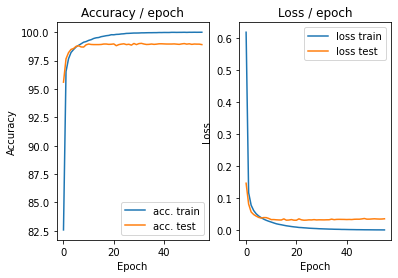

=== EPOCH 57 =====

[TRAIN Batch 000/469]	Time 0.128s (0.128s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


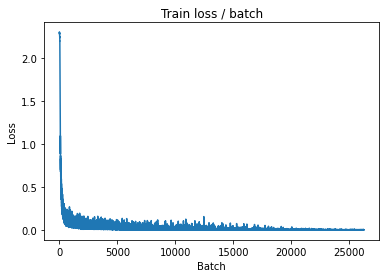

[TRAIN Batch 200/469]	Time 0.008s (0.013s)	Loss 0.0010 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


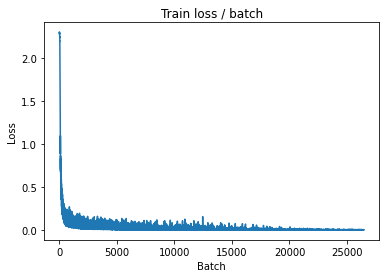

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0004 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


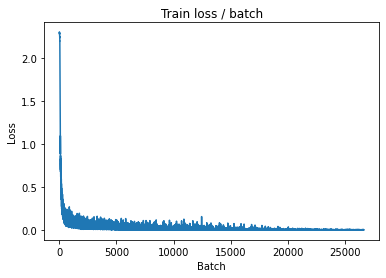


===============> Total time 6s	Avg loss 0.0010	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0600 (0.0600)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0362	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



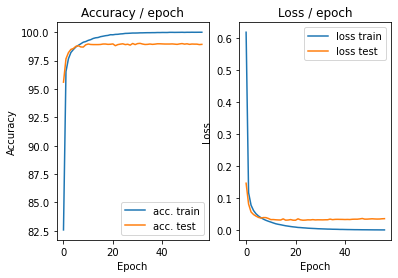

=== EPOCH 58 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0008 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


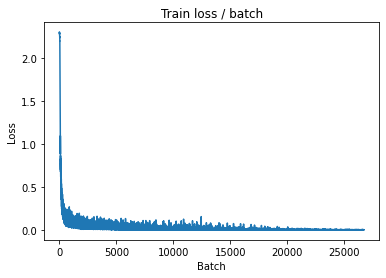

[TRAIN Batch 200/469]	Time 0.018s (0.014s)	Loss 0.0005 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


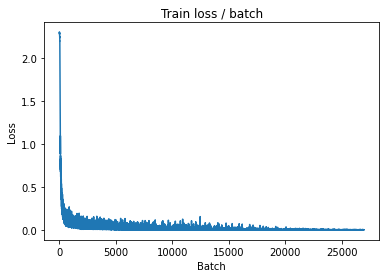

[TRAIN Batch 400/469]	Time 0.004s (0.014s)	Loss 0.0002 (0.0010)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


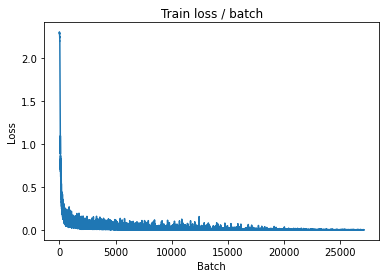


===============> Total time 6s	Avg loss 0.0010	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 0.0598 (0.0598)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0352	Avg Prec@1 98.99 %	Avg Prec@5 100.00 %



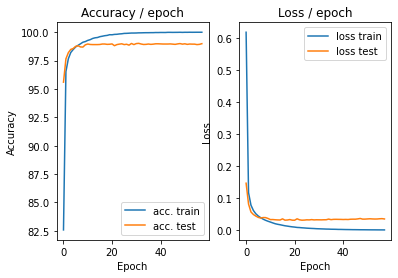

=== EPOCH 59 =====

[TRAIN Batch 000/469]	Time 0.133s (0.133s)	Loss 0.0013 (0.0013)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


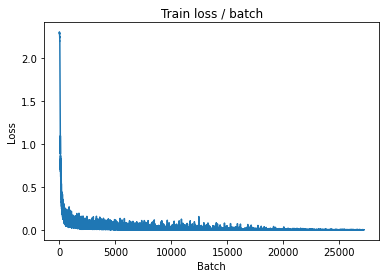

[TRAIN Batch 200/469]	Time 0.018s (0.013s)	Loss 0.0007 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


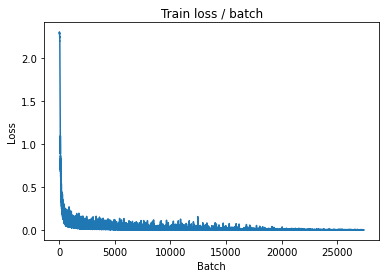

[TRAIN Batch 400/469]	Time 0.015s (0.013s)	Loss 0.0006 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


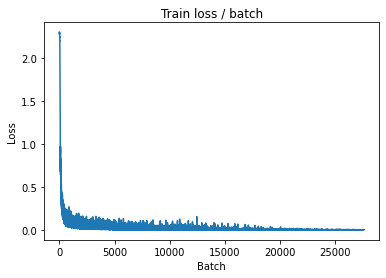


===============> Total time 6s	Avg loss 0.0009	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0616 (0.0616)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0355	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



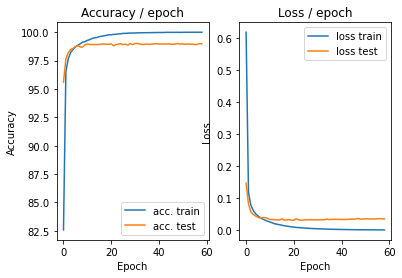

=== EPOCH 60 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


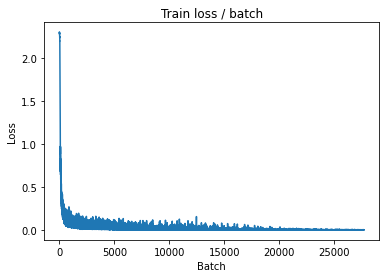

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0004 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


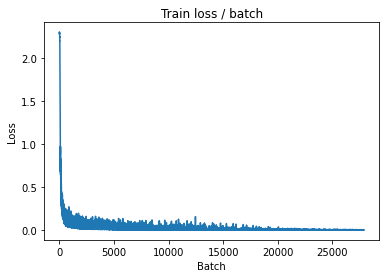

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0003 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


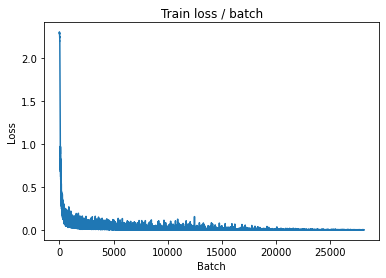


===============> Total time 6s	Avg loss 0.0009	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.105s (0.105s)	Loss 0.0581 (0.0581)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0356	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



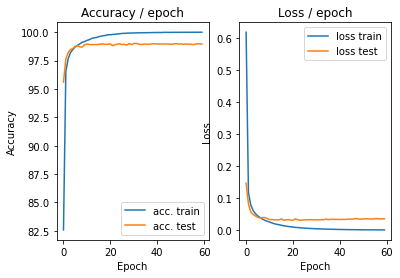

=== EPOCH 61 =====

[TRAIN Batch 000/469]	Time 0.130s (0.130s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


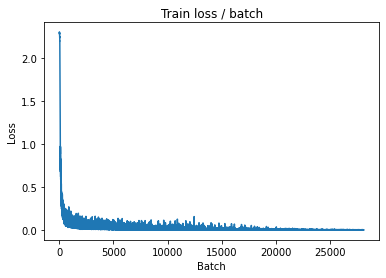

[TRAIN Batch 200/469]	Time 0.004s (0.014s)	Loss 0.0021 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


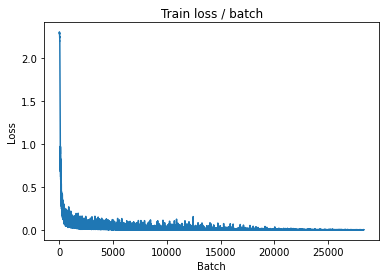

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0010 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


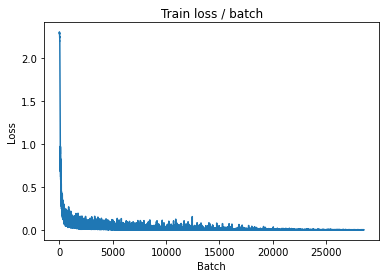


===============> Total time 6s	Avg loss 0.0009	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0610 (0.0610)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0369	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



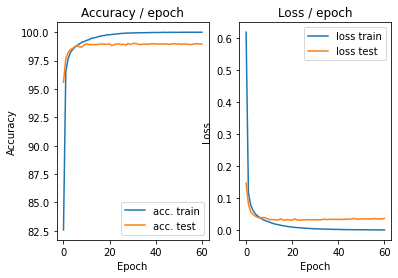

=== EPOCH 62 =====

[TRAIN Batch 000/469]	Time 0.117s (0.117s)	Loss 0.0009 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


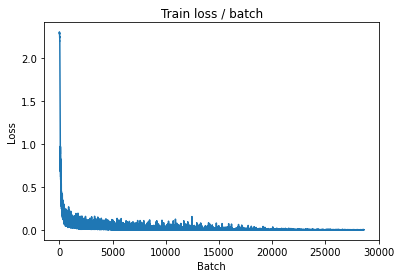

[TRAIN Batch 200/469]	Time 0.021s (0.013s)	Loss 0.0003 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


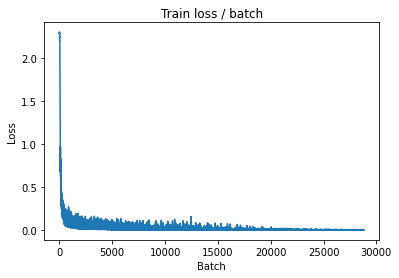

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0006 (0.0009)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


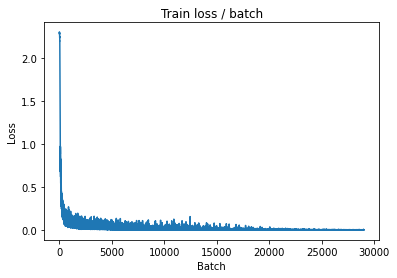


===============> Total time 6s	Avg loss 0.0008	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.107s (0.107s)	Loss 0.0581 (0.0581)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0363	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



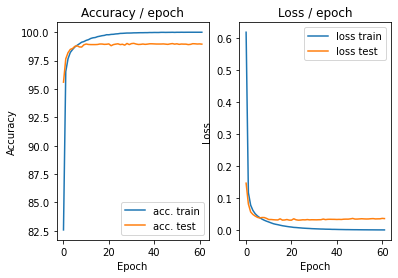

=== EPOCH 63 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


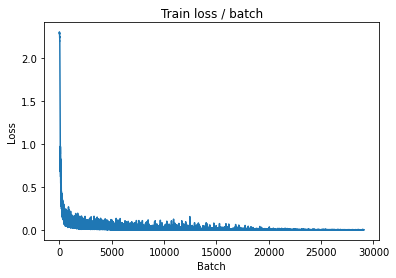

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0007 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


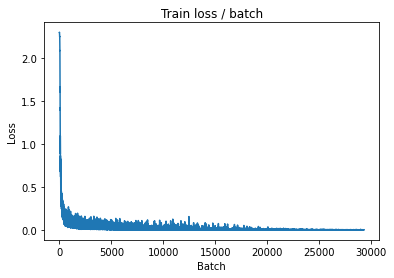

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0016 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


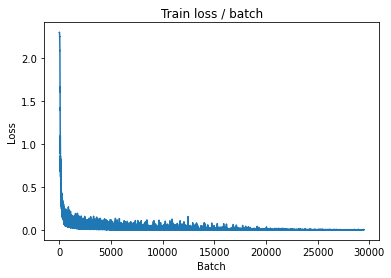


===============> Total time 6s	Avg loss 0.0008	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0592 (0.0592)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0364	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



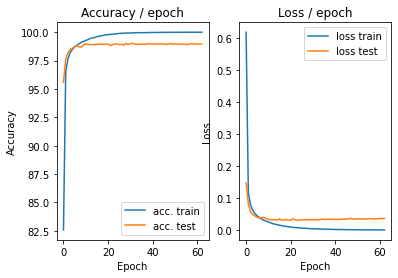

=== EPOCH 64 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


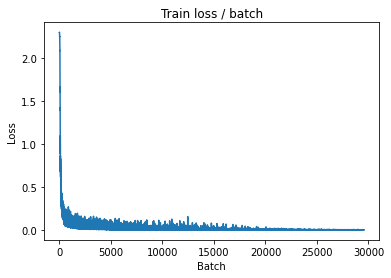

[TRAIN Batch 200/469]	Time 0.016s (0.015s)	Loss 0.0003 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


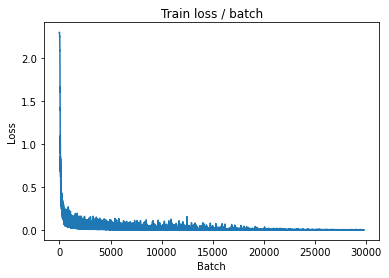

[TRAIN Batch 400/469]	Time 0.005s (0.014s)	Loss 0.0005 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


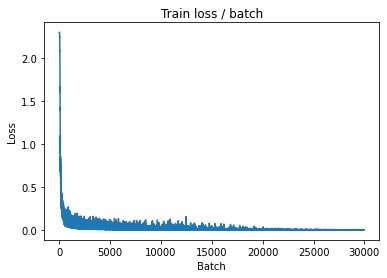


===============> Total time 6s	Avg loss 0.0008	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 0.0574 (0.0574)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0363	Avg Prec@1 98.94 %	Avg Prec@5 100.00 %



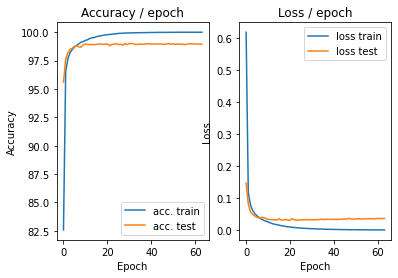

=== EPOCH 65 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


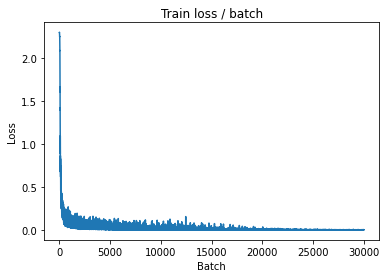

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0003 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


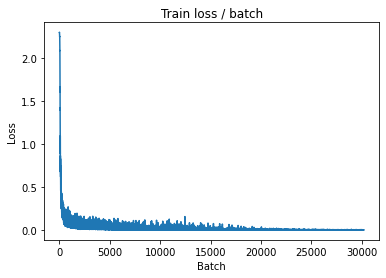

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0009 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


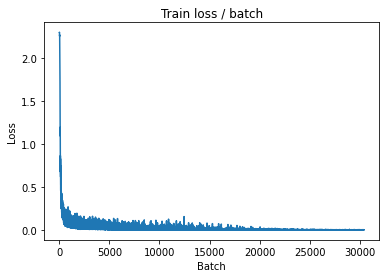


===============> Total time 6s	Avg loss 0.0008	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0571 (0.0571)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0364	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



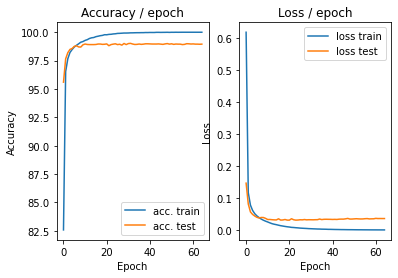

=== EPOCH 66 =====

[TRAIN Batch 000/469]	Time 0.126s (0.126s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


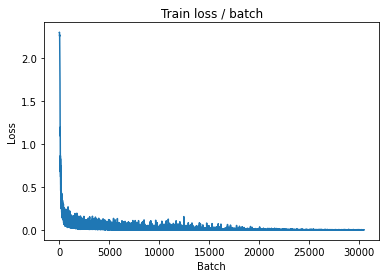

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0008 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


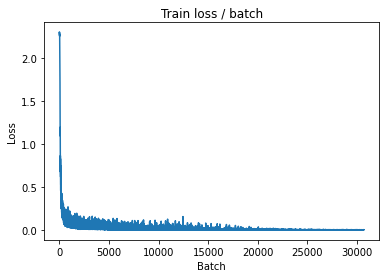

[TRAIN Batch 400/469]	Time 0.016s (0.013s)	Loss 0.0014 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


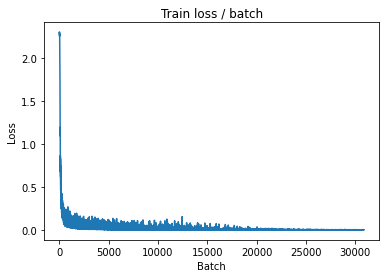


===============> Total time 6s	Avg loss 0.0008	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0585 (0.0585)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0365	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



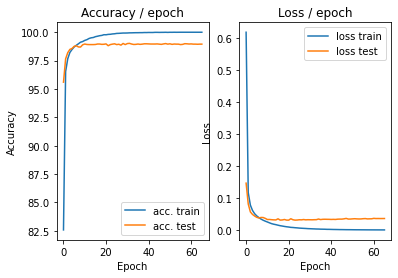

=== EPOCH 67 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


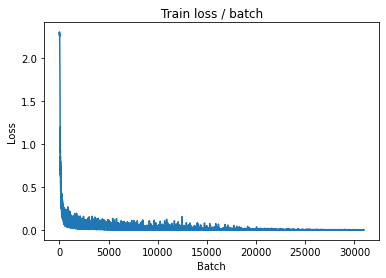

[TRAIN Batch 200/469]	Time 0.020s (0.015s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


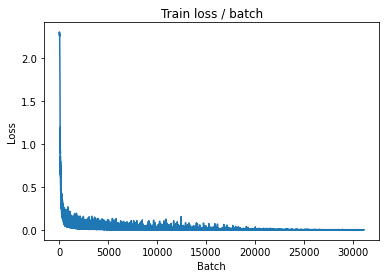

[TRAIN Batch 400/469]	Time 0.004s (0.014s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


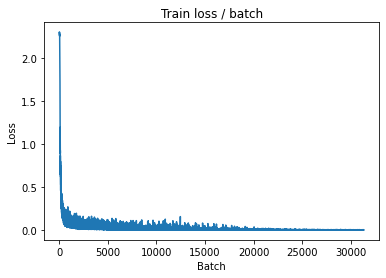


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 0.0616 (0.0616)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0364	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



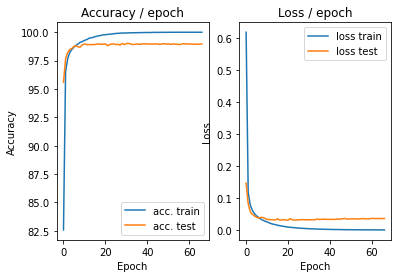

=== EPOCH 68 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0011 (0.0011)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


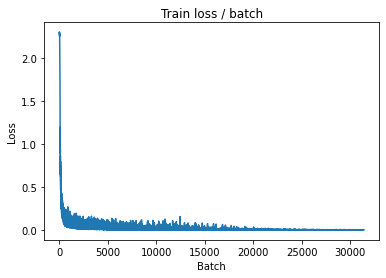

[TRAIN Batch 200/469]	Time 0.014s (0.013s)	Loss 0.0004 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


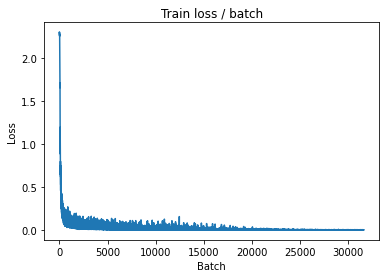

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0009 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


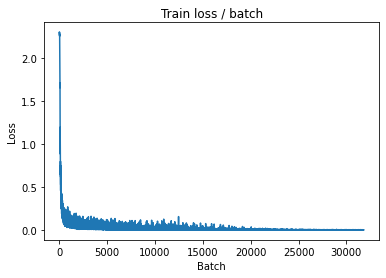


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 0.0662 (0.0662)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0369	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



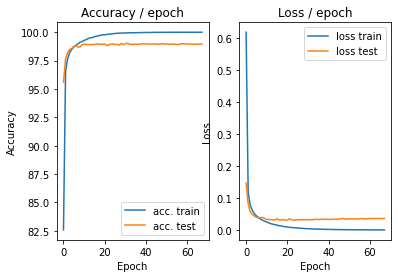

=== EPOCH 69 =====

[TRAIN Batch 000/469]	Time 0.126s (0.126s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


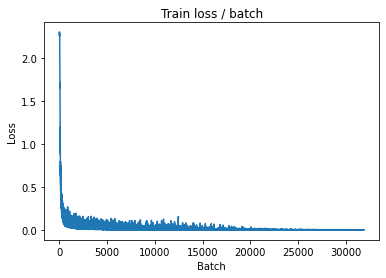

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0008 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


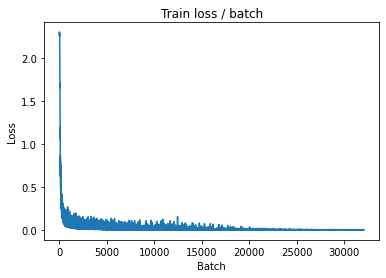

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0008 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


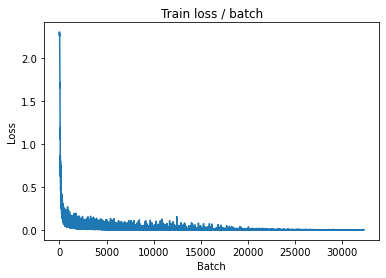


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0630 (0.0630)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0367	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



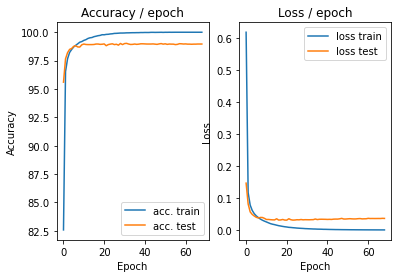

=== EPOCH 70 =====

[TRAIN Batch 000/469]	Time 0.131s (0.131s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


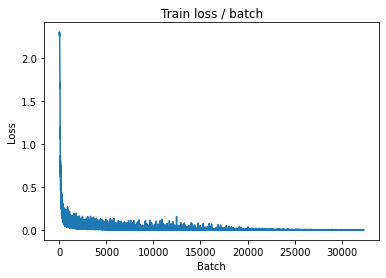

[TRAIN Batch 200/469]	Time 0.008s (0.014s)	Loss 0.0005 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


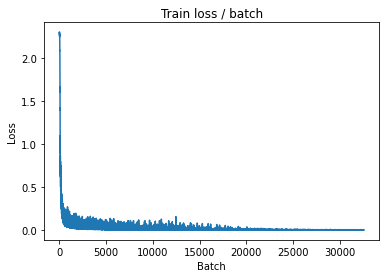

[TRAIN Batch 400/469]	Time 0.015s (0.013s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


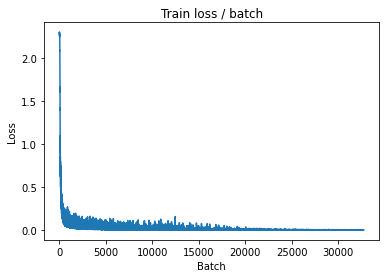


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0594 (0.0594)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0366	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



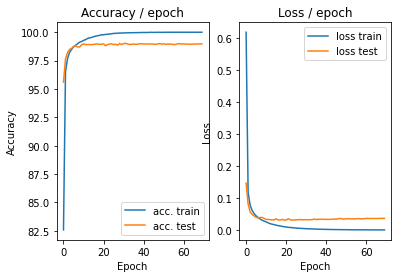

=== EPOCH 71 =====

[TRAIN Batch 000/469]	Time 0.130s (0.130s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


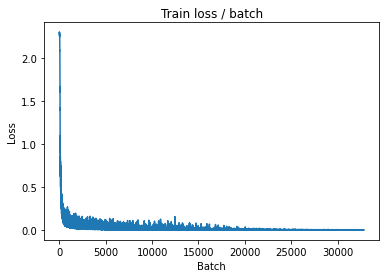

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0003 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


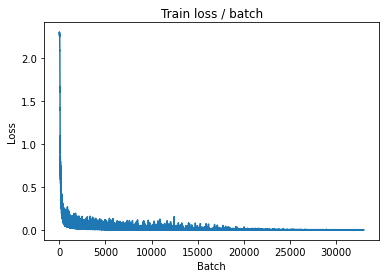

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0001 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


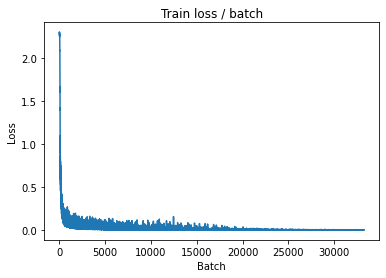


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 0.0644 (0.0644)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0368	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



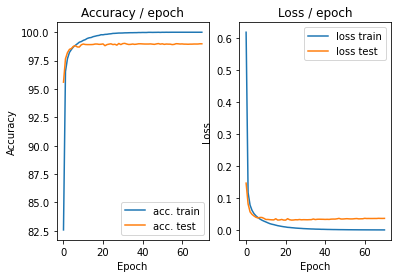

=== EPOCH 72 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0008 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


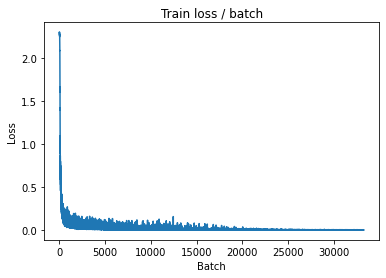

[TRAIN Batch 200/469]	Time 0.021s (0.013s)	Loss 0.0005 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


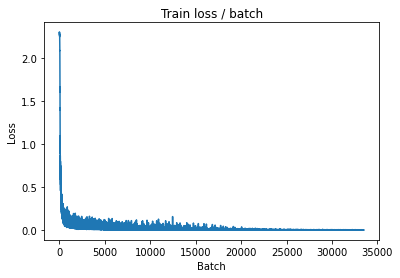

[TRAIN Batch 400/469]	Time 0.010s (0.013s)	Loss 0.0008 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


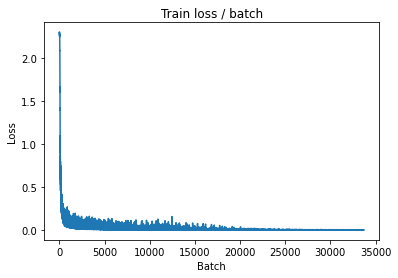


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 0.0637 (0.0637)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0366	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



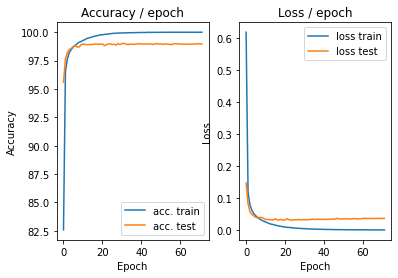

=== EPOCH 73 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


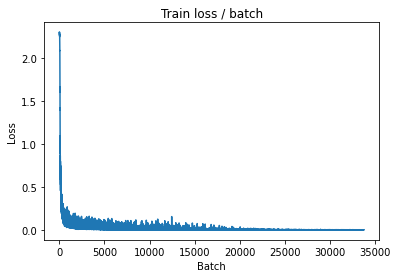

[TRAIN Batch 200/469]	Time 0.020s (0.014s)	Loss 0.0007 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


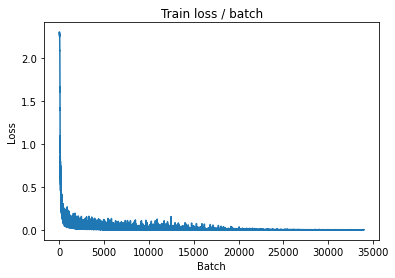

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0013 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


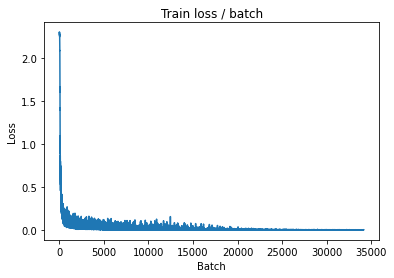


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0586 (0.0586)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0367	Avg Prec@1 98.93 %	Avg Prec@5 100.00 %



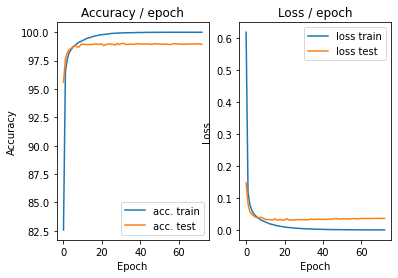

=== EPOCH 74 =====

[TRAIN Batch 000/469]	Time 0.133s (0.133s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


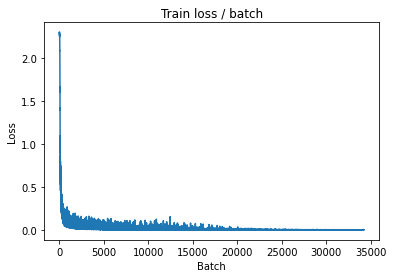

[TRAIN Batch 200/469]	Time 0.024s (0.014s)	Loss 0.0008 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


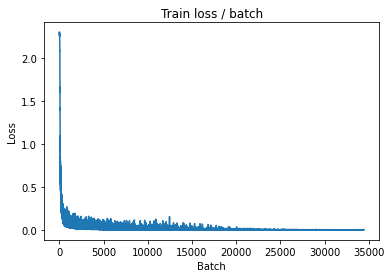

[TRAIN Batch 400/469]	Time 0.018s (0.013s)	Loss 0.0004 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


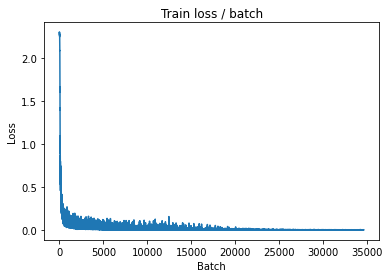


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 0.0599 (0.0599)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0362	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



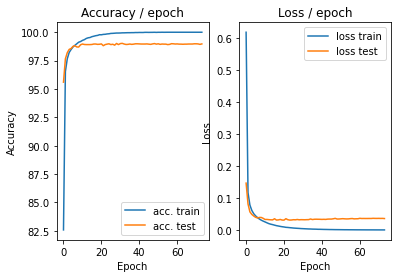

=== EPOCH 75 =====

[TRAIN Batch 000/469]	Time 0.121s (0.121s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


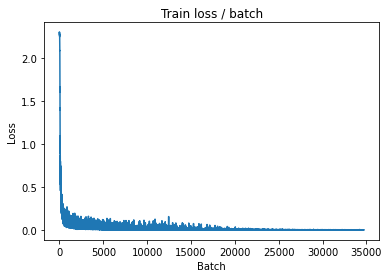

[TRAIN Batch 200/469]	Time 0.015s (0.013s)	Loss 0.0000 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


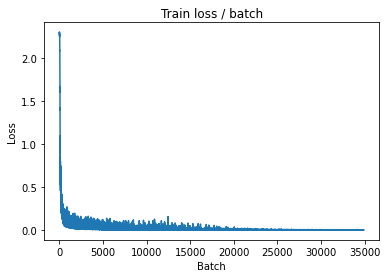

[TRAIN Batch 400/469]	Time 0.016s (0.013s)	Loss 0.0007 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


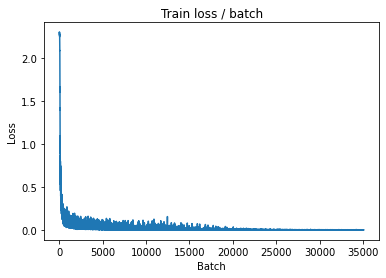


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0637 (0.0637)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0366	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



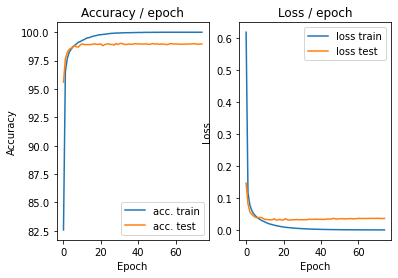

=== EPOCH 76 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


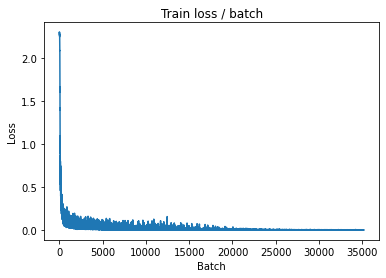

[TRAIN Batch 200/469]	Time 0.004s (0.014s)	Loss 0.0011 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


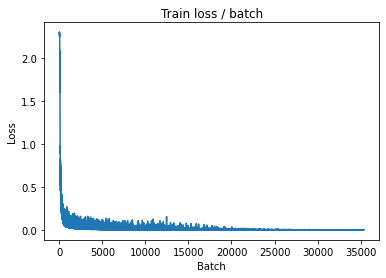

[TRAIN Batch 400/469]	Time 0.019s (0.014s)	Loss 0.0005 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


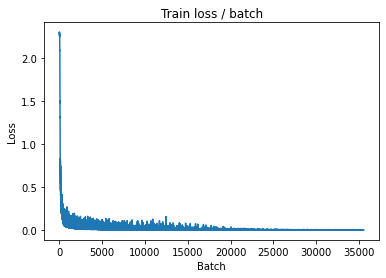


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 0.0621 (0.0621)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0366	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



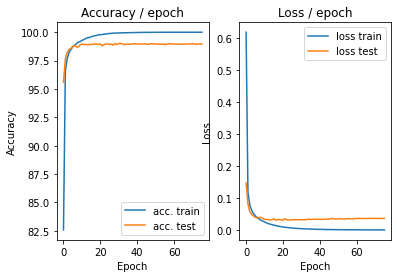

=== EPOCH 77 =====

[TRAIN Batch 000/469]	Time 0.128s (0.128s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


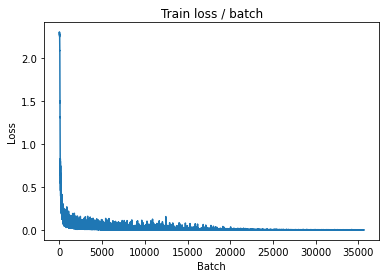

[TRAIN Batch 200/469]	Time 0.011s (0.013s)	Loss 0.0004 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


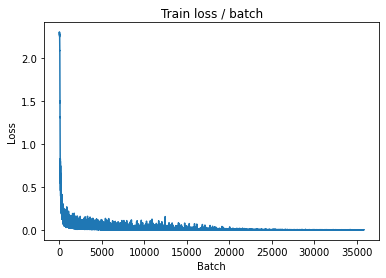

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0004 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


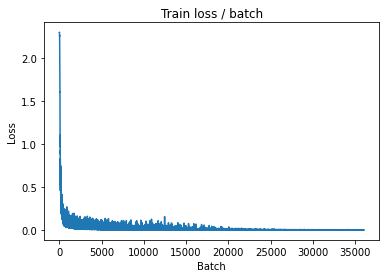


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0628 (0.0628)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0367	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



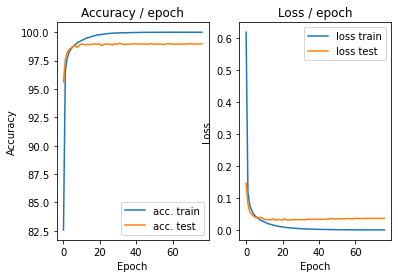

=== EPOCH 78 =====

[TRAIN Batch 000/469]	Time 0.130s (0.130s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


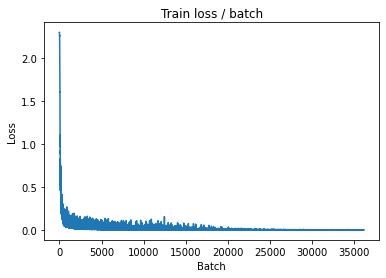

[TRAIN Batch 200/469]	Time 0.021s (0.013s)	Loss 0.0002 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


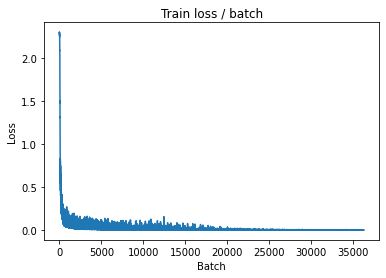

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0004 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


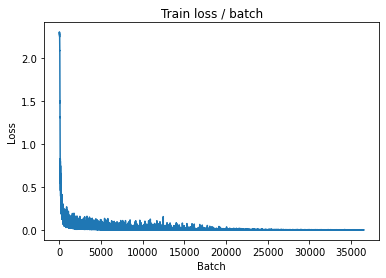


===============> Total time 6s	Avg loss 0.0006	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 0.0659 (0.0659)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0368	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



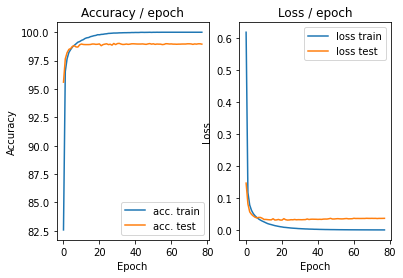

=== EPOCH 79 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


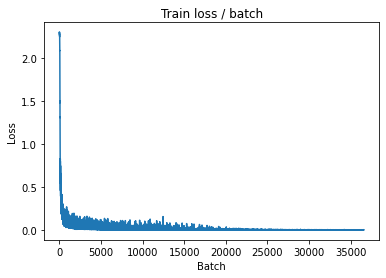

[TRAIN Batch 200/469]	Time 0.005s (0.014s)	Loss 0.0003 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


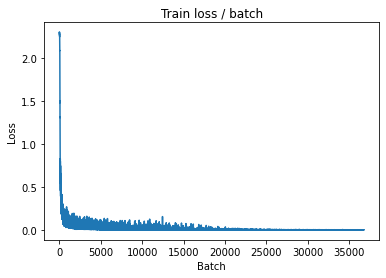

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0016 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


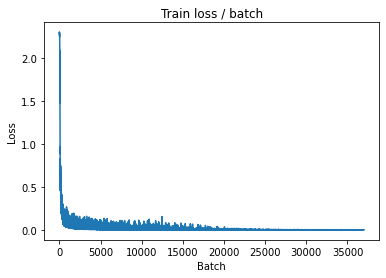


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 0.0642 (0.0642)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0368	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



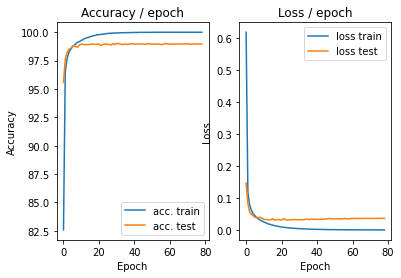

=== EPOCH 80 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


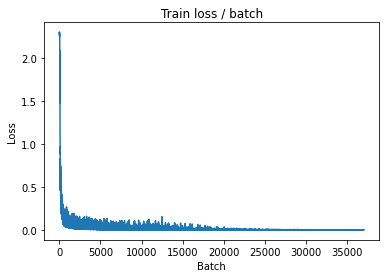

[TRAIN Batch 200/469]	Time 0.014s (0.013s)	Loss 0.0009 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


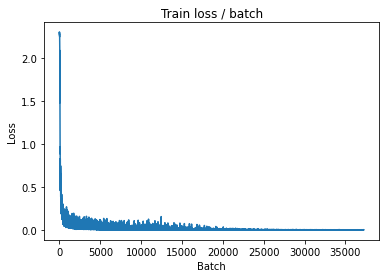

[TRAIN Batch 400/469]	Time 0.020s (0.013s)	Loss 0.0007 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


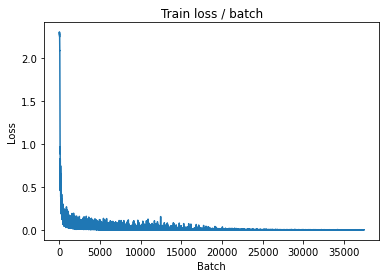


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 0.0672 (0.0672)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0369	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



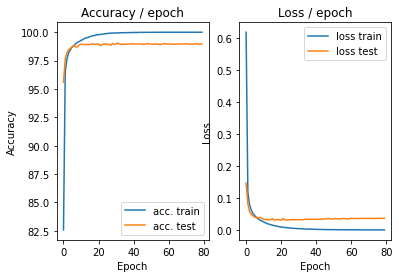

=== EPOCH 81 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


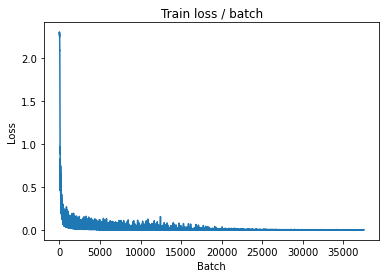

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0006 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


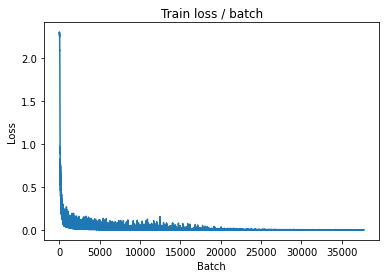

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0002 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


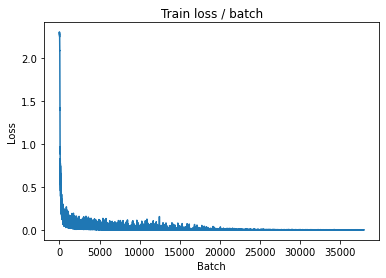


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 0.0649 (0.0649)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0372	Avg Prec@1 98.94 %	Avg Prec@5 100.00 %



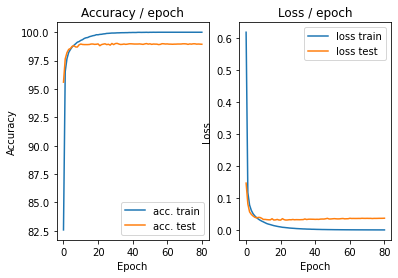

=== EPOCH 82 =====

[TRAIN Batch 000/469]	Time 0.127s (0.127s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


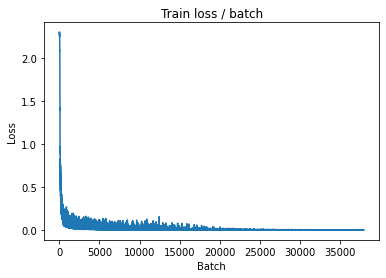

[TRAIN Batch 200/469]	Time 0.020s (0.014s)	Loss 0.0006 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


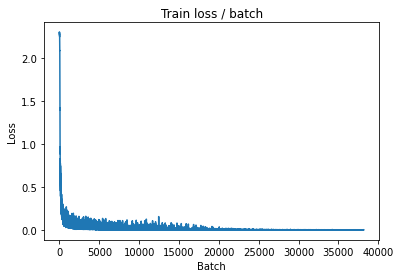

[TRAIN Batch 400/469]	Time 0.008s (0.013s)	Loss 0.0003 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


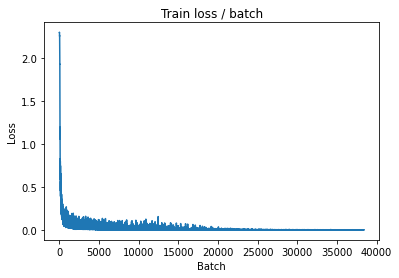


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0673 (0.0673)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0369	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



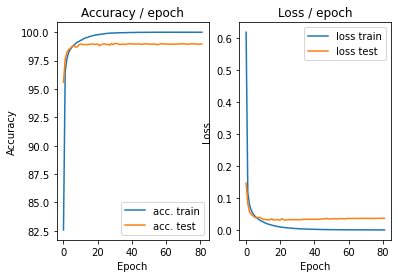

=== EPOCH 83 =====

[TRAIN Batch 000/469]	Time 0.114s (0.114s)	Loss 0.0007 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


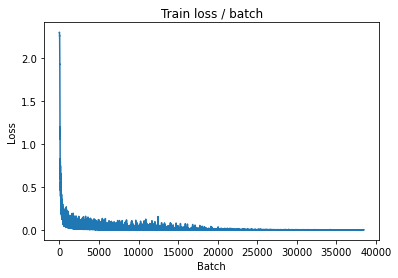

[TRAIN Batch 200/469]	Time 0.022s (0.013s)	Loss 0.0002 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


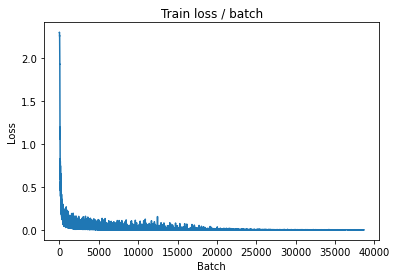

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0013 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


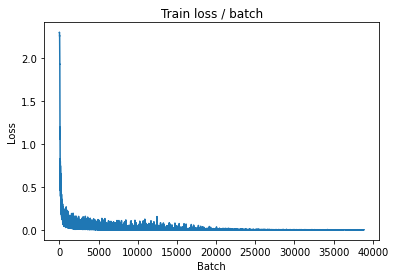


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.114s (0.114s)	Loss 0.0655 (0.0655)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0374	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



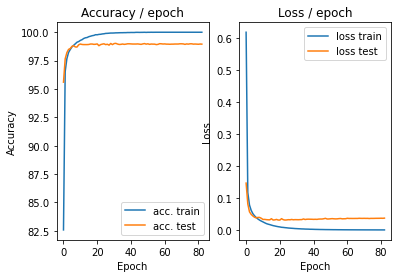

=== EPOCH 84 =====

[TRAIN Batch 000/469]	Time 0.133s (0.133s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


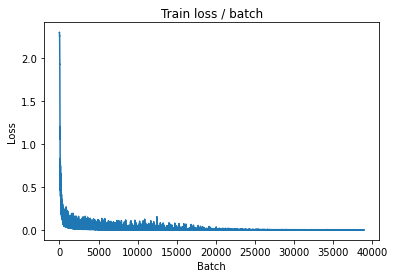

[TRAIN Batch 200/469]	Time 0.008s (0.013s)	Loss 0.0004 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


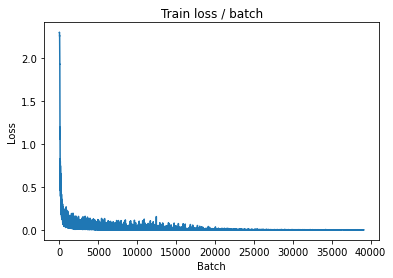

[TRAIN Batch 400/469]	Time 0.022s (0.013s)	Loss 0.0002 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


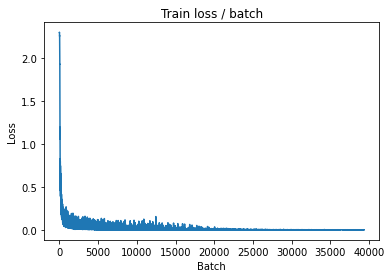


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0730 (0.0730)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0376	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



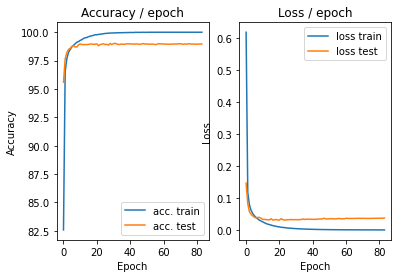

=== EPOCH 85 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


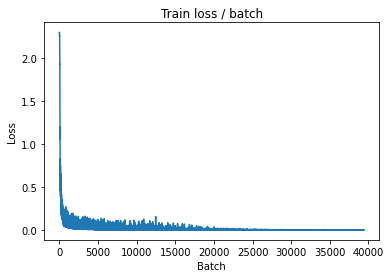

[TRAIN Batch 200/469]	Time 0.017s (0.013s)	Loss 0.0004 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


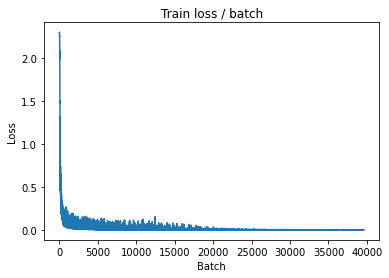

[TRAIN Batch 400/469]	Time 0.016s (0.013s)	Loss 0.0009 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


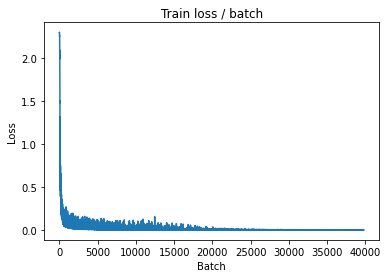


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 0.0668 (0.0668)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0375	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



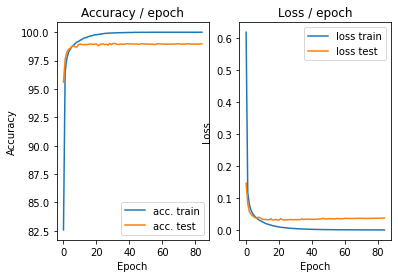

=== EPOCH 86 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


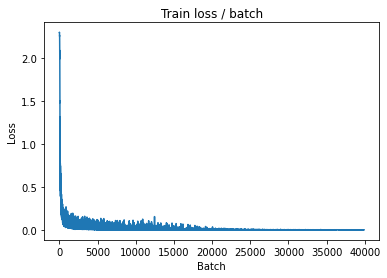

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0006 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


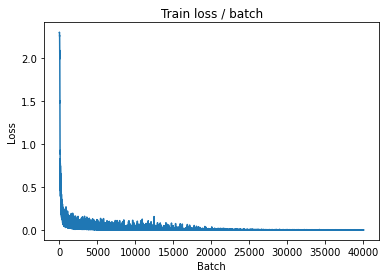

[TRAIN Batch 400/469]	Time 0.011s (0.013s)	Loss 0.0003 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


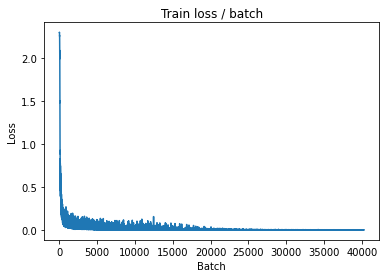


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 0.0699 (0.0699)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0374	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



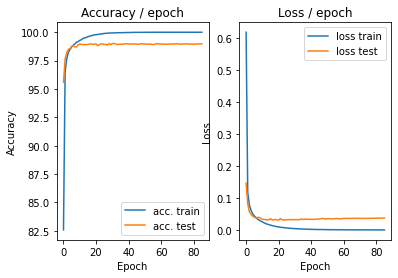

=== EPOCH 87 =====

[TRAIN Batch 000/469]	Time 0.117s (0.117s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


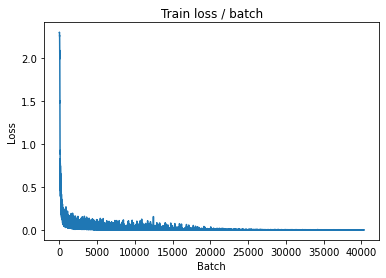

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


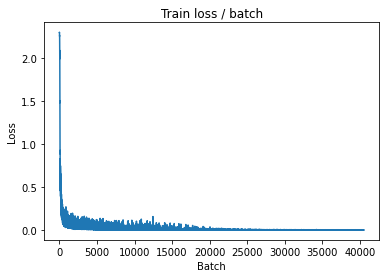

[TRAIN Batch 400/469]	Time 0.022s (0.013s)	Loss 0.0007 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


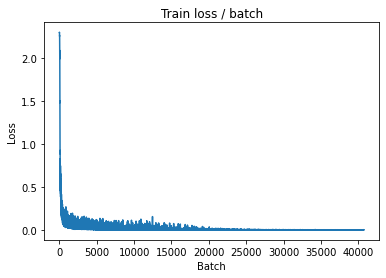


===============> Total time 6s	Avg loss 0.0005	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0697 (0.0697)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0372	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



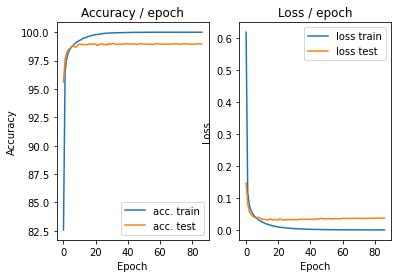

=== EPOCH 88 =====

[TRAIN Batch 000/469]	Time 0.112s (0.112s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


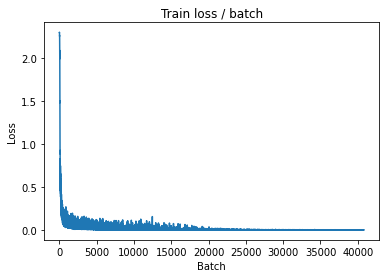

[TRAIN Batch 200/469]	Time 0.013s (0.013s)	Loss 0.0006 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


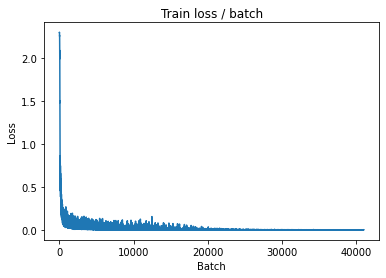

[TRAIN Batch 400/469]	Time 0.020s (0.013s)	Loss 0.0011 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


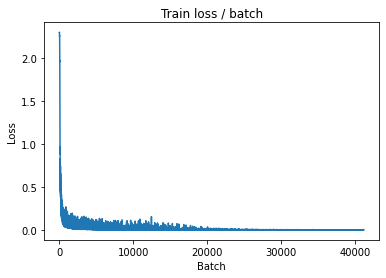


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.108s (0.108s)	Loss 0.0707 (0.0707)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0373	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



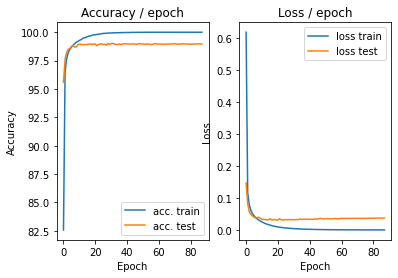

=== EPOCH 89 =====

[TRAIN Batch 000/469]	Time 0.112s (0.112s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


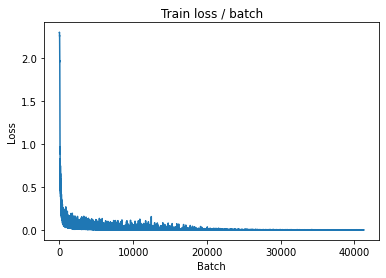

[TRAIN Batch 200/469]	Time 0.022s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


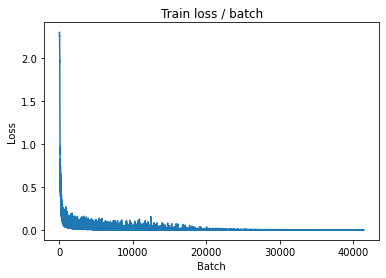

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0005 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


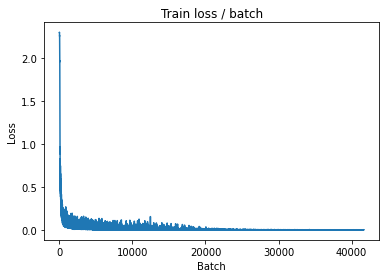


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 0.0675 (0.0675)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0371	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



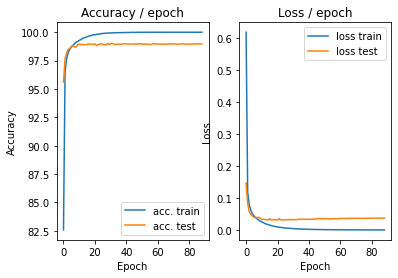

=== EPOCH 90 =====

[TRAIN Batch 000/469]	Time 0.119s (0.119s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


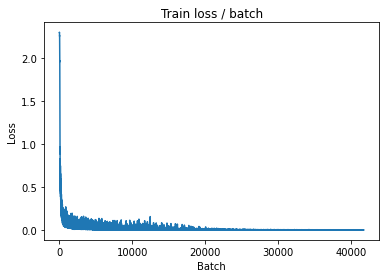

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0007 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


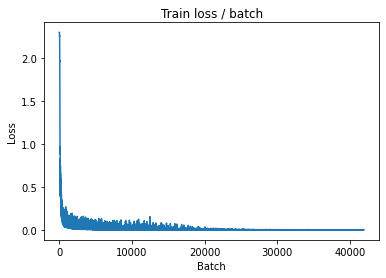

[TRAIN Batch 400/469]	Time 0.020s (0.013s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


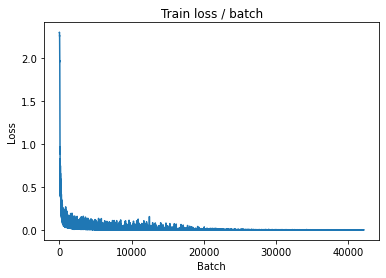


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.109s (0.109s)	Loss 0.0683 (0.0683)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0373	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



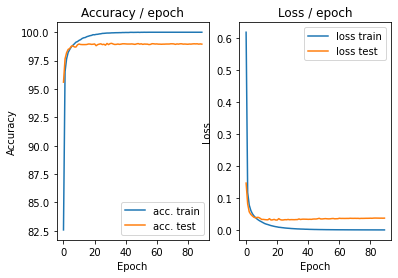

=== EPOCH 91 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


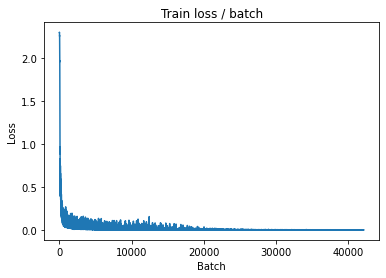

[TRAIN Batch 200/469]	Time 0.017s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


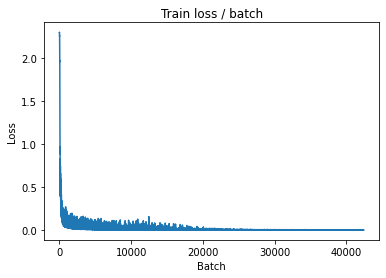

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0007 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


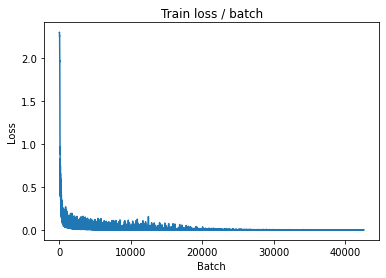


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.102s (0.102s)	Loss 0.0671 (0.0671)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0374	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



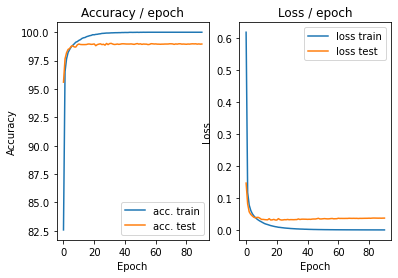

=== EPOCH 92 =====

[TRAIN Batch 000/469]	Time 0.122s (0.122s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


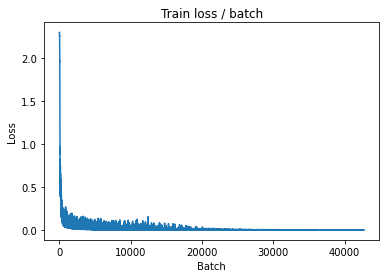

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0012 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


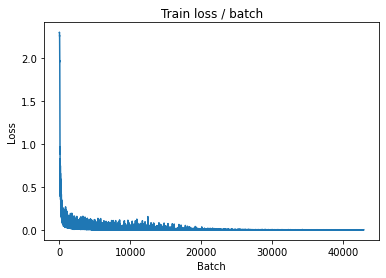

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0013 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


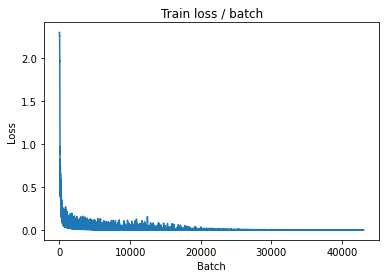


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 0.0712 (0.0712)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0376	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



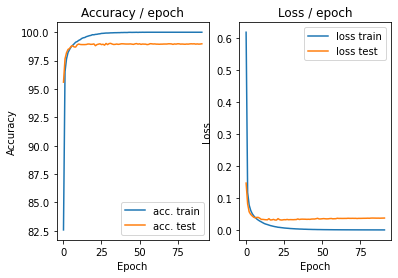

=== EPOCH 93 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


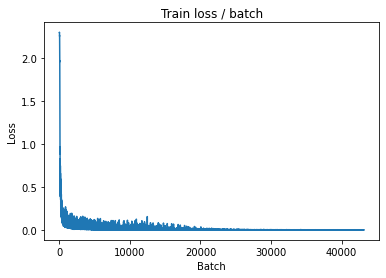

[TRAIN Batch 200/469]	Time 0.007s (0.014s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


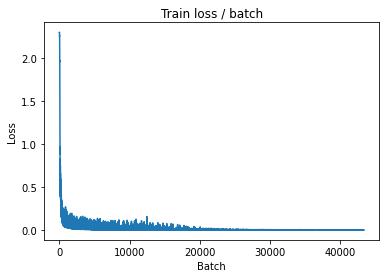

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


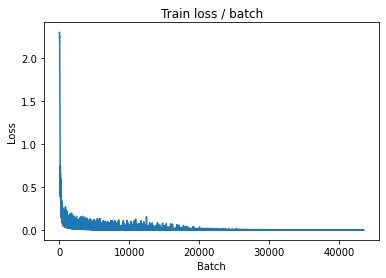


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 0.0718 (0.0718)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0375	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



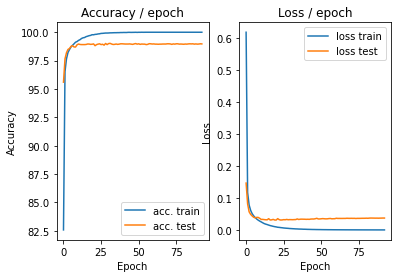

=== EPOCH 94 =====

[TRAIN Batch 000/469]	Time 0.134s (0.134s)	Loss 0.0005 (0.0005)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


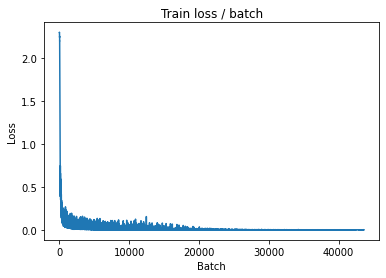

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0002 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


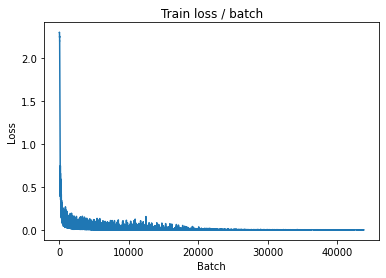

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0007 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


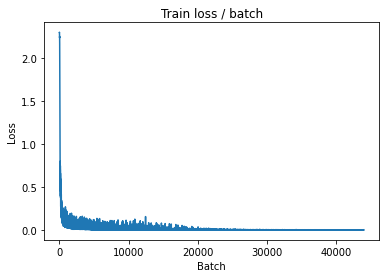


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0681 (0.0681)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0375	Avg Prec@1 98.98 %	Avg Prec@5 100.00 %



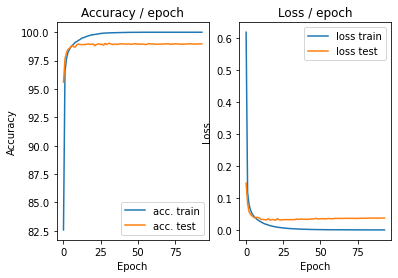

=== EPOCH 95 =====

[TRAIN Batch 000/469]	Time 0.113s (0.113s)	Loss 0.0006 (0.0006)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


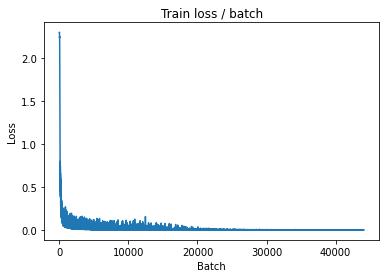

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


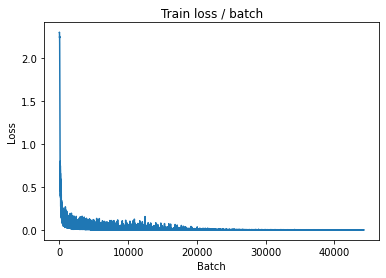

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


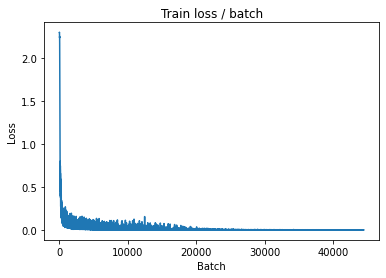


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0707 (0.0707)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0376	Avg Prec@1 98.95 %	Avg Prec@5 100.00 %



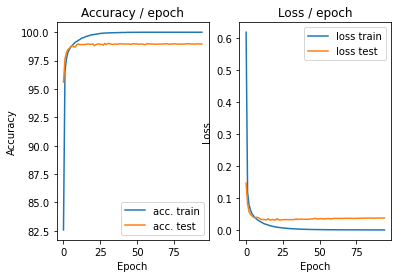

=== EPOCH 96 =====

[TRAIN Batch 000/469]	Time 0.124s (0.124s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


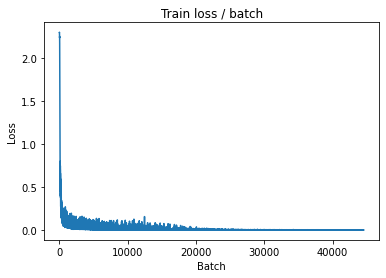

[TRAIN Batch 200/469]	Time 0.020s (0.015s)	Loss 0.0001 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


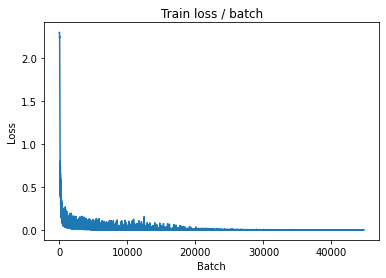

[TRAIN Batch 400/469]	Time 0.023s (0.014s)	Loss 0.0001 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


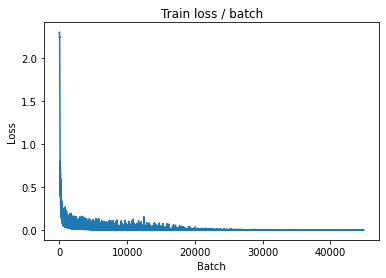


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0700 (0.0700)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0377	Avg Prec@1 98.94 %	Avg Prec@5 100.00 %



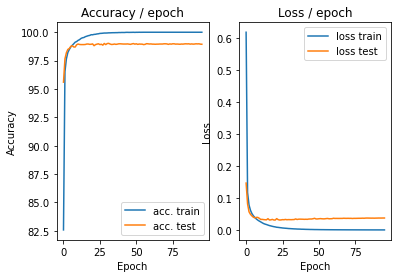

=== EPOCH 97 =====

[TRAIN Batch 000/469]	Time 0.126s (0.126s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


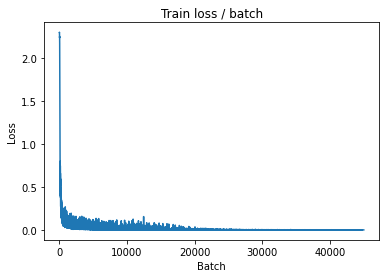

[TRAIN Batch 200/469]	Time 0.018s (0.013s)	Loss 0.0001 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


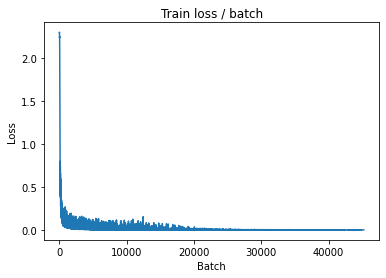

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


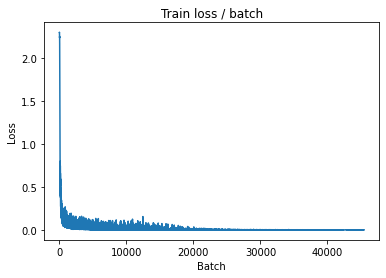


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 0.0700 (0.0700)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0378	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



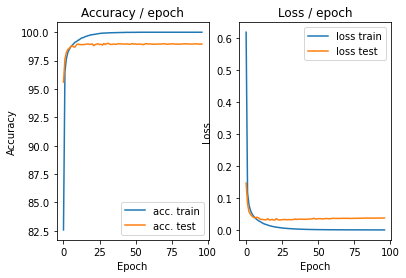

=== EPOCH 98 =====

[TRAIN Batch 000/469]	Time 0.123s (0.123s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


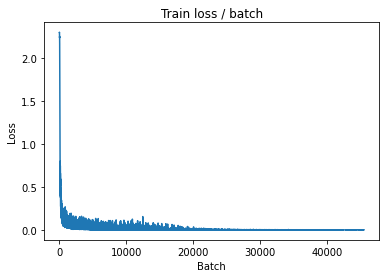

[TRAIN Batch 200/469]	Time 0.004s (0.013s)	Loss 0.0007 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


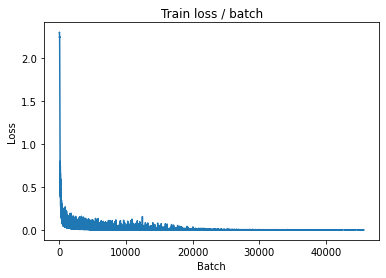

[TRAIN Batch 400/469]	Time 0.004s (0.013s)	Loss 0.0001 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


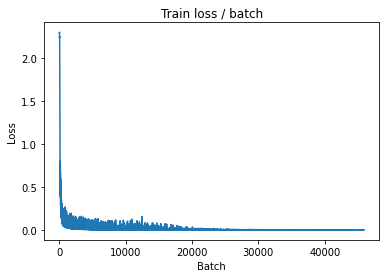


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 0.0712 (0.0712)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0380	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



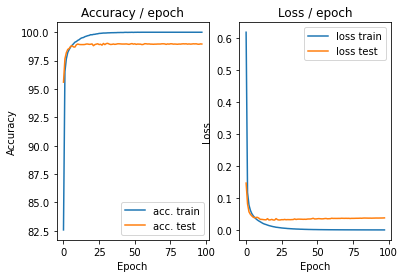

=== EPOCH 99 =====

[TRAIN Batch 000/469]	Time 0.129s (0.129s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


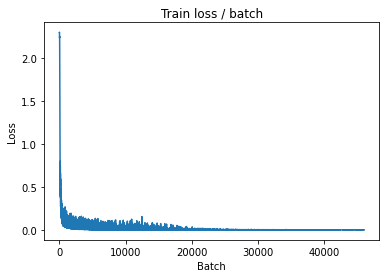

[TRAIN Batch 200/469]	Time 0.004s (0.014s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


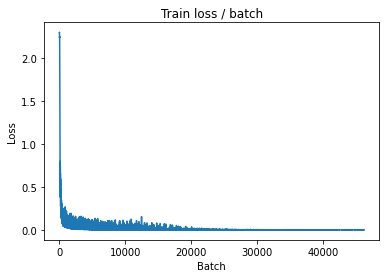

[TRAIN Batch 400/469]	Time 0.017s (0.013s)	Loss 0.0006 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


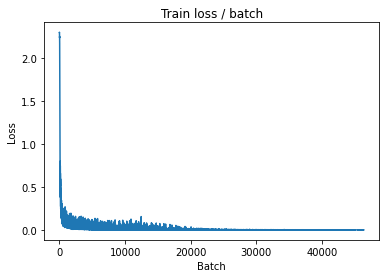


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.0743 (0.0743)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0380	Avg Prec@1 98.96 %	Avg Prec@5 100.00 %



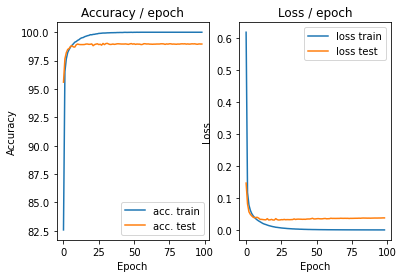

=== EPOCH 100 =====

[TRAIN Batch 000/469]	Time 0.125s (0.125s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


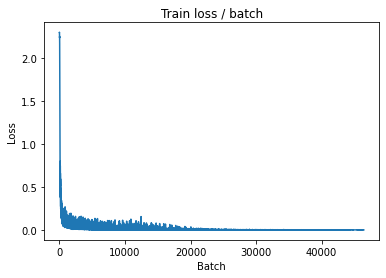

[TRAIN Batch 200/469]	Time 0.020s (0.013s)	Loss 0.0003 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


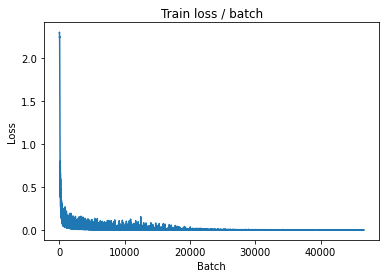

[TRAIN Batch 400/469]	Time 0.005s (0.013s)	Loss 0.0004 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


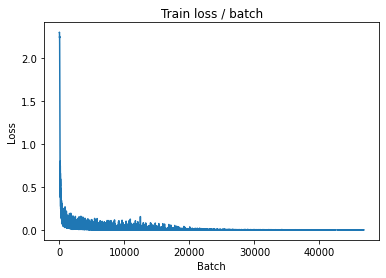


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 0.0703 (0.0703)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)

===============> Total time 0s	Avg loss 0.0379	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %



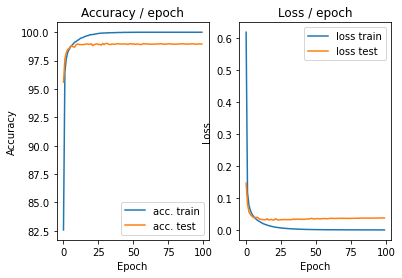

In [ ]:
main(128, 0.1, cuda=True)

In [ ]:
class ConvNetAlex(nn.Module):

    def __init__(self):
        super(ConvNetAlex, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10), )
        
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
def main(batch_size=128, lr=0.1, epochs=100, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)



Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified

=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.283s (0.283s)	Loss 2.3042 (2.3042)	Prec@1   7.0 (  7.0)	Prec@5  49.2 ( 49.2)


<Figure size 432x288 with 0 Axes>

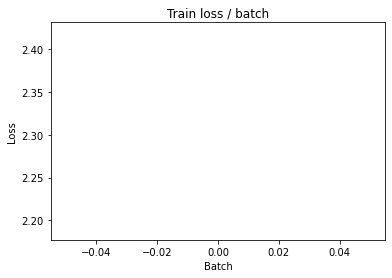

[TRAIN Batch 200/391]	Time 0.022s (0.018s)	Loss 2.1532 (2.2563)	Prec@1  25.8 ( 14.6)	Prec@5  65.6 ( 60.5)


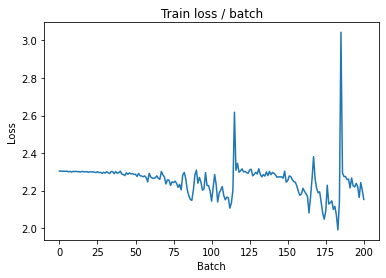


===============> Total time 6s	Avg loss 2.1378	Avg Prec@1 20.87 %	Avg Prec@5 68.87 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.9854 (1.9854)	Prec@1  29.7 ( 29.7)	Prec@5  82.0 ( 82.0)

===============> Total time 1s	Avg loss 1.9593	Avg Prec@1 28.23 %	Avg Prec@5 79.02 %



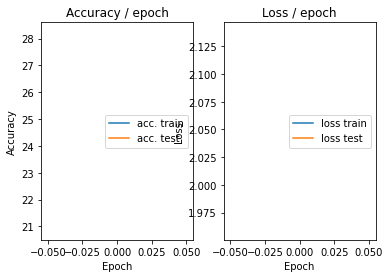

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.124s (0.124s)	Loss 1.9763 (1.9763)	Prec@1  30.5 ( 30.5)	Prec@5  81.2 ( 81.2)


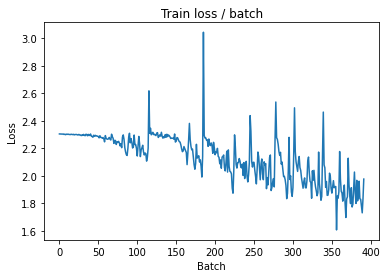

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 1.5846 (1.7594)	Prec@1  42.2 ( 36.8)	Prec@5  89.1 ( 86.5)


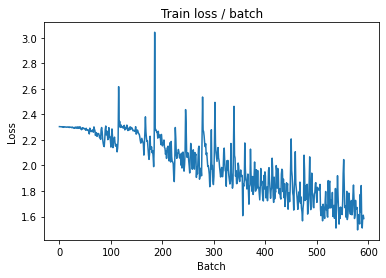


===============> Total time 6s	Avg loss 1.6897	Avg Prec@1 39.33 %	Avg Prec@5 87.92 %

[EVAL Batch 000/079]	Time 0.111s (0.111s)	Loss 1.6222 (1.6222)	Prec@1  43.0 ( 43.0)	Prec@5  89.1 ( 89.1)

===============> Total time 1s	Avg loss 1.6690	Avg Prec@1 39.91 %	Avg Prec@5 87.58 %



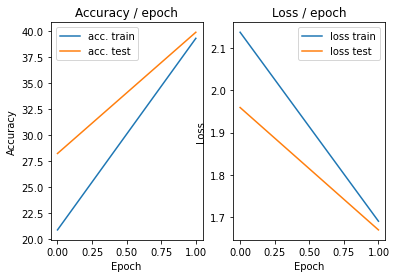

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 1.6105 (1.6105)	Prec@1  40.6 ( 40.6)	Prec@5  88.3 ( 88.3)


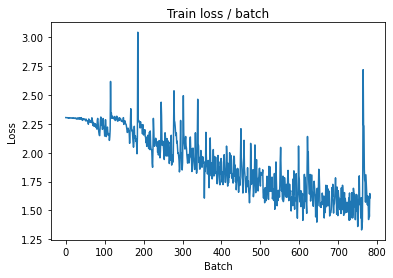

[TRAIN Batch 200/391]	Time 0.026s (0.017s)	Loss 1.3766 (1.4764)	Prec@1  51.6 ( 46.8)	Prec@5  96.9 ( 91.7)


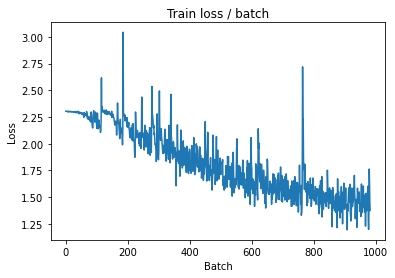


===============> Total time 6s	Avg loss 1.4356	Avg Prec@1 48.51 %	Avg Prec@5 92.31 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 1.2518 (1.2518)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.3253	Avg Prec@1 52.01 %	Avg Prec@5 93.68 %



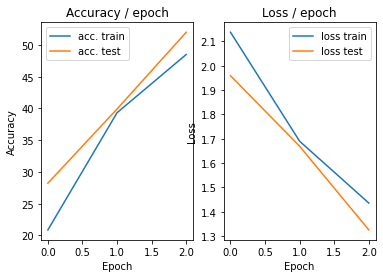

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 1.1740 (1.1740)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


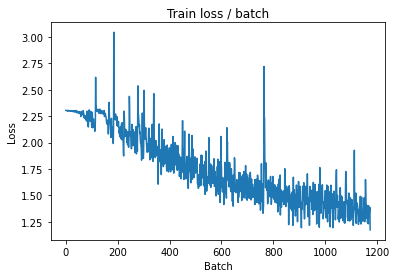

[TRAIN Batch 200/391]	Time 0.011s (0.017s)	Loss 1.4428 (1.2932)	Prec@1  49.2 ( 53.9)	Prec@5  90.6 ( 94.1)


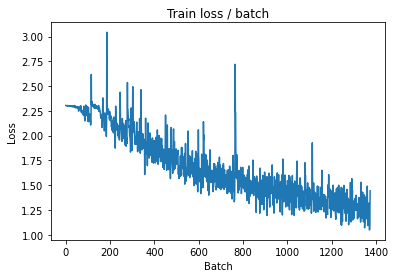


===============> Total time 6s	Avg loss 1.2683	Avg Prec@1 54.71 %	Avg Prec@5 94.43 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.3371 (1.3371)	Prec@1  57.0 ( 57.0)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.4025	Avg Prec@1 50.37 %	Avg Prec@5 92.36 %



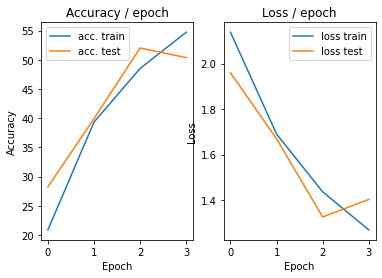

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.128s (0.128s)	Loss 1.5617 (1.5617)	Prec@1  43.0 ( 43.0)	Prec@5  89.1 ( 89.1)


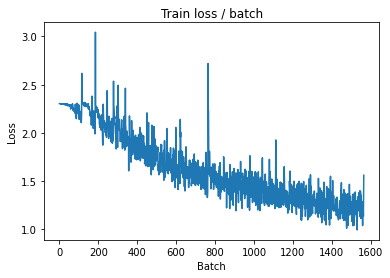

[TRAIN Batch 200/391]	Time 0.012s (0.017s)	Loss 1.0774 (1.1652)	Prec@1  58.6 ( 58.5)	Prec@5  96.9 ( 95.6)


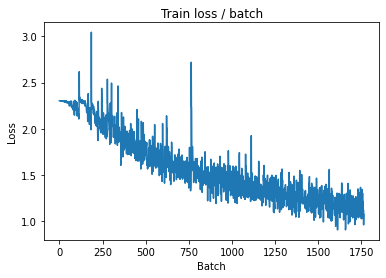


===============> Total time 6s	Avg loss 1.1363	Avg Prec@1 59.62 %	Avg Prec@5 95.78 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.0232 (1.0232)	Prec@1  68.8 ( 68.8)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1100	Avg Prec@1 59.82 %	Avg Prec@5 96.13 %



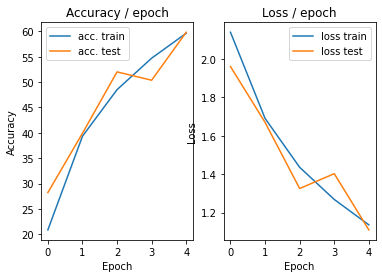

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.9271 (0.9271)	Prec@1  68.0 ( 68.0)	Prec@5  98.4 ( 98.4)


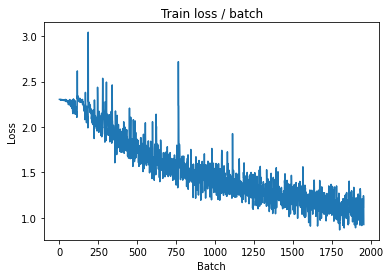

[TRAIN Batch 200/391]	Time 0.023s (0.018s)	Loss 0.9393 (1.0276)	Prec@1  68.8 ( 63.7)	Prec@5  96.1 ( 96.7)


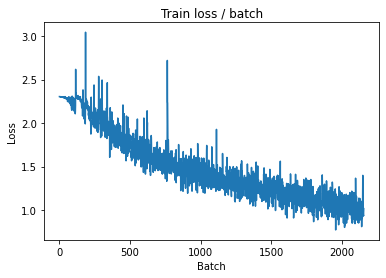


===============> Total time 6s	Avg loss 1.0154	Avg Prec@1 64.31 %	Avg Prec@5 96.69 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 0.9362 (0.9362)	Prec@1  64.1 ( 64.1)	Prec@5  99.2 ( 99.2)

===============> Total time 1s	Avg loss 1.0508	Avg Prec@1 62.60 %	Avg Prec@5 96.44 %



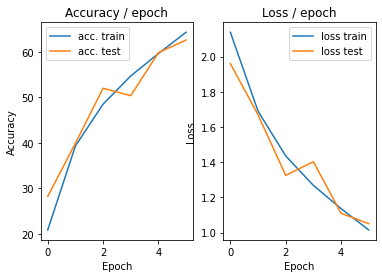

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.7593 (0.7593)	Prec@1  77.3 ( 77.3)	Prec@5  96.9 ( 96.9)


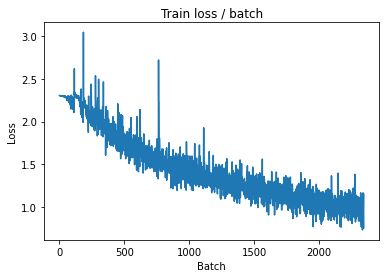

[TRAIN Batch 200/391]	Time 0.011s (0.017s)	Loss 0.9155 (0.9212)	Prec@1  68.0 ( 67.8)	Prec@5  96.1 ( 97.4)


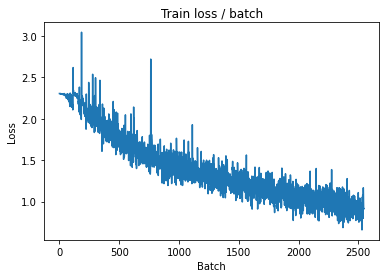


===============> Total time 6s	Avg loss 0.9060	Avg Prec@1 68.28 %	Avg Prec@5 97.55 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.0441 (1.0441)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2298	Avg Prec@1 57.12 %	Avg Prec@5 94.74 %



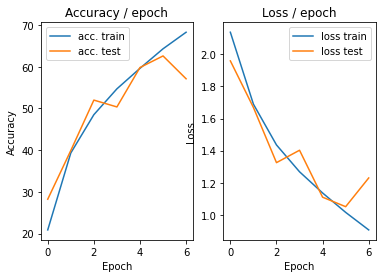

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.118s (0.118s)	Loss 1.0958 (1.0958)	Prec@1  61.7 ( 61.7)	Prec@5  98.4 ( 98.4)


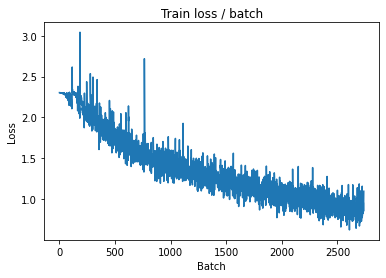

[TRAIN Batch 200/391]	Time 0.022s (0.017s)	Loss 0.8900 (0.8078)	Prec@1  75.0 ( 71.8)	Prec@5  96.1 ( 98.1)


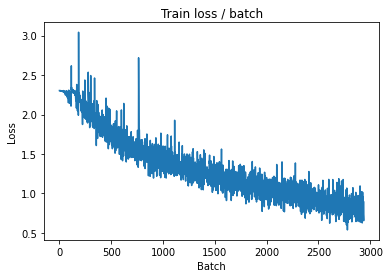


===============> Total time 6s	Avg loss 0.8064	Avg Prec@1 71.96 %	Avg Prec@5 98.03 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 0.8514 (0.8514)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 0.9451	Avg Prec@1 66.73 %	Avg Prec@5 97.11 %



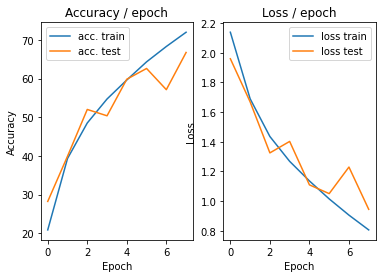

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.7131 (0.7131)	Prec@1  73.4 ( 73.4)	Prec@5 100.0 (100.0)


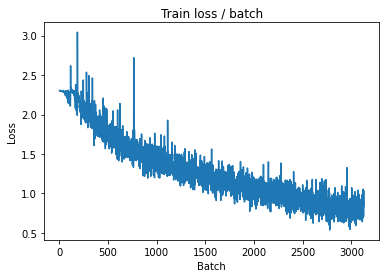

[TRAIN Batch 200/391]	Time 0.023s (0.017s)	Loss 0.7125 (0.7076)	Prec@1  72.7 ( 75.1)	Prec@5  97.7 ( 98.7)


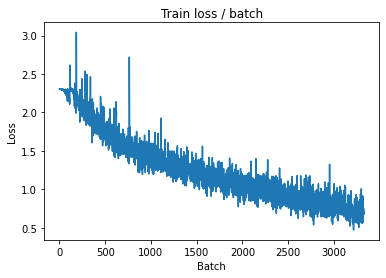


===============> Total time 6s	Avg loss 0.7094	Avg Prec@1 75.16 %	Avg Prec@5 98.65 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 0.7908 (0.7908)	Prec@1  71.9 ( 71.9)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.8878	Avg Prec@1 69.15 %	Avg Prec@5 97.35 %



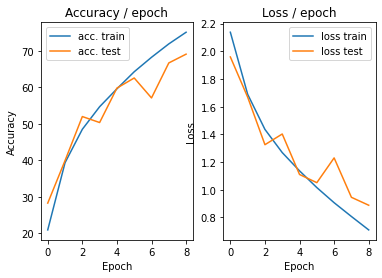

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 0.5296 (0.5296)	Prec@1  85.2 ( 85.2)	Prec@5  97.7 ( 97.7)


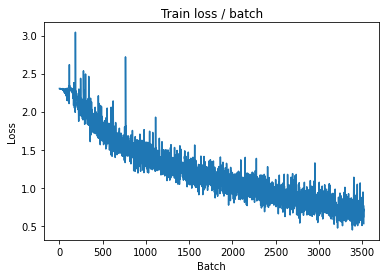

[TRAIN Batch 200/391]	Time 0.012s (0.017s)	Loss 0.6995 (0.6143)	Prec@1  74.2 ( 78.2)	Prec@5 100.0 ( 99.1)


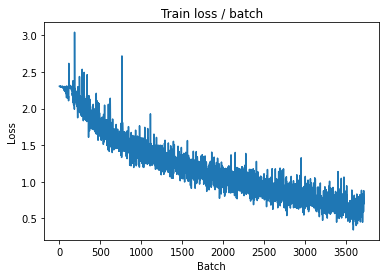


===============> Total time 6s	Avg loss 0.6195	Avg Prec@1 78.16 %	Avg Prec@5 99.02 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 0.8154 (0.8154)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 0.9426	Avg Prec@1 68.22 %	Avg Prec@5 96.77 %



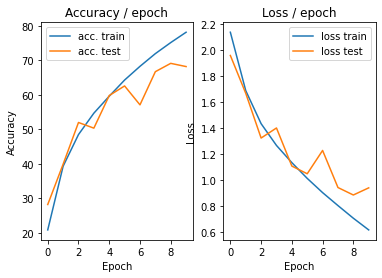

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.5951 (0.5951)	Prec@1  77.3 ( 77.3)	Prec@5 100.0 (100.0)


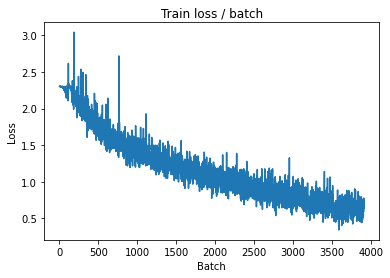

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.5255 (0.5184)	Prec@1  81.2 ( 82.0)	Prec@5 100.0 ( 99.3)


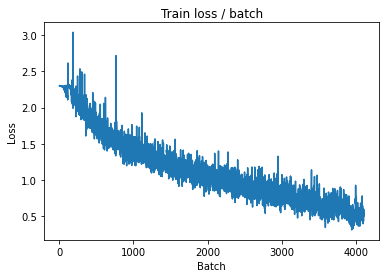


===============> Total time 6s	Avg loss 0.5280	Avg Prec@1 81.61 %	Avg Prec@5 99.29 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 0.8679 (0.8679)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 0.9450	Avg Prec@1 68.81 %	Avg Prec@5 97.36 %



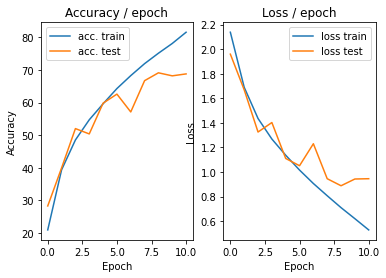

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.144s (0.144s)	Loss 0.4677 (0.4677)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


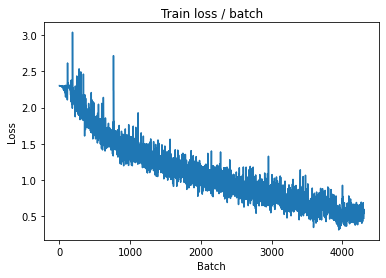

[TRAIN Batch 200/391]	Time 0.021s (0.018s)	Loss 0.6220 (0.4204)	Prec@1  78.9 ( 85.4)	Prec@5 100.0 ( 99.6)


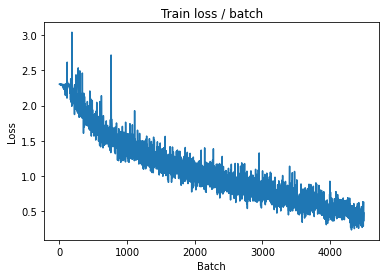


===============> Total time 6s	Avg loss 0.4343	Avg Prec@1 84.77 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.0235 (1.0235)	Prec@1  71.1 ( 71.1)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0557	Avg Prec@1 68.85 %	Avg Prec@5 96.98 %



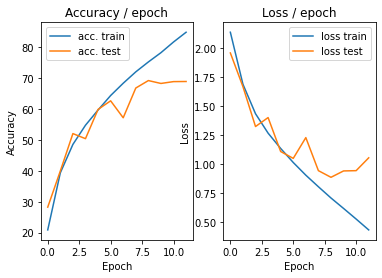

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.2592 (0.2592)	Prec@1  91.4 ( 91.4)	Prec@5 100.0 (100.0)


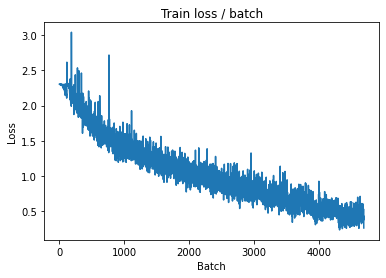

[TRAIN Batch 200/391]	Time 0.011s (0.017s)	Loss 0.3376 (0.3274)	Prec@1  87.5 ( 88.6)	Prec@5 100.0 ( 99.8)


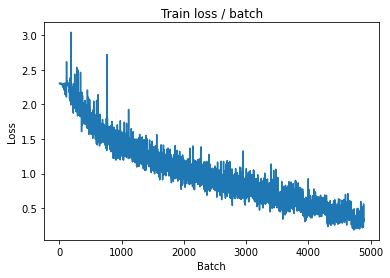


===============> Total time 6s	Avg loss 0.3394	Avg Prec@1 88.16 %	Avg Prec@5 99.79 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 1.2832 (1.2832)	Prec@1  60.9 ( 60.9)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1418	Avg Prec@1 66.91 %	Avg Prec@5 96.86 %



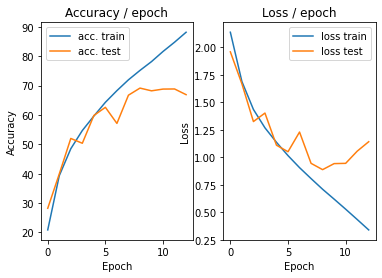

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.3735 (0.3735)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


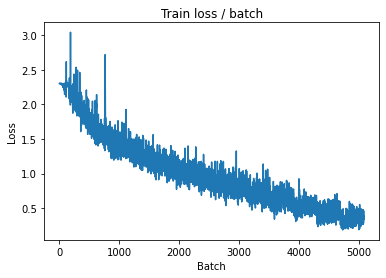

[TRAIN Batch 200/391]	Time 0.019s (0.017s)	Loss 0.1969 (0.2541)	Prec@1  89.8 ( 91.3)	Prec@5 100.0 ( 99.9)


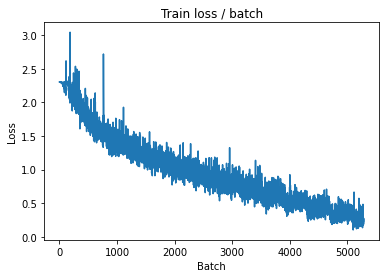


===============> Total time 6s	Avg loss 0.2691	Avg Prec@1 90.63 %	Avg Prec@5 99.89 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.0388 (1.0388)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1724	Avg Prec@1 68.89 %	Avg Prec@5 97.37 %



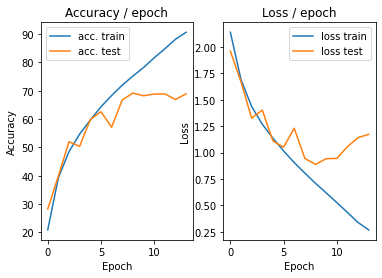

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 0.1467 (0.1467)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


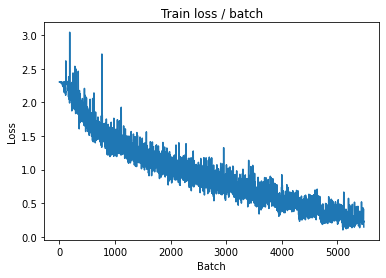

[TRAIN Batch 200/391]	Time 0.012s (0.017s)	Loss 0.2898 (0.1680)	Prec@1  87.5 ( 94.4)	Prec@5 100.0 (100.0)


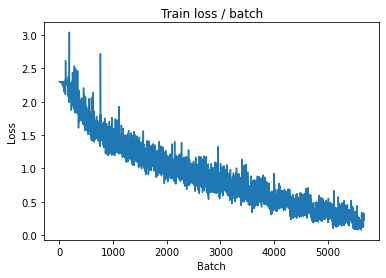


===============> Total time 6s	Avg loss 0.1952	Avg Prec@1 93.28 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.2797 (1.2797)	Prec@1  67.2 ( 67.2)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.2971	Avg Prec@1 68.02 %	Avg Prec@5 97.05 %



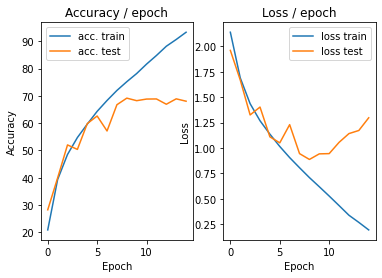

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.129s (0.129s)	Loss 0.1641 (0.1641)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


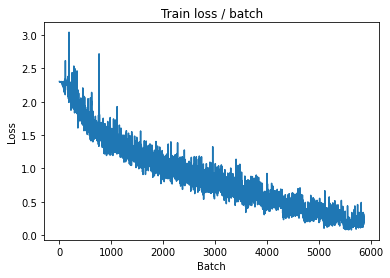

[TRAIN Batch 200/391]	Time 0.009s (0.018s)	Loss 0.1885 (0.1073)	Prec@1  95.3 ( 96.7)	Prec@5  99.2 (100.0)


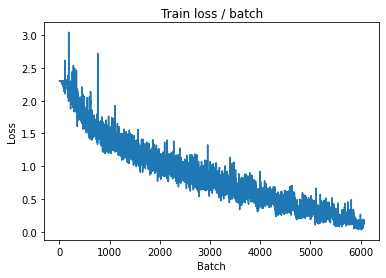


===============> Total time 6s	Avg loss 0.1425	Avg Prec@1 95.37 %	Avg Prec@5 99.97 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.1198 (1.1198)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.4093	Avg Prec@1 68.14 %	Avg Prec@5 96.71 %



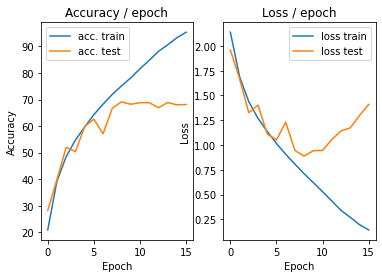

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 0.1606 (0.1606)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


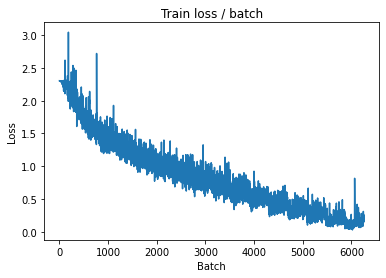

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.1142 (0.0754)	Prec@1  96.9 ( 97.8)	Prec@5 100.0 (100.0)


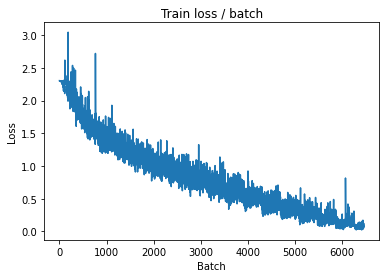


===============> Total time 6s	Avg loss 0.0960	Avg Prec@1 96.89 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.2970 (1.2970)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.5857	Avg Prec@1 68.28 %	Avg Prec@5 96.54 %



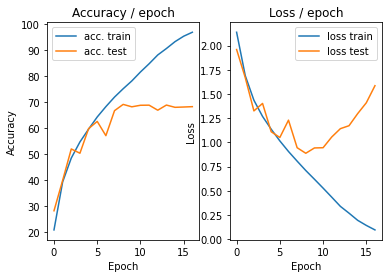

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 0.1673 (0.1673)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


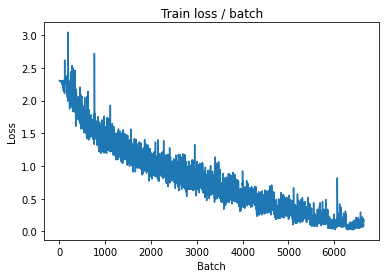

[TRAIN Batch 200/391]	Time 0.006s (0.017s)	Loss 0.0449 (0.0596)	Prec@1  98.4 ( 98.3)	Prec@5 100.0 (100.0)


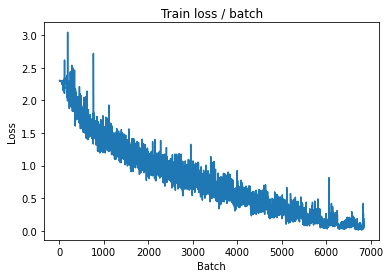


===============> Total time 6s	Avg loss 0.0737	Avg Prec@1 97.73 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.2554 (1.2554)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.4951	Avg Prec@1 70.83 %	Avg Prec@5 97.06 %



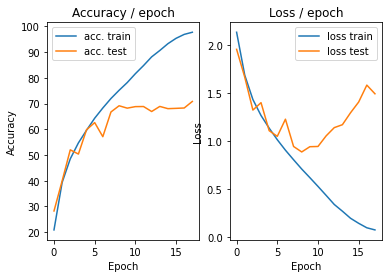

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.0405 (0.0405)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


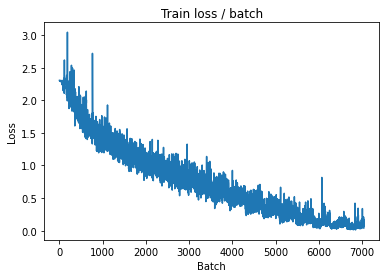

[TRAIN Batch 200/391]	Time 0.019s (0.017s)	Loss 0.0602 (0.0379)	Prec@1  96.9 ( 98.9)	Prec@5 100.0 (100.0)


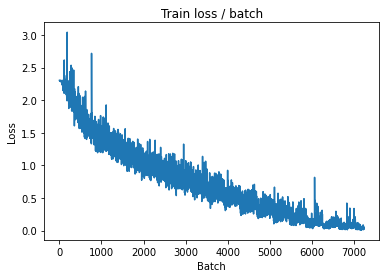


===============> Total time 6s	Avg loss 0.0664	Avg Prec@1 98.01 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.115s (0.115s)	Loss 1.3152 (1.3152)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.5010	Avg Prec@1 70.65 %	Avg Prec@5 97.24 %



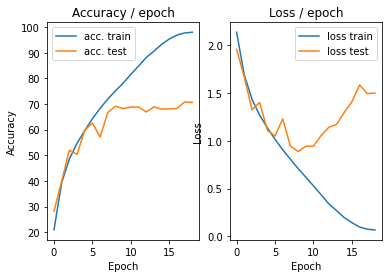

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.138s (0.138s)	Loss 0.0287 (0.0287)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


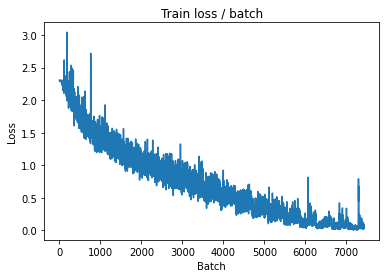

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0259 (0.0233)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


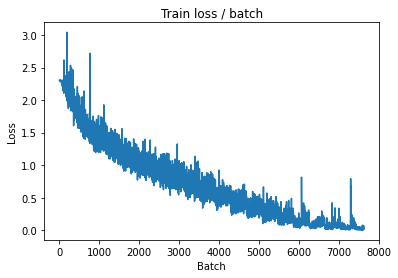


===============> Total time 6s	Avg loss 0.1317	Avg Prec@1 96.72 %	Avg Prec@5 99.67 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.1534 (1.1534)	Prec@1  68.0 ( 68.0)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.2917	Avg Prec@1 69.20 %	Avg Prec@5 96.88 %



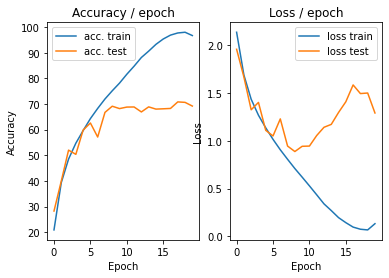

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 0.1078 (0.1078)	Prec@1  96.1 ( 96.1)	Prec@5 100.0 (100.0)


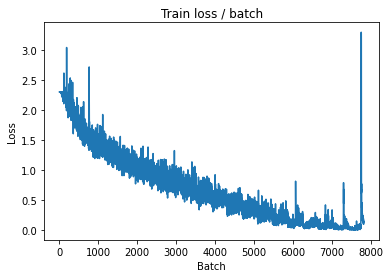

[TRAIN Batch 200/391]	Time 0.023s (0.017s)	Loss 0.0520 (0.0602)	Prec@1  97.7 ( 98.3)	Prec@5 100.0 (100.0)


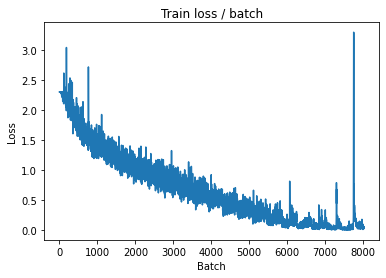


===============> Total time 6s	Avg loss 0.0541	Avg Prec@1 98.38 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.4692 (1.4692)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.7498	Avg Prec@1 69.58 %	Avg Prec@5 96.91 %



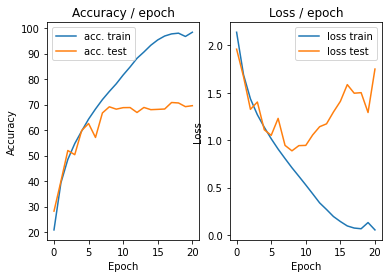

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0255 (0.0255)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


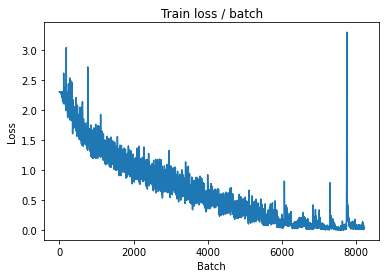

[TRAIN Batch 200/391]	Time 0.021s (0.017s)	Loss 0.0227 (0.0212)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


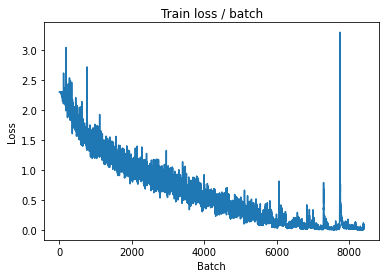


===============> Total time 6s	Avg loss 0.0283	Avg Prec@1 99.24 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.5521 (1.5521)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.8042	Avg Prec@1 70.52 %	Avg Prec@5 97.20 %



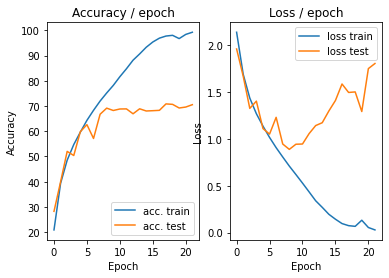

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.0138 (0.0138)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


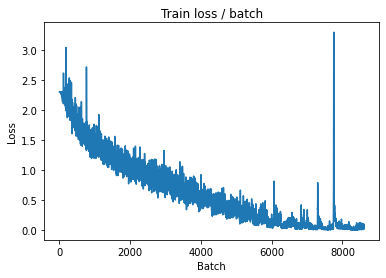

[TRAIN Batch 200/391]	Time 0.009s (0.017s)	Loss 0.0117 (0.0157)	Prec@1  99.2 ( 99.6)	Prec@5 100.0 (100.0)


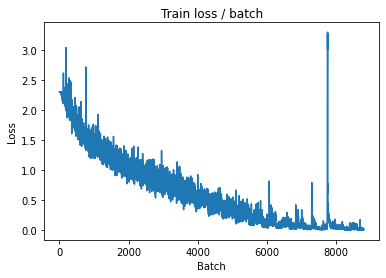


===============> Total time 6s	Avg loss 0.0136	Avg Prec@1 99.68 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.3387 (1.3387)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.8484	Avg Prec@1 71.37 %	Avg Prec@5 97.32 %



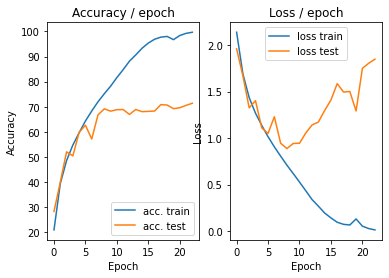

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.121s (0.121s)	Loss 0.0029 (0.0029)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


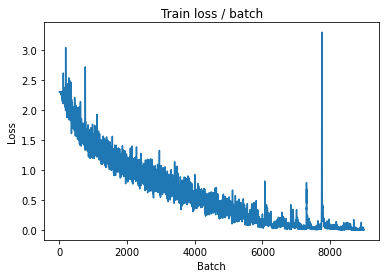

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0036 (0.0076)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


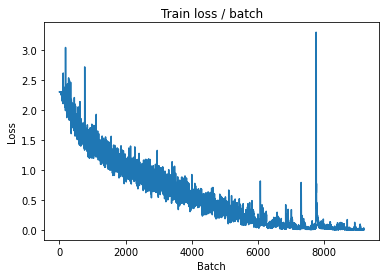


===============> Total time 6s	Avg loss 0.0055	Avg Prec@1 99.91 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.4825 (1.4825)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)

===============> Total time 1s	Avg loss 1.8901	Avg Prec@1 72.07 %	Avg Prec@5 97.56 %



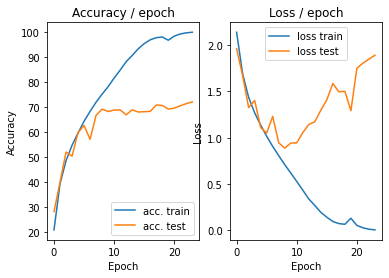

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0020 (0.0020)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


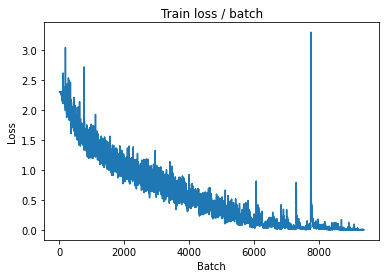

[TRAIN Batch 200/391]	Time 0.010s (0.017s)	Loss 0.0014 (0.0013)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


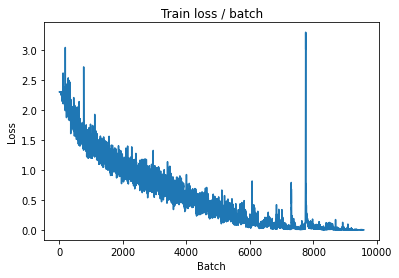


===============> Total time 6s	Avg loss 0.0012	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.5029 (1.5029)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.9643	Avg Prec@1 72.41 %	Avg Prec@5 97.51 %



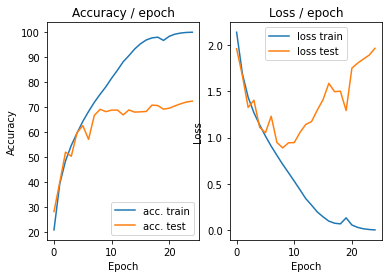

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0008 (0.0008)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


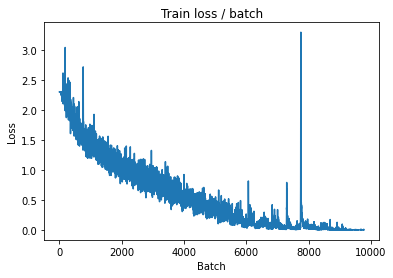

[TRAIN Batch 200/391]	Time 0.024s (0.018s)	Loss 0.0006 (0.0007)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


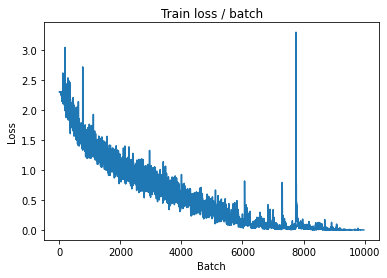


===============> Total time 6s	Avg loss 0.0007	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.5541 (1.5541)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.0161	Avg Prec@1 72.52 %	Avg Prec@5 97.59 %



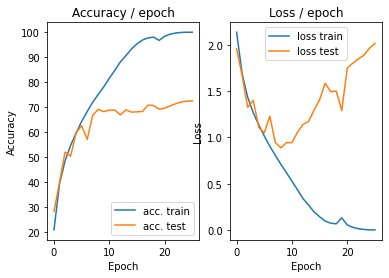

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


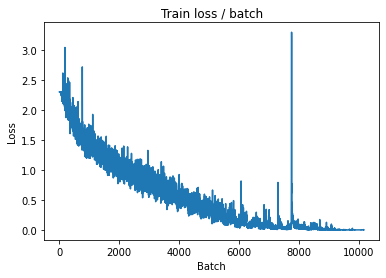

[TRAIN Batch 200/391]	Time 0.020s (0.017s)	Loss 0.0005 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


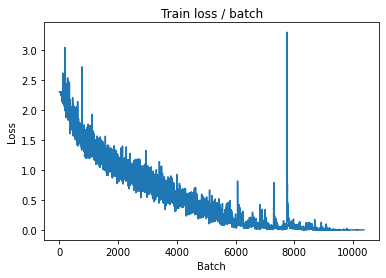


===============> Total time 6s	Avg loss 0.0004	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.5954 (1.5954)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.0624	Avg Prec@1 72.69 %	Avg Prec@5 97.58 %



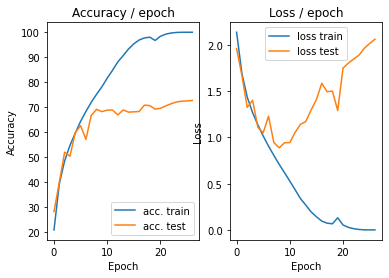

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


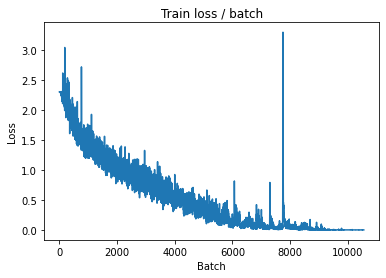

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0002 (0.0004)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


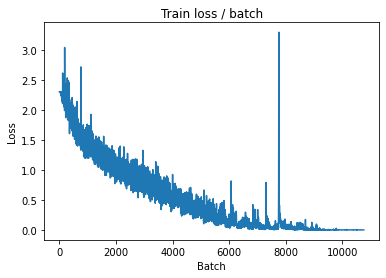


===============> Total time 6s	Avg loss 0.0003	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.6212 (1.6212)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.0957	Avg Prec@1 72.53 %	Avg Prec@5 97.59 %



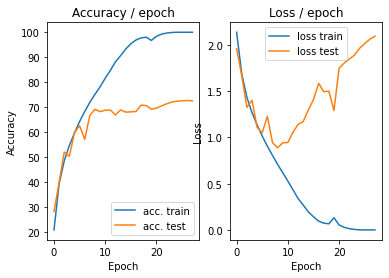

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


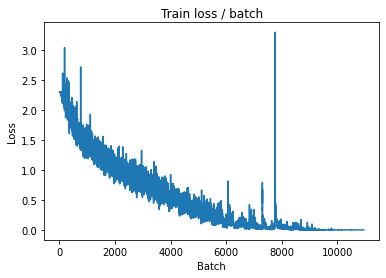

[TRAIN Batch 200/391]	Time 0.016s (0.017s)	Loss 0.0002 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


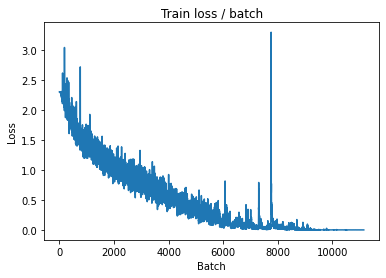


===============> Total time 6s	Avg loss 0.0003	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.6420 (1.6420)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.1231	Avg Prec@1 72.54 %	Avg Prec@5 97.60 %



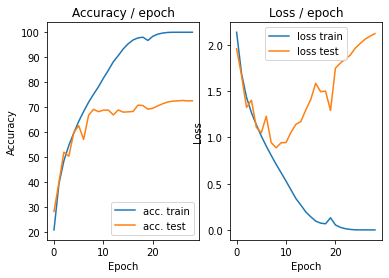

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.124s (0.124s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


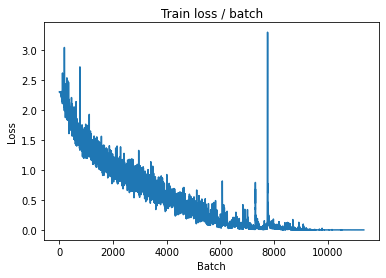

[TRAIN Batch 200/391]	Time 0.009s (0.017s)	Loss 0.0004 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


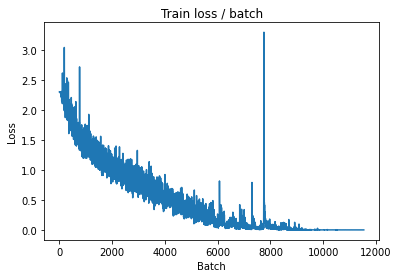


===============> Total time 6s	Avg loss 0.0003	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.6693 (1.6693)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.1479	Avg Prec@1 72.68 %	Avg Prec@5 97.61 %



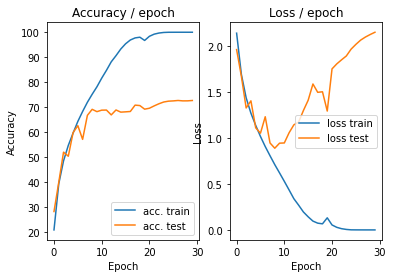

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


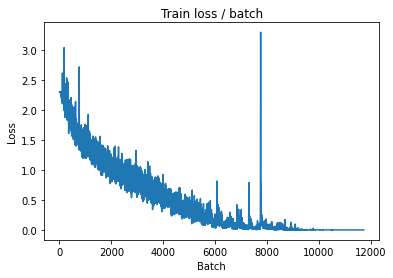

[TRAIN Batch 200/391]	Time 0.019s (0.019s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


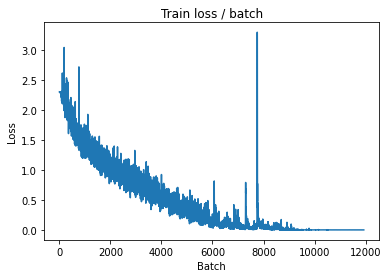


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.6883 (1.6883)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.1685	Avg Prec@1 72.73 %	Avg Prec@5 97.61 %



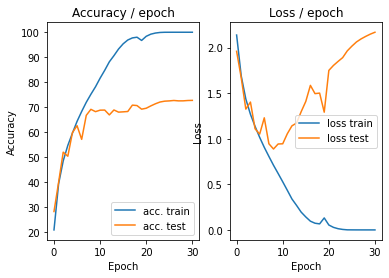

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.147s (0.147s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


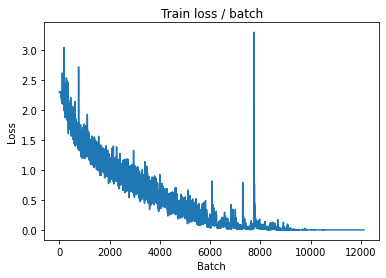

[TRAIN Batch 200/391]	Time 0.020s (0.017s)	Loss 0.0001 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


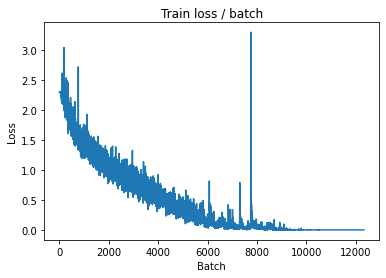


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.7006 (1.7006)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.1910	Avg Prec@1 72.60 %	Avg Prec@5 97.61 %



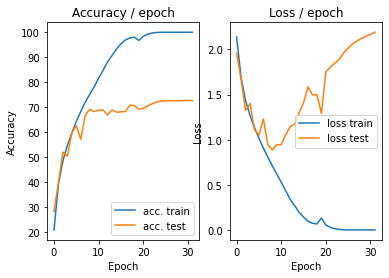

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.155s (0.155s)	Loss 0.0003 (0.0003)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


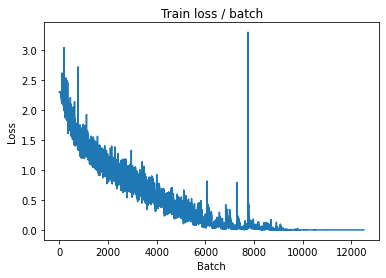

[TRAIN Batch 200/391]	Time 0.021s (0.017s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


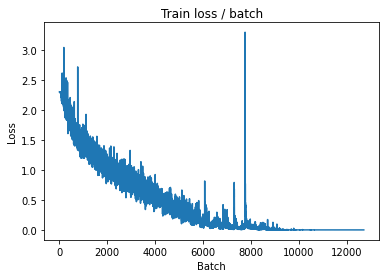


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.7254 (1.7254)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2064	Avg Prec@1 72.77 %	Avg Prec@5 97.58 %



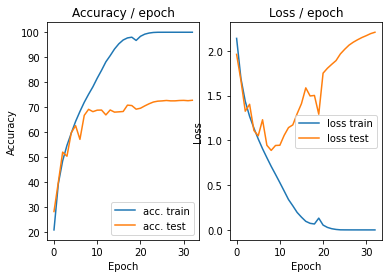

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


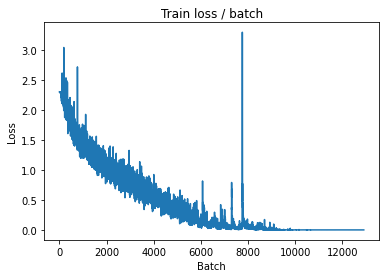

[TRAIN Batch 200/391]	Time 0.023s (0.017s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


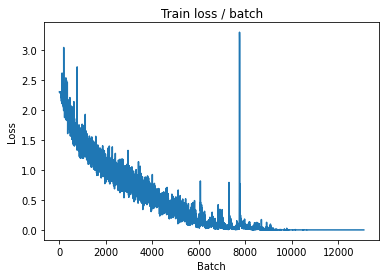


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.7375 (1.7375)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2219	Avg Prec@1 72.77 %	Avg Prec@5 97.58 %



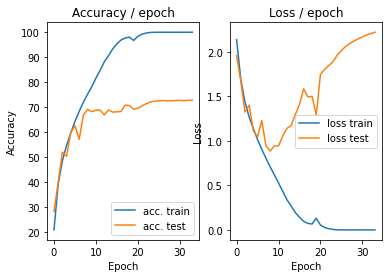

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.123s (0.123s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


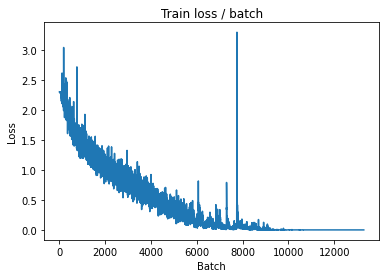

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


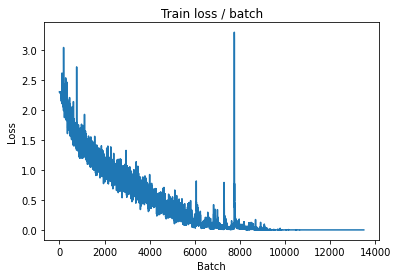


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.7446 (1.7446)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2383	Avg Prec@1 72.69 %	Avg Prec@5 97.57 %



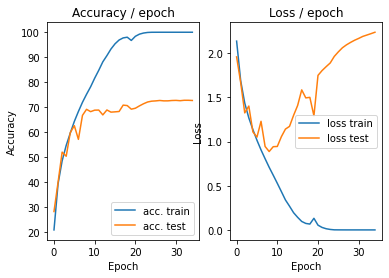

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


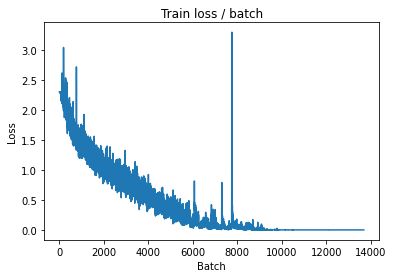

[TRAIN Batch 200/391]	Time 0.012s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


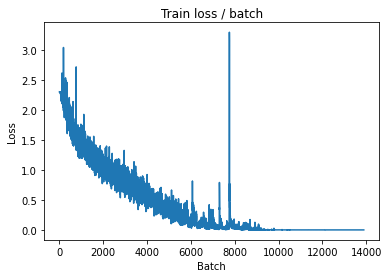


===============> Total time 6s	Avg loss 0.0002	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.7625 (1.7625)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2511	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



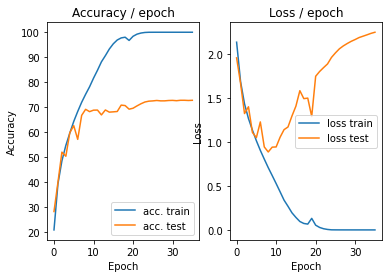

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


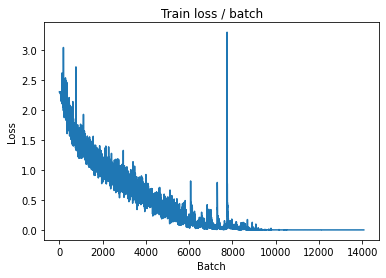

[TRAIN Batch 200/391]	Time 0.009s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


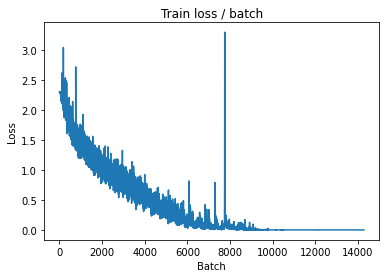


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.7698 (1.7698)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2652	Avg Prec@1 72.65 %	Avg Prec@5 97.57 %



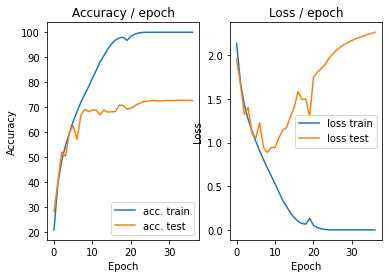

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


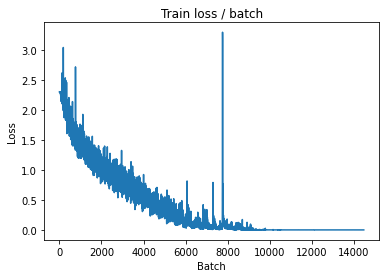

[TRAIN Batch 200/391]	Time 0.013s (0.017s)	Loss 0.0002 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


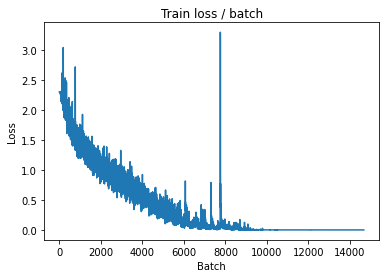


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 1.7823 (1.7823)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2779	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



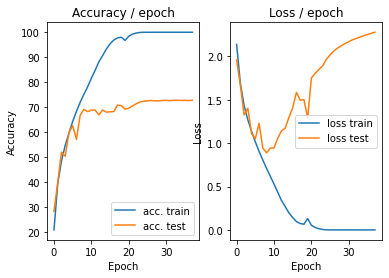

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


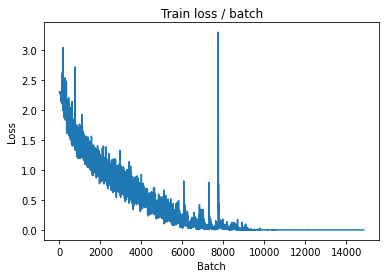

[TRAIN Batch 200/391]	Time 0.018s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


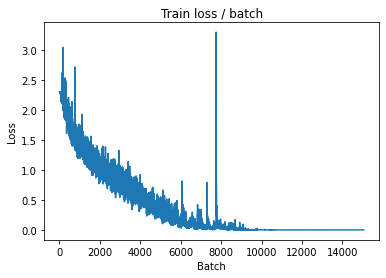


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.7929 (1.7929)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.2899	Avg Prec@1 72.74 %	Avg Prec@5 97.57 %



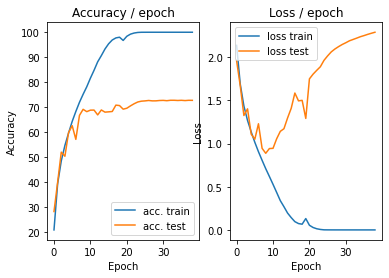

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


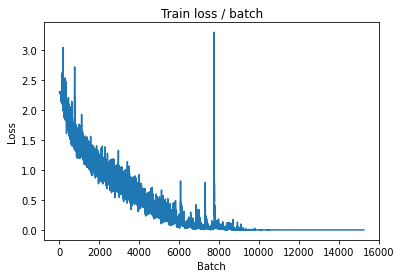

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


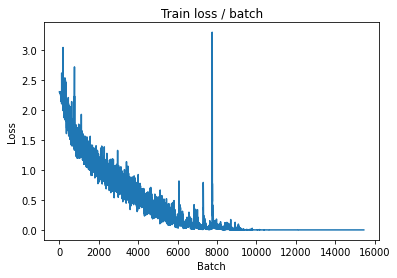


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 1.8061 (1.8061)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3004	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



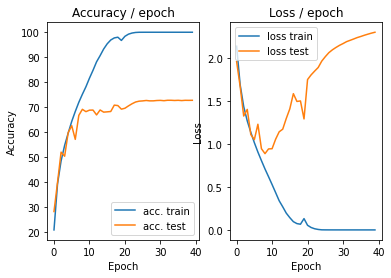

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.138s (0.138s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


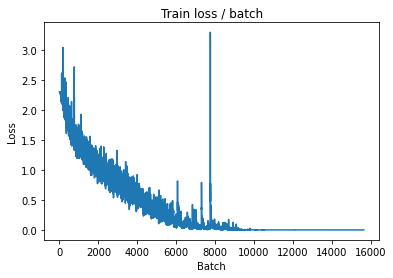

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


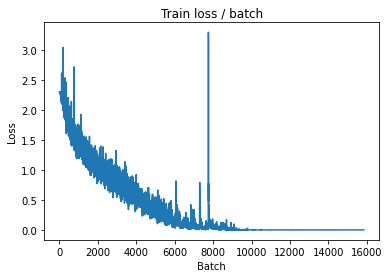


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.8164 (1.8164)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3119	Avg Prec@1 72.78 %	Avg Prec@5 97.57 %



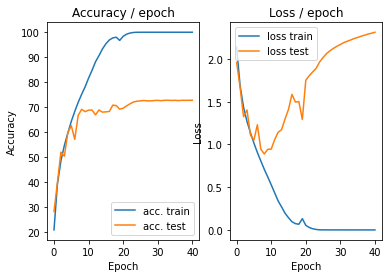

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.135s (0.135s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


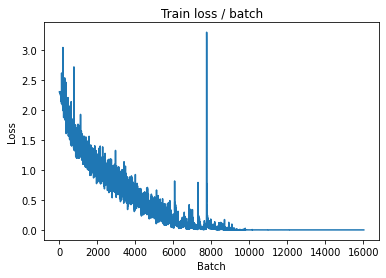

[TRAIN Batch 200/391]	Time 0.027s (0.019s)	Loss 0.0003 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


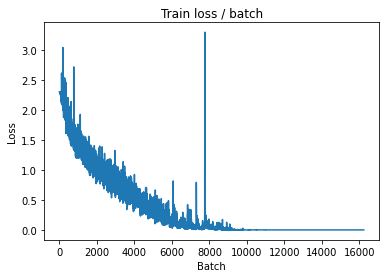


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.133s (0.133s)	Loss 1.8213 (1.8213)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3195	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



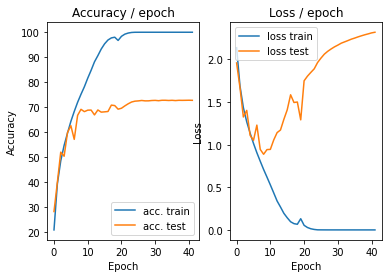

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.124s (0.124s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


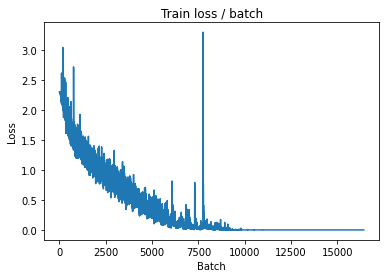

[TRAIN Batch 200/391]	Time 0.022s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


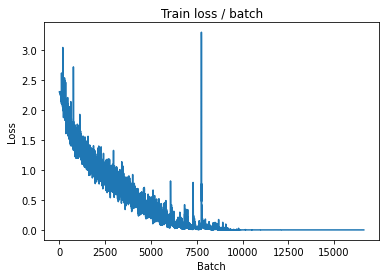


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.8333 (1.8333)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3296	Avg Prec@1 72.73 %	Avg Prec@5 97.58 %



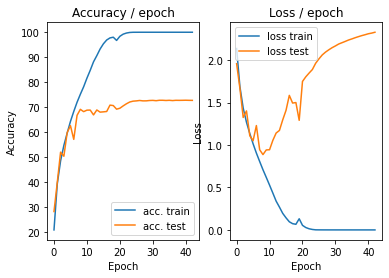

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


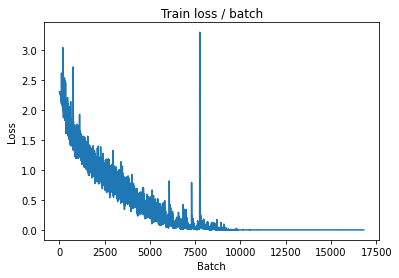

[TRAIN Batch 200/391]	Time 0.014s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


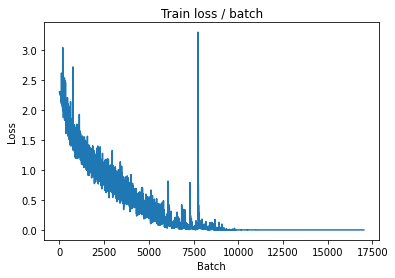


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.8409 (1.8409)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3380	Avg Prec@1 72.73 %	Avg Prec@5 97.60 %



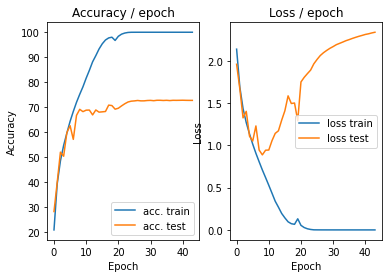

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.144s (0.144s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


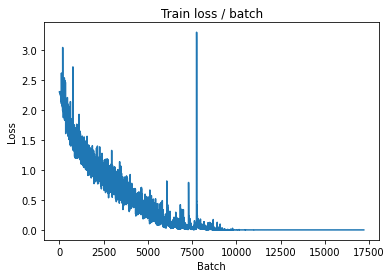

[TRAIN Batch 200/391]	Time 0.017s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


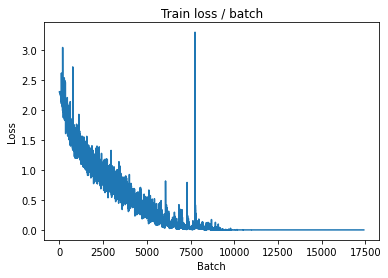


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 1.8485 (1.8485)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3480	Avg Prec@1 72.72 %	Avg Prec@5 97.61 %



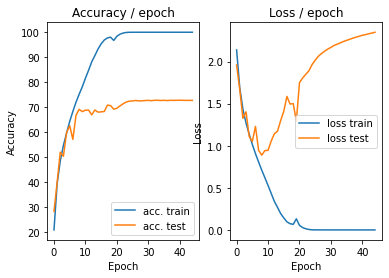

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.129s (0.129s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


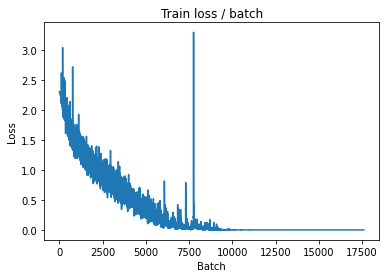

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


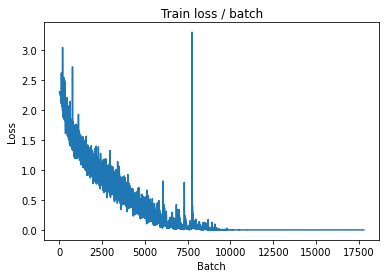


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 1.8558 (1.8558)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3565	Avg Prec@1 72.76 %	Avg Prec@5 97.61 %



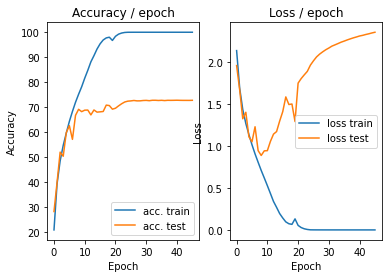

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


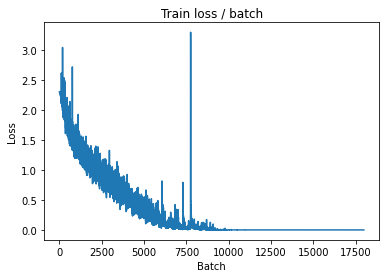

[TRAIN Batch 200/391]	Time 0.027s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


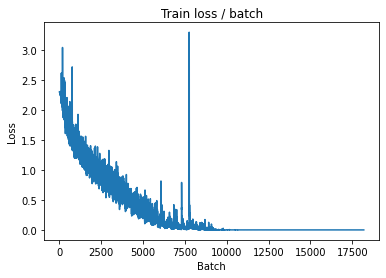


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.8631 (1.8631)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3654	Avg Prec@1 72.73 %	Avg Prec@5 97.62 %



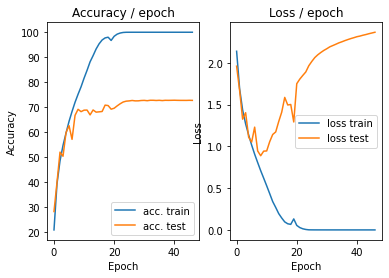

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.127s (0.127s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


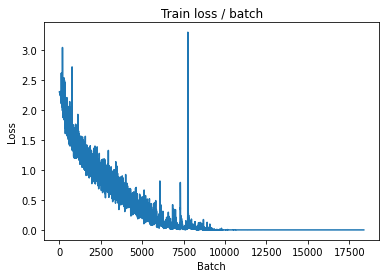

[TRAIN Batch 200/391]	Time 0.017s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


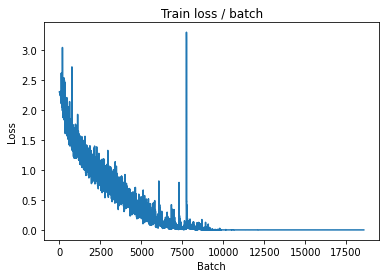


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.8754 (1.8754)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3726	Avg Prec@1 72.77 %	Avg Prec@5 97.61 %



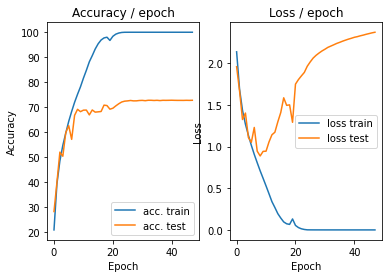

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0002 (0.0002)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


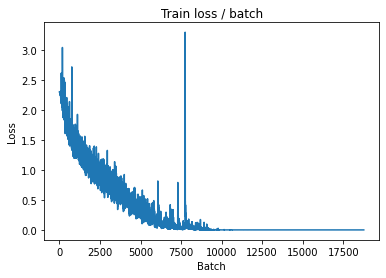

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


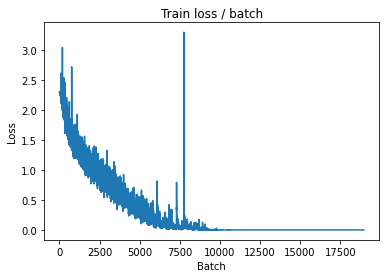


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.8800 (1.8800)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3804	Avg Prec@1 72.76 %	Avg Prec@5 97.61 %



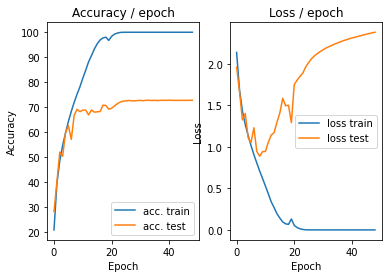

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


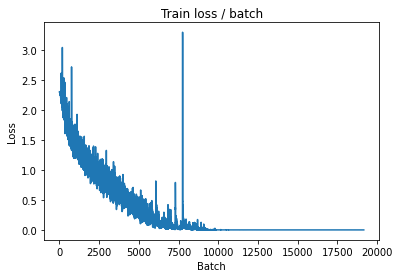

[TRAIN Batch 200/391]	Time 0.009s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


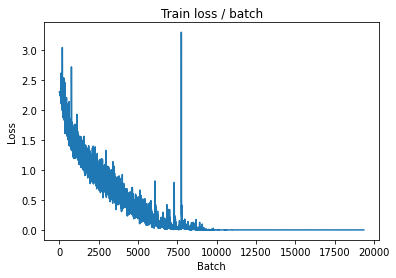


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.8851 (1.8851)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3871	Avg Prec@1 72.73 %	Avg Prec@5 97.61 %



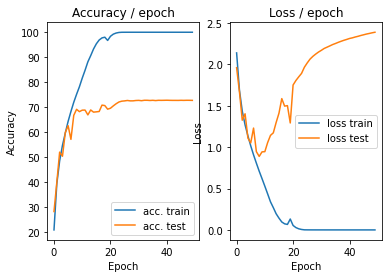

=== EPOCH 51 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


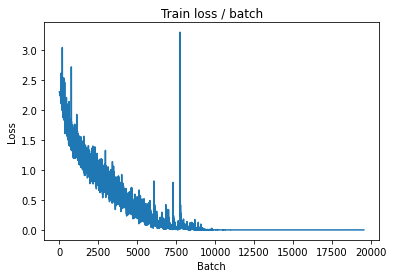

[TRAIN Batch 200/391]	Time 0.022s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


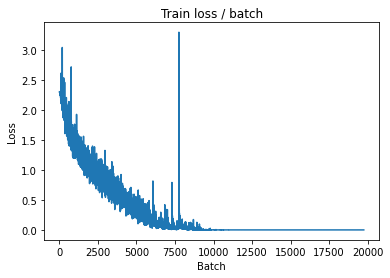


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.8962 (1.8962)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.3942	Avg Prec@1 72.74 %	Avg Prec@5 97.61 %



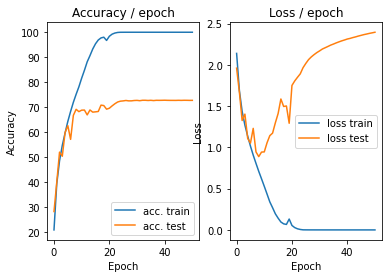

=== EPOCH 52 =====

[TRAIN Batch 000/391]	Time 0.129s (0.129s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


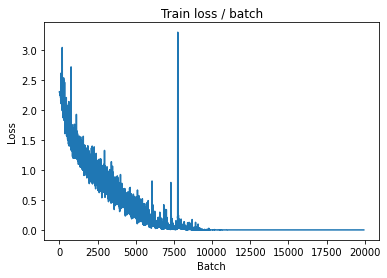

[TRAIN Batch 200/391]	Time 0.013s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


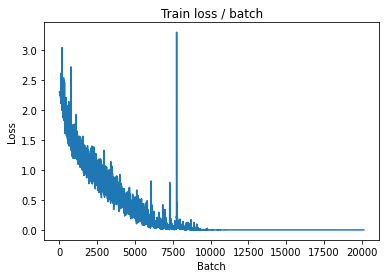


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 1.8983 (1.8983)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4023	Avg Prec@1 72.71 %	Avg Prec@5 97.61 %



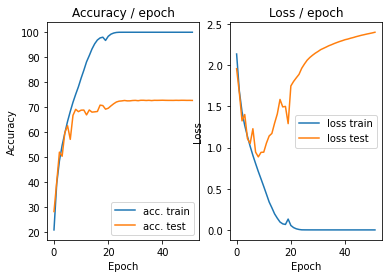

=== EPOCH 53 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


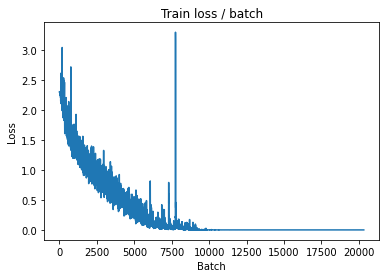

[TRAIN Batch 200/391]	Time 0.008s (0.019s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


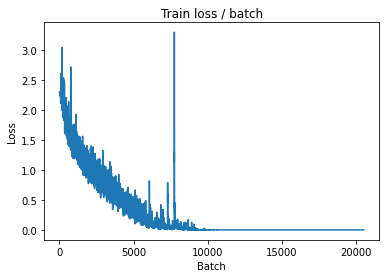


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.9030 (1.9030)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4093	Avg Prec@1 72.76 %	Avg Prec@5 97.61 %



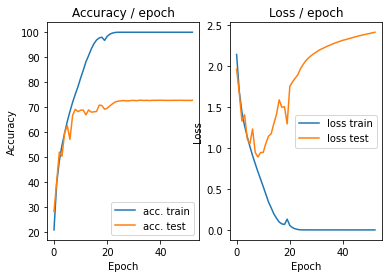

=== EPOCH 54 =====

[TRAIN Batch 000/391]	Time 0.129s (0.129s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


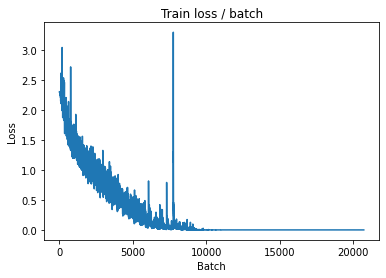

[TRAIN Batch 200/391]	Time 0.024s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


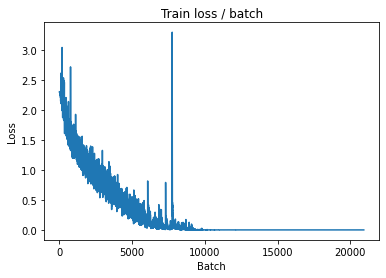


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.9103 (1.9103)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4151	Avg Prec@1 72.77 %	Avg Prec@5 97.60 %



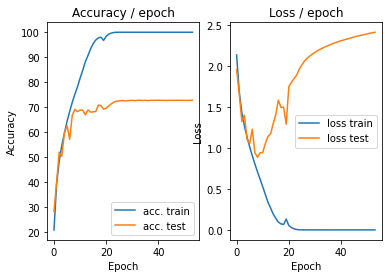

=== EPOCH 55 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


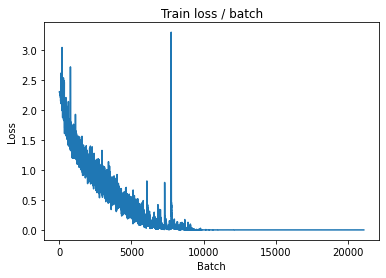

[TRAIN Batch 200/391]	Time 0.029s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


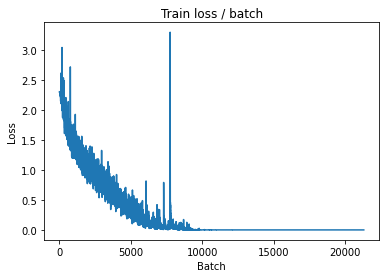


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.9160 (1.9160)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4214	Avg Prec@1 72.76 %	Avg Prec@5 97.60 %



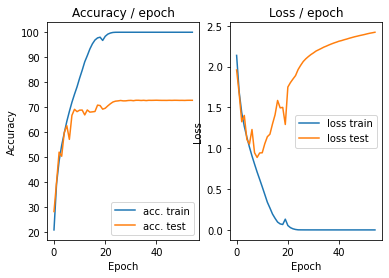

=== EPOCH 56 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


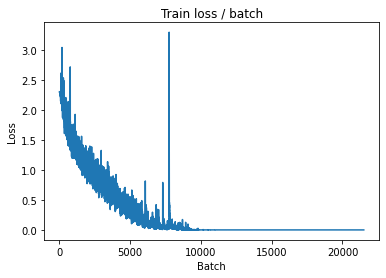

[TRAIN Batch 200/391]	Time 0.013s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


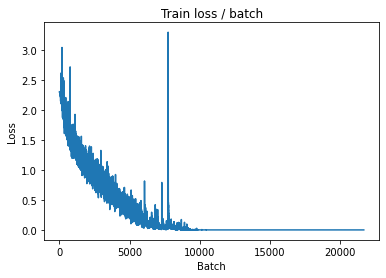


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 1.9225 (1.9225)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4283	Avg Prec@1 72.75 %	Avg Prec@5 97.60 %



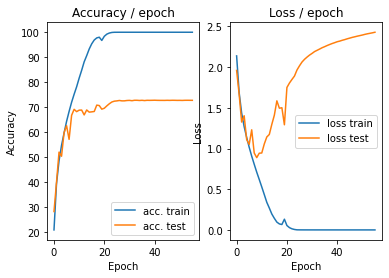

=== EPOCH 57 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


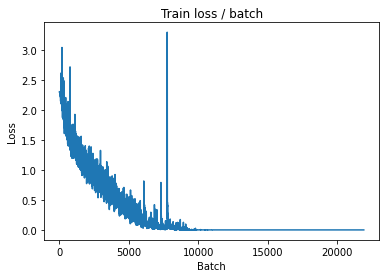

[TRAIN Batch 200/391]	Time 0.012s (0.017s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


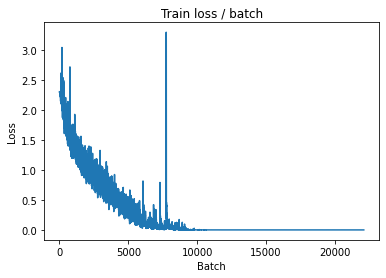


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 1.9283 (1.9283)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4350	Avg Prec@1 72.74 %	Avg Prec@5 97.60 %



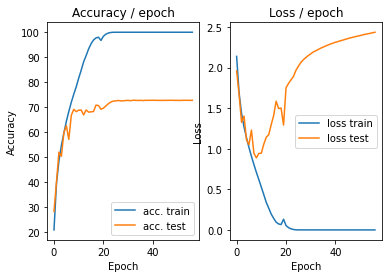

=== EPOCH 58 =====

[TRAIN Batch 000/391]	Time 0.142s (0.142s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


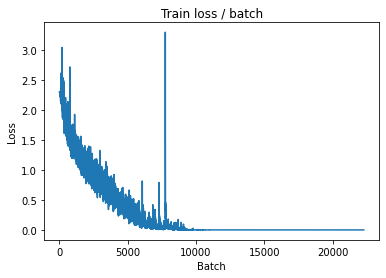

[TRAIN Batch 200/391]	Time 0.013s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


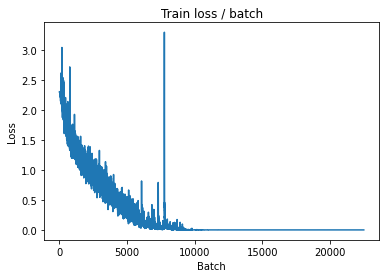


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.9322 (1.9322)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4402	Avg Prec@1 72.75 %	Avg Prec@5 97.61 %



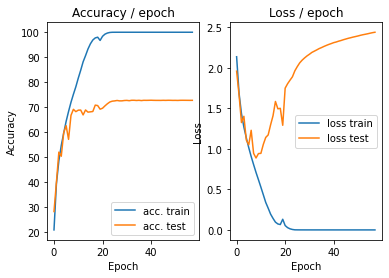

=== EPOCH 59 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


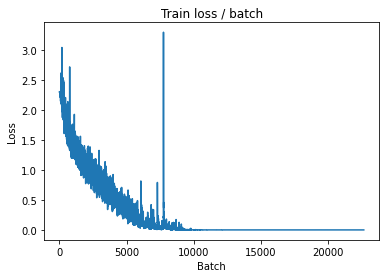

[TRAIN Batch 200/391]	Time 0.016s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


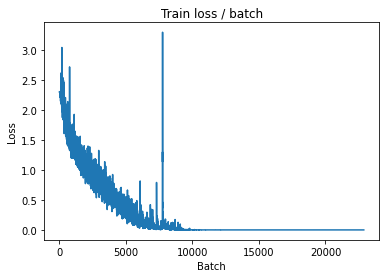


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.9399 (1.9399)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4461	Avg Prec@1 72.77 %	Avg Prec@5 97.61 %



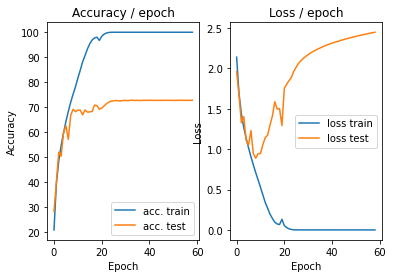

=== EPOCH 60 =====

[TRAIN Batch 000/391]	Time 0.127s (0.127s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


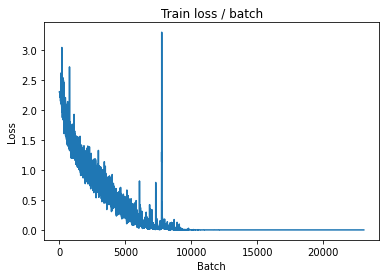

[TRAIN Batch 200/391]	Time 0.022s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


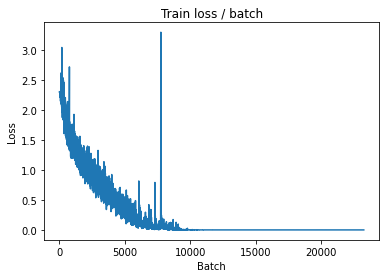


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 1.9434 (1.9434)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4521	Avg Prec@1 72.72 %	Avg Prec@5 97.61 %



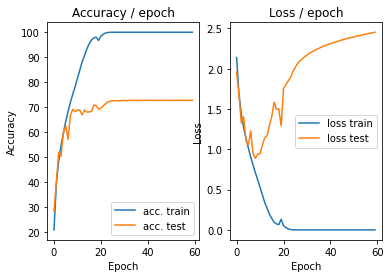

=== EPOCH 61 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


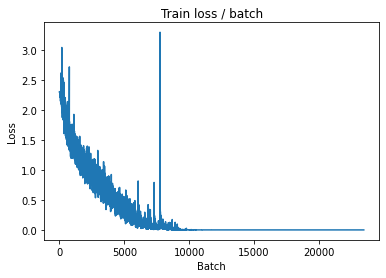

[TRAIN Batch 200/391]	Time 0.024s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


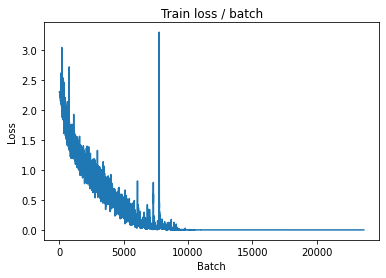


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.9465 (1.9465)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4575	Avg Prec@1 72.76 %	Avg Prec@5 97.61 %



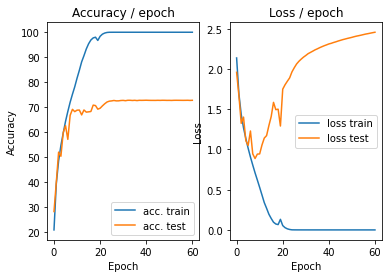

=== EPOCH 62 =====

[TRAIN Batch 000/391]	Time 0.130s (0.130s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


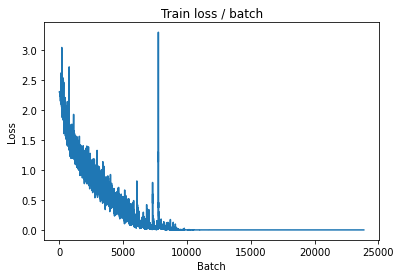

[TRAIN Batch 200/391]	Time 0.014s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


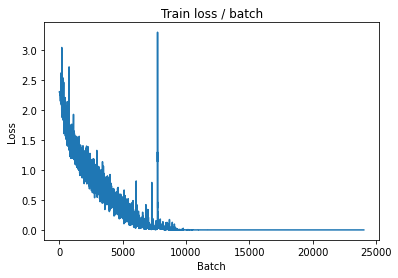


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.9529 (1.9529)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4617	Avg Prec@1 72.75 %	Avg Prec@5 97.61 %



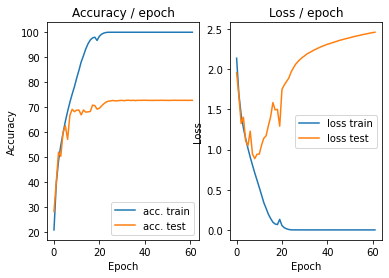

=== EPOCH 63 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


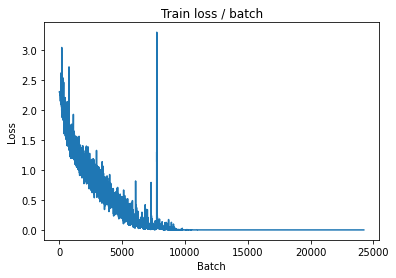

[TRAIN Batch 200/391]	Time 0.028s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


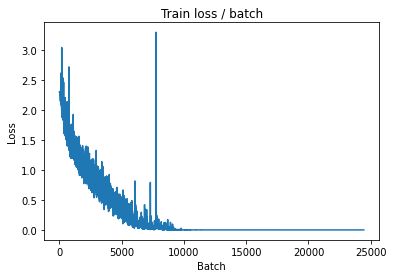


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.9580 (1.9580)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4670	Avg Prec@1 72.75 %	Avg Prec@5 97.61 %



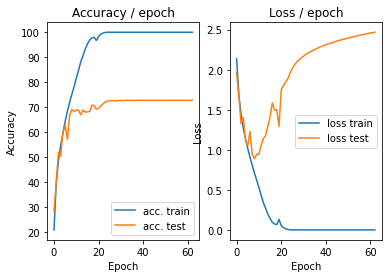

=== EPOCH 64 =====

[TRAIN Batch 000/391]	Time 0.145s (0.145s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


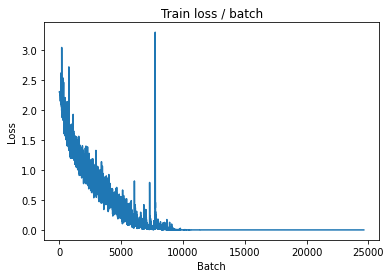

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


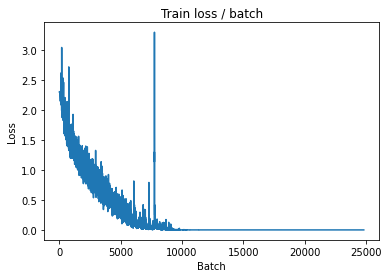


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.9627 (1.9627)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4716	Avg Prec@1 72.74 %	Avg Prec@5 97.61 %



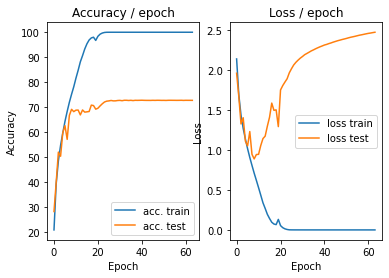

=== EPOCH 65 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


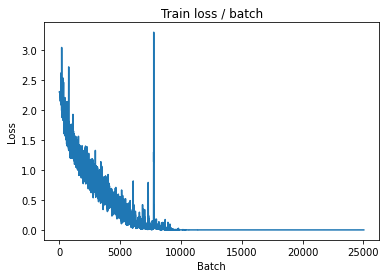

[TRAIN Batch 200/391]	Time 0.015s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


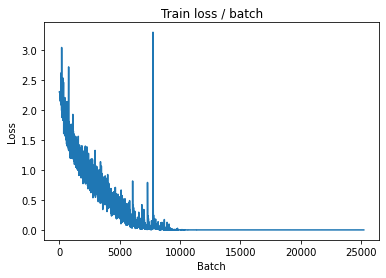


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.9678 (1.9678)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4766	Avg Prec@1 72.75 %	Avg Prec@5 97.61 %



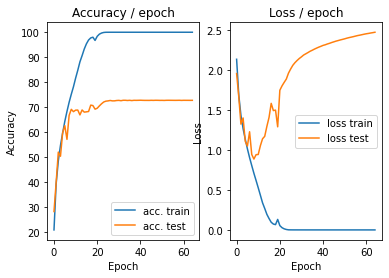

=== EPOCH 66 =====

[TRAIN Batch 000/391]	Time 0.127s (0.127s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


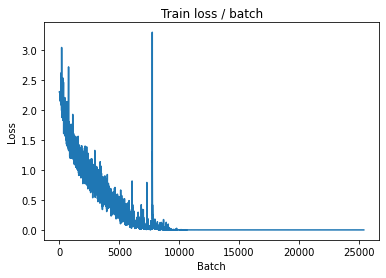

[TRAIN Batch 200/391]	Time 0.024s (0.018s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


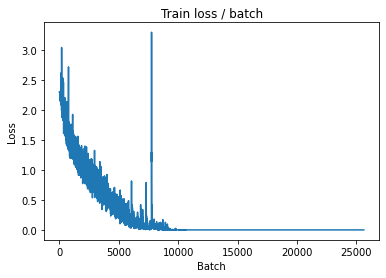


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.9716 (1.9716)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4823	Avg Prec@1 72.74 %	Avg Prec@5 97.61 %



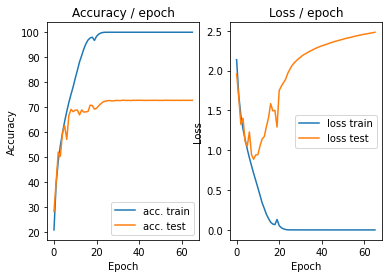

=== EPOCH 67 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


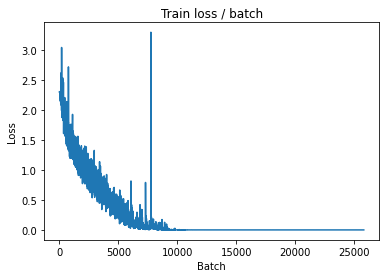

[TRAIN Batch 200/391]	Time 0.011s (0.017s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


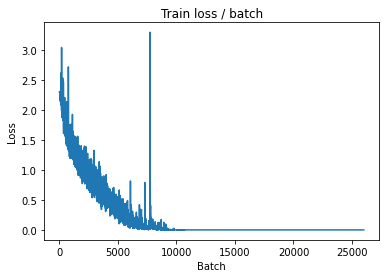


===============> Total time 6s	Avg loss 0.0001	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.9750 (1.9750)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4868	Avg Prec@1 72.74 %	Avg Prec@5 97.61 %



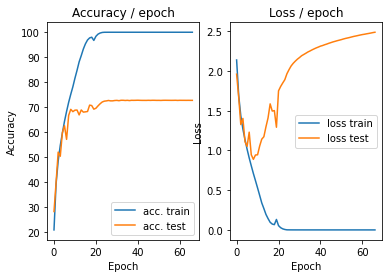

=== EPOCH 68 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


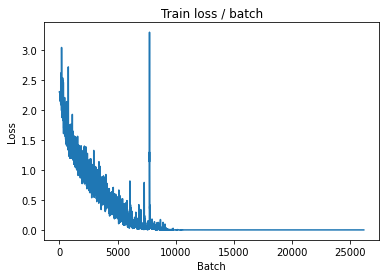

[TRAIN Batch 200/391]	Time 0.014s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


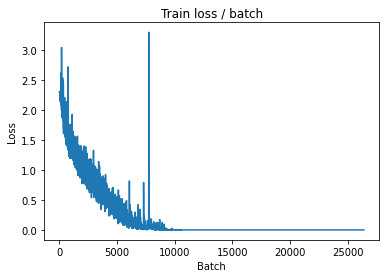


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.9819 (1.9819)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4912	Avg Prec@1 72.76 %	Avg Prec@5 97.61 %



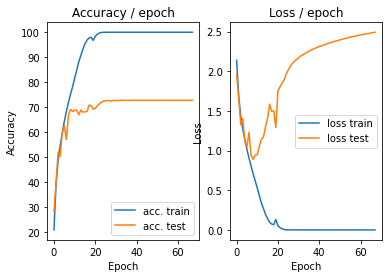

=== EPOCH 69 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


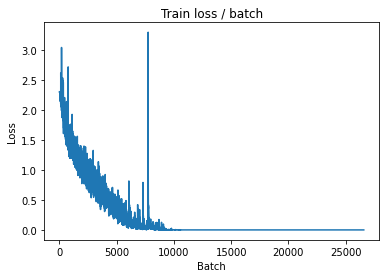

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0000 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


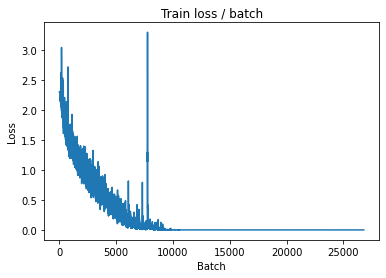


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.9871 (1.9871)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.4961	Avg Prec@1 72.77 %	Avg Prec@5 97.60 %



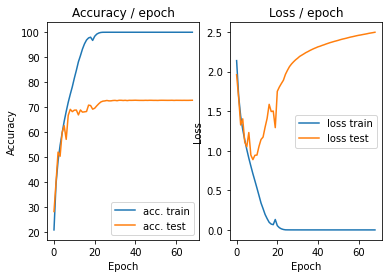

=== EPOCH 70 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


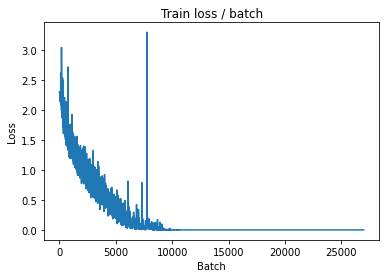

[TRAIN Batch 200/391]	Time 0.009s (0.018s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


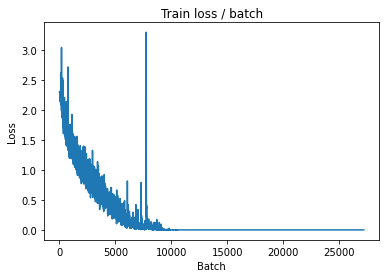


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.9880 (1.9880)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5003	Avg Prec@1 72.79 %	Avg Prec@5 97.60 %



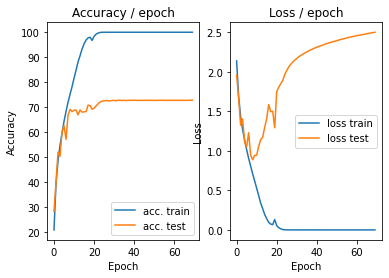

=== EPOCH 71 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


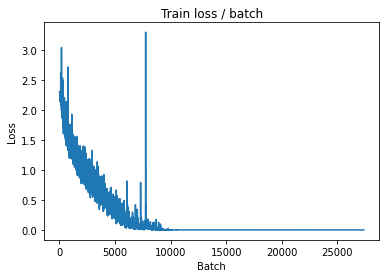

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


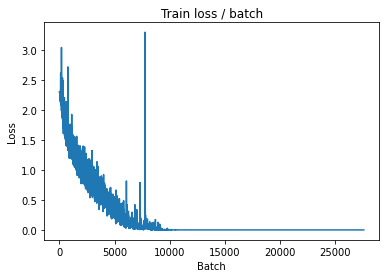


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 1.9935 (1.9935)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5048	Avg Prec@1 72.82 %	Avg Prec@5 97.60 %



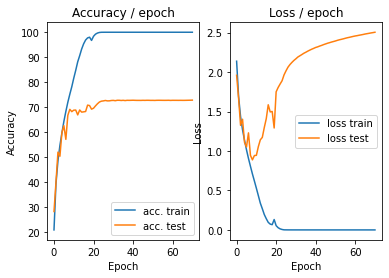

=== EPOCH 72 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


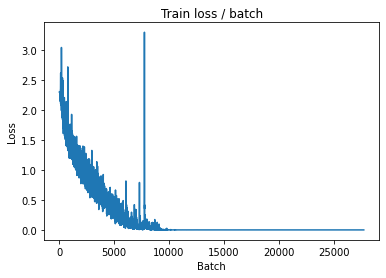

[TRAIN Batch 200/391]	Time 0.027s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


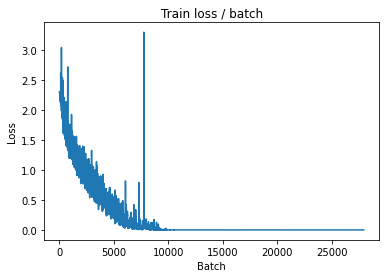


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.9973 (1.9973)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5095	Avg Prec@1 72.78 %	Avg Prec@5 97.60 %



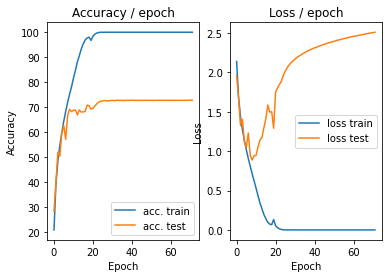

=== EPOCH 73 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


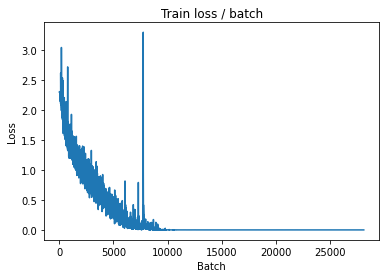

[TRAIN Batch 200/391]	Time 0.009s (0.018s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


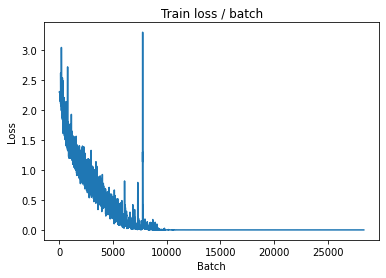


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 2.0002 (2.0002)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5136	Avg Prec@1 72.77 %	Avg Prec@5 97.60 %



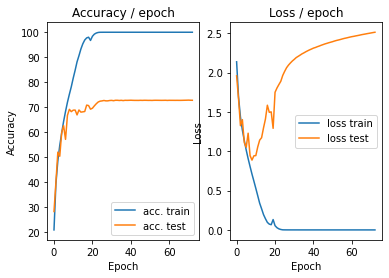

=== EPOCH 74 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


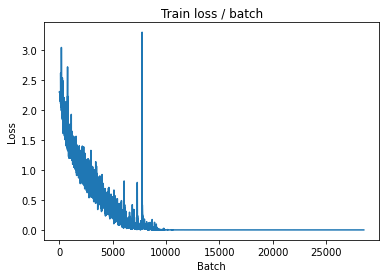

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


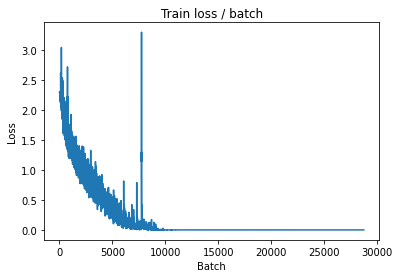


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.138s (0.138s)	Loss 2.0075 (2.0075)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5169	Avg Prec@1 72.77 %	Avg Prec@5 97.60 %



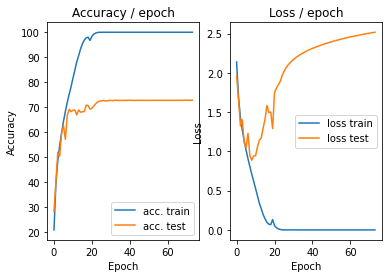

=== EPOCH 75 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


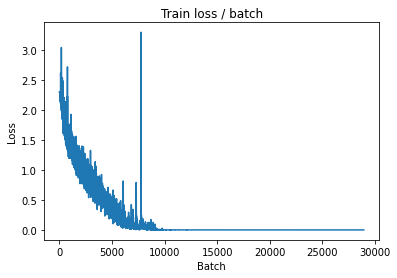

[TRAIN Batch 200/391]	Time 0.026s (0.019s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


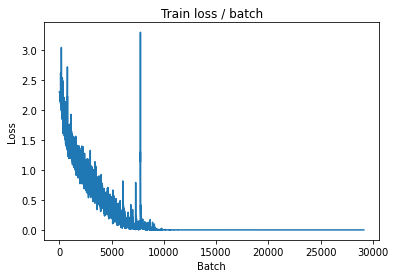


===============> Total time 7s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 2.0110 (2.0110)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5212	Avg Prec@1 72.81 %	Avg Prec@5 97.59 %



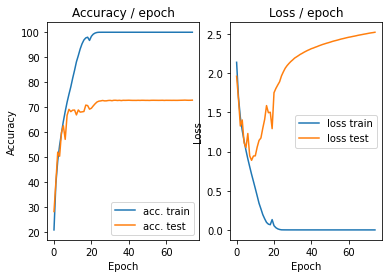

=== EPOCH 76 =====

[TRAIN Batch 000/391]	Time 0.130s (0.130s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


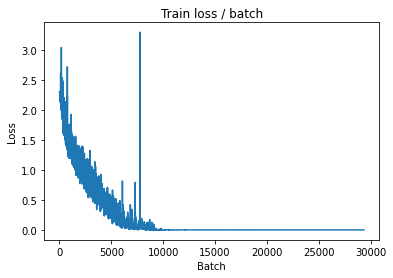

[TRAIN Batch 200/391]	Time 0.016s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


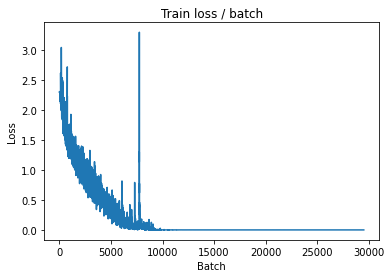


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 2.0126 (2.0126)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5259	Avg Prec@1 72.76 %	Avg Prec@5 97.59 %



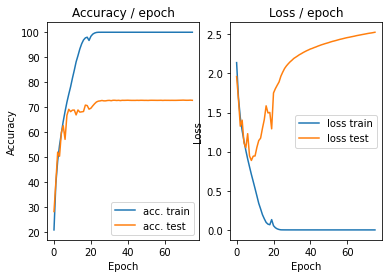

=== EPOCH 77 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


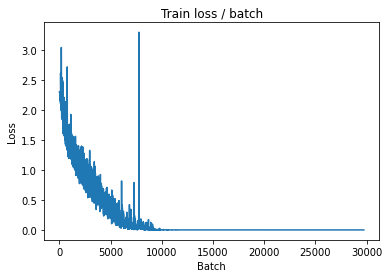

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


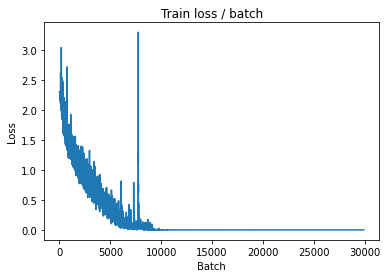


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 2.0163 (2.0163)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5302	Avg Prec@1 72.76 %	Avg Prec@5 97.58 %



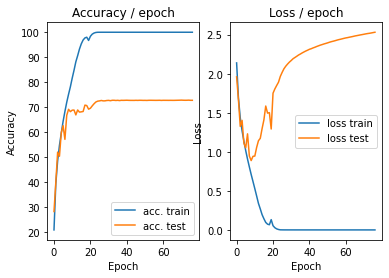

=== EPOCH 78 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


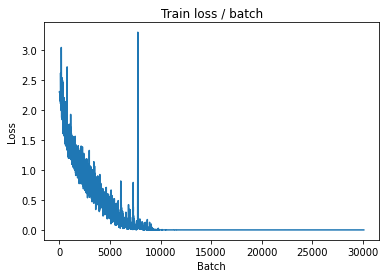

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


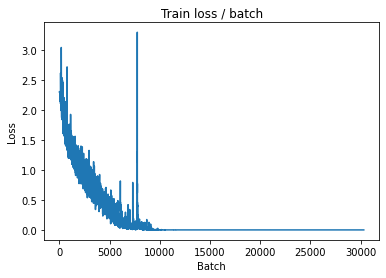


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.120s (0.120s)	Loss 2.0209 (2.0209)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5340	Avg Prec@1 72.77 %	Avg Prec@5 97.59 %



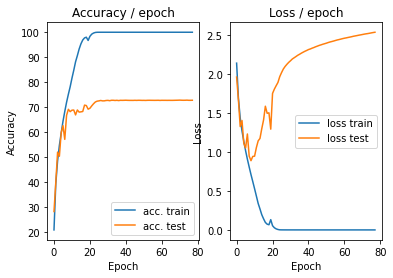

=== EPOCH 79 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


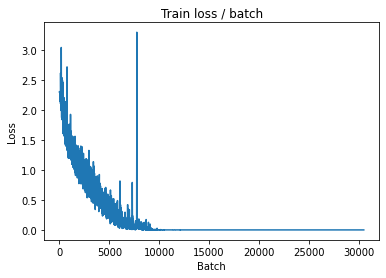

[TRAIN Batch 200/391]	Time 0.021s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


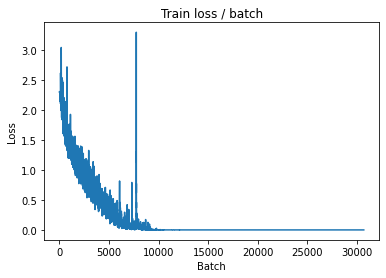


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 2.0256 (2.0256)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5374	Avg Prec@1 72.78 %	Avg Prec@5 97.59 %



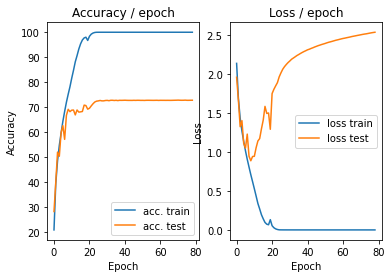

=== EPOCH 80 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


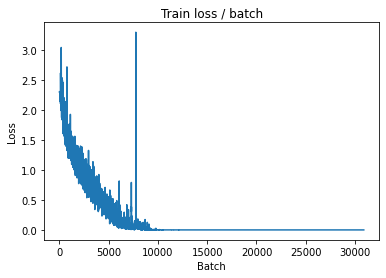

[TRAIN Batch 200/391]	Time 0.028s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


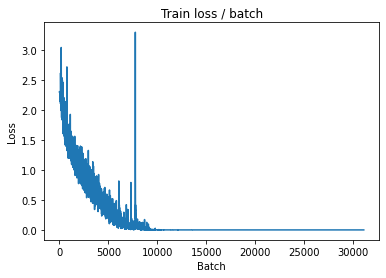


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 2.0275 (2.0275)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5407	Avg Prec@1 72.77 %	Avg Prec@5 97.58 %



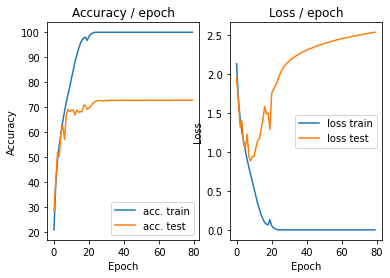

=== EPOCH 81 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


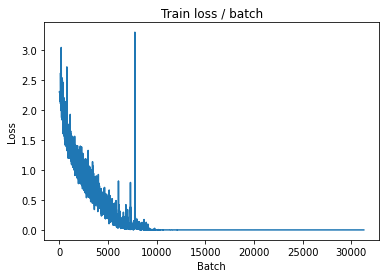

[TRAIN Batch 200/391]	Time 0.019s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


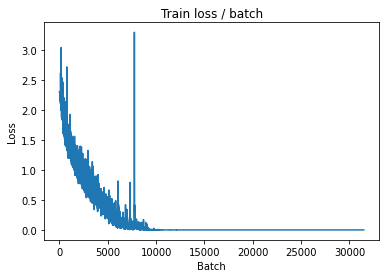


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 2.0309 (2.0309)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5444	Avg Prec@1 72.77 %	Avg Prec@5 97.58 %



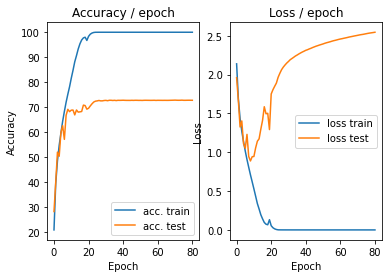

=== EPOCH 82 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


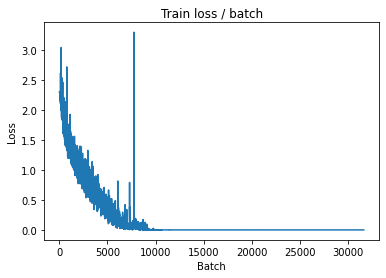

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


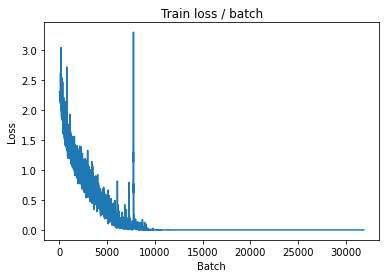


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 2.0329 (2.0329)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5482	Avg Prec@1 72.78 %	Avg Prec@5 97.58 %



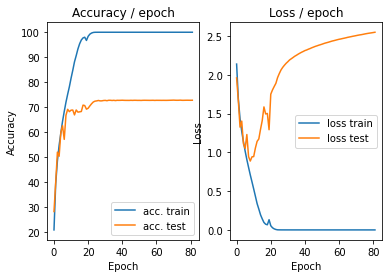

=== EPOCH 83 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


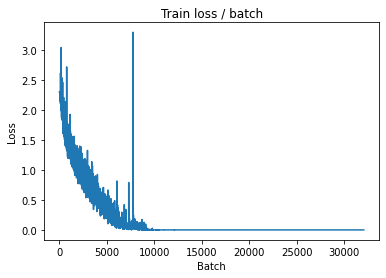

[TRAIN Batch 200/391]	Time 0.010s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


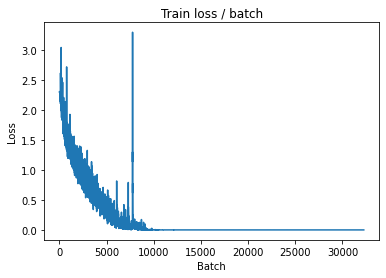


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 2.0368 (2.0368)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5523	Avg Prec@1 72.77 %	Avg Prec@5 97.57 %



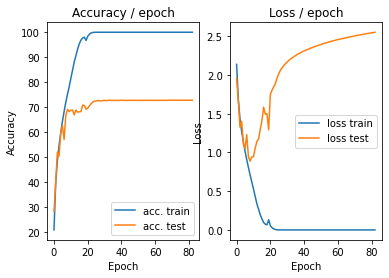

=== EPOCH 84 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


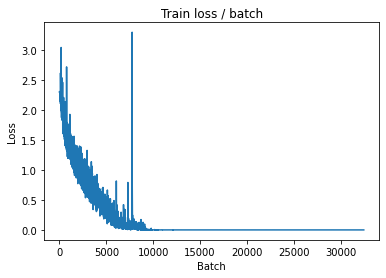

[TRAIN Batch 200/391]	Time 0.018s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


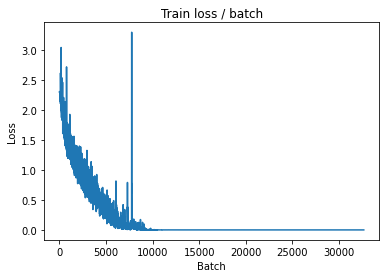


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 2.0409 (2.0409)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5550	Avg Prec@1 72.77 %	Avg Prec@5 97.57 %



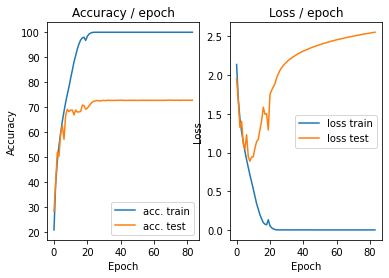

=== EPOCH 85 =====

[TRAIN Batch 000/391]	Time 0.126s (0.126s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


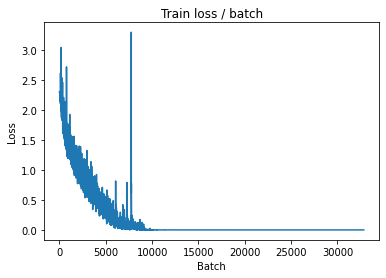

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


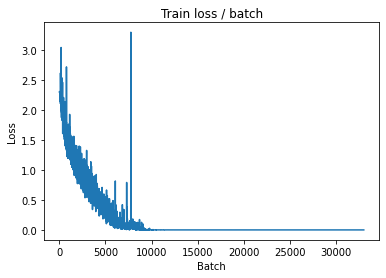


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 2.0434 (2.0434)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5585	Avg Prec@1 72.74 %	Avg Prec@5 97.57 %



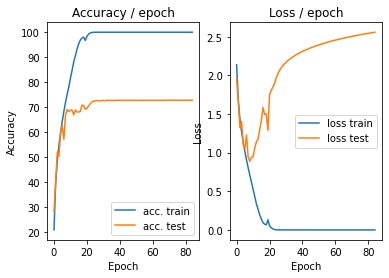

=== EPOCH 86 =====

[TRAIN Batch 000/391]	Time 0.148s (0.148s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


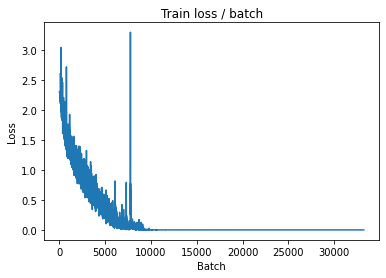

[TRAIN Batch 200/391]	Time 0.029s (0.019s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


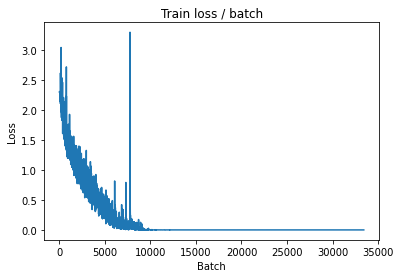


===============> Total time 7s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 2.0464 (2.0464)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5620	Avg Prec@1 72.77 %	Avg Prec@5 97.57 %



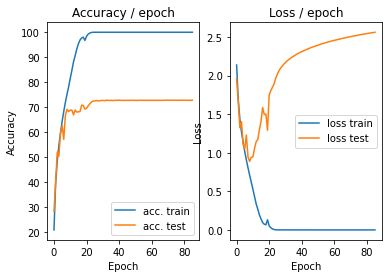

=== EPOCH 87 =====

[TRAIN Batch 000/391]	Time 0.135s (0.135s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


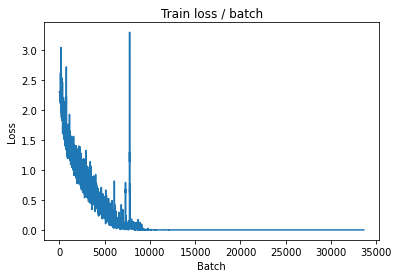

[TRAIN Batch 200/391]	Time 0.029s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


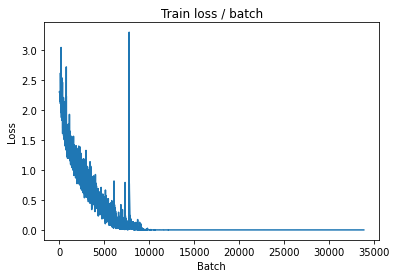


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 2.0502 (2.0502)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5652	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



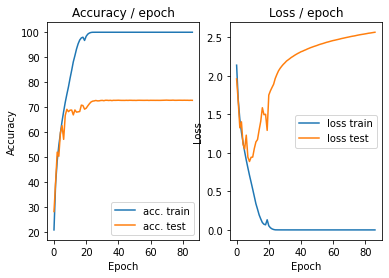

=== EPOCH 88 =====

[TRAIN Batch 000/391]	Time 0.129s (0.129s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


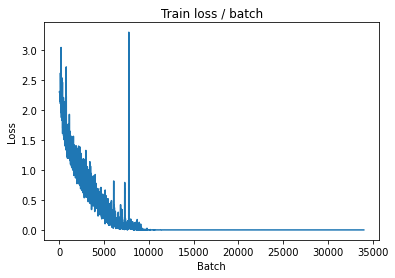

[TRAIN Batch 200/391]	Time 0.023s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


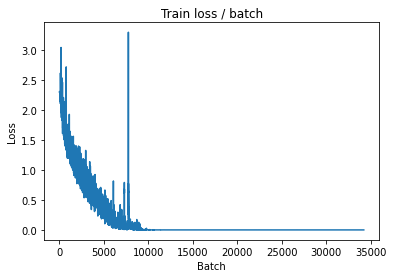


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 2.0544 (2.0544)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5687	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



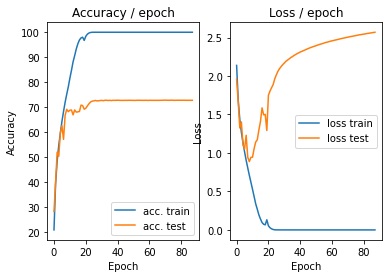

=== EPOCH 89 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


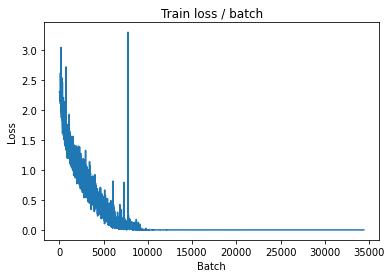

[TRAIN Batch 200/391]	Time 0.020s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


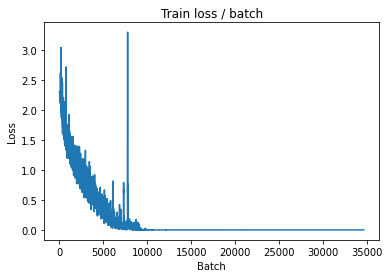


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 2.0554 (2.0554)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5720	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



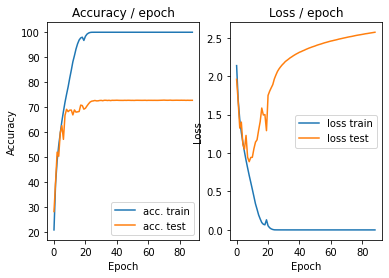

=== EPOCH 90 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


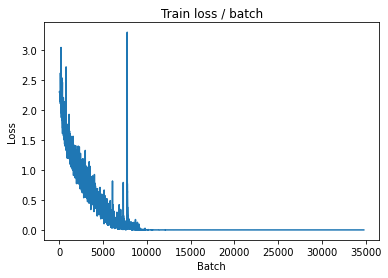

[TRAIN Batch 200/391]	Time 0.029s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


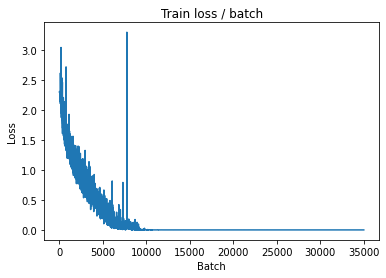


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 2.0577 (2.0577)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5751	Avg Prec@1 72.77 %	Avg Prec@5 97.57 %



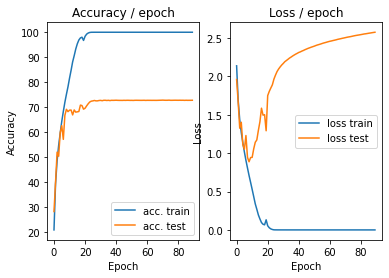

=== EPOCH 91 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


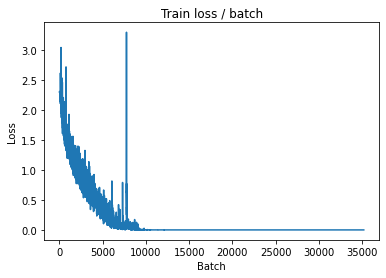

[TRAIN Batch 200/391]	Time 0.012s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


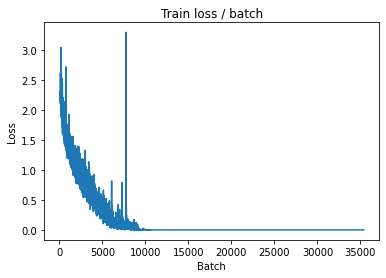


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 2.0613 (2.0613)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5785	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



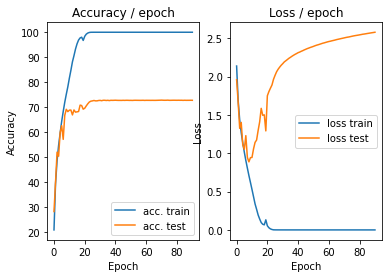

=== EPOCH 92 =====

[TRAIN Batch 000/391]	Time 0.124s (0.124s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


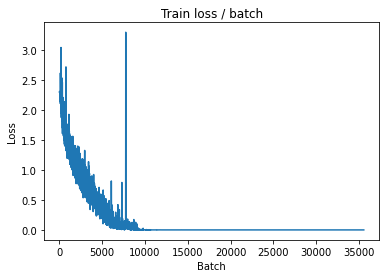

[TRAIN Batch 200/391]	Time 0.022s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


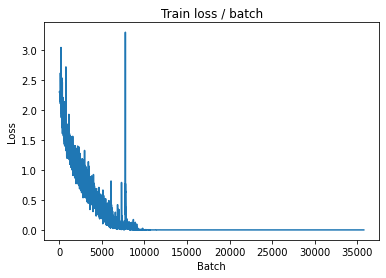


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 2.0636 (2.0636)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5816	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



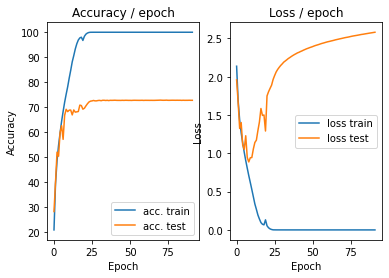

=== EPOCH 93 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


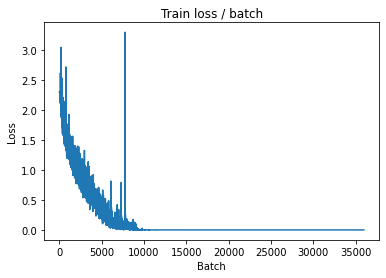

[TRAIN Batch 200/391]	Time 0.010s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


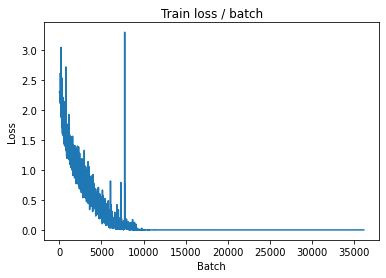


===============> Total time 7s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 2.0670 (2.0670)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5841	Avg Prec@1 72.76 %	Avg Prec@5 97.57 %



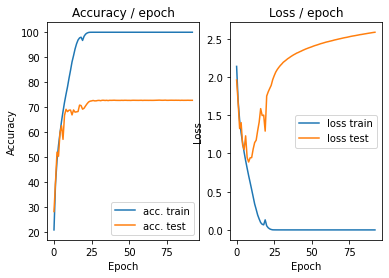

=== EPOCH 94 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


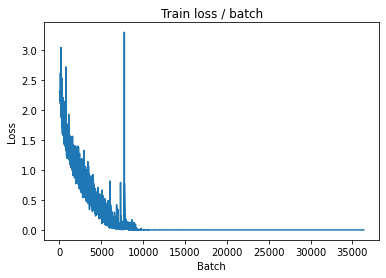

[TRAIN Batch 200/391]	Time 0.020s (0.018s)	Loss 0.0001 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


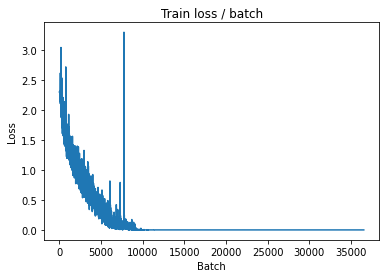


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 2.0708 (2.0708)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5878	Avg Prec@1 72.73 %	Avg Prec@5 97.57 %



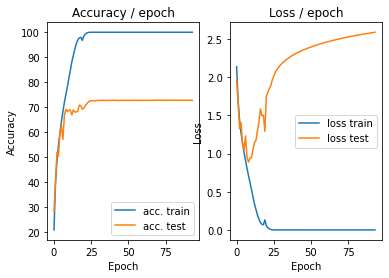

=== EPOCH 95 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


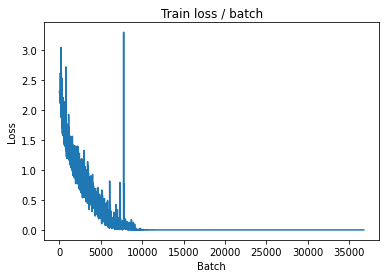

[TRAIN Batch 200/391]	Time 0.025s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


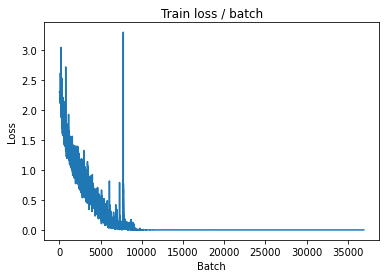


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 2.0743 (2.0743)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5904	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



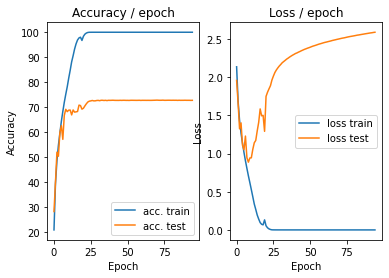

=== EPOCH 96 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.0001 (0.0001)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


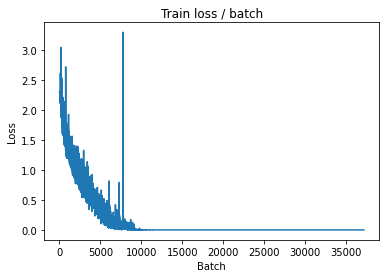

[TRAIN Batch 200/391]	Time 0.019s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


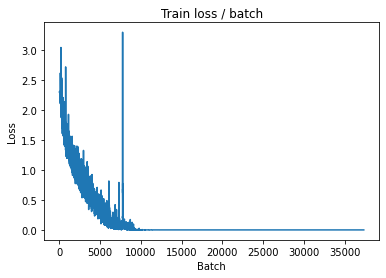


===============> Total time 7s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 2.0761 (2.0761)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5933	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



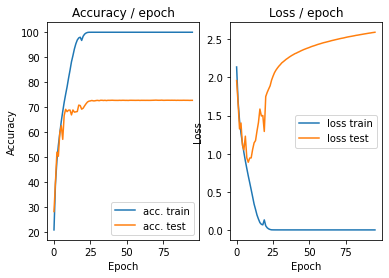

=== EPOCH 97 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


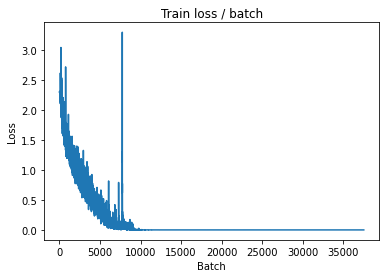

[TRAIN Batch 200/391]	Time 0.028s (0.019s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


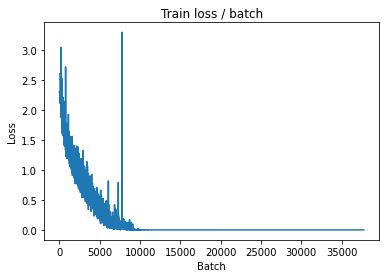


===============> Total time 7s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 2.0795 (2.0795)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5966	Avg Prec@1 72.73 %	Avg Prec@5 97.57 %



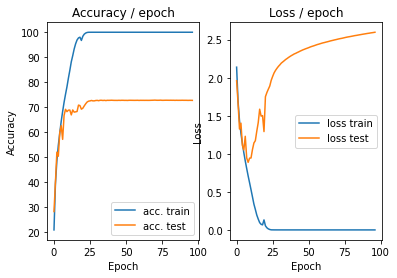

=== EPOCH 98 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


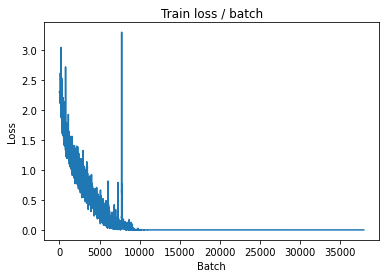

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


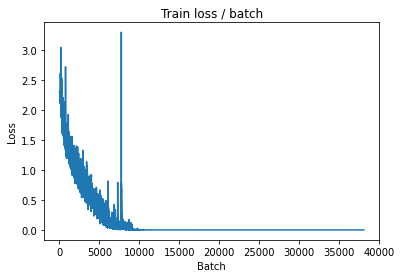


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 2.0813 (2.0813)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.5998	Avg Prec@1 72.74 %	Avg Prec@5 97.57 %



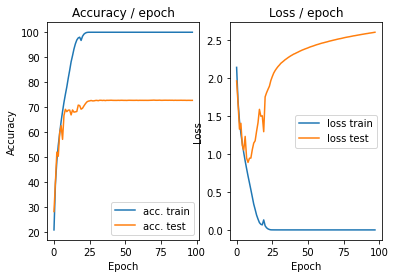

=== EPOCH 99 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


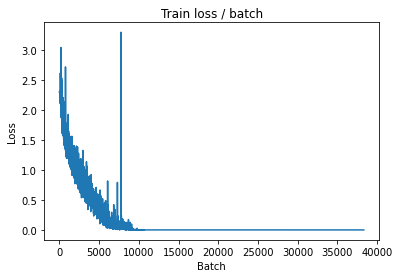

[TRAIN Batch 200/391]	Time 0.013s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


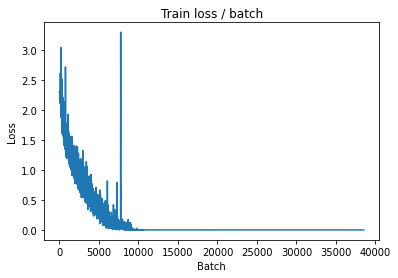


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 2.0850 (2.0850)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.6018	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



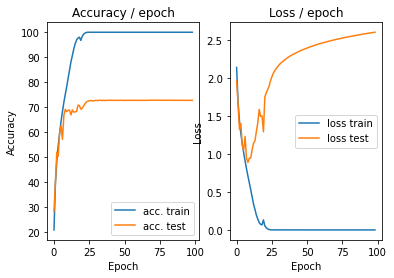

=== EPOCH 100 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


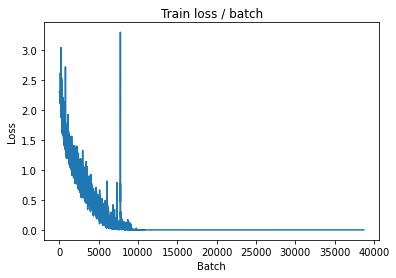

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0000 (0.0000)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


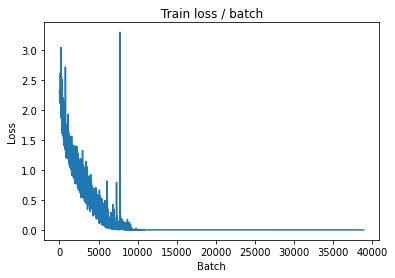


===============> Total time 6s	Avg loss 0.0000	Avg Prec@1 100.00 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 2.0873 (2.0873)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 2.6050	Avg Prec@1 72.75 %	Avg Prec@5 97.57 %



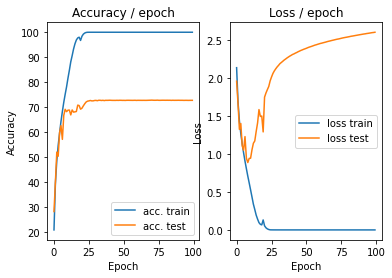

In [ ]:
main(128, 0.1, cuda=True)

# Partie 3

# 3.1

In [ ]:

class ConvNetAlex(nn.Module):

    def __init__(self):
        #CIFAR10
        super(ConvNetAlex, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier` #4x4x64=1024
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10),
            
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    normalize = transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),normalize
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),normalize
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)



Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.280s (0.280s)	Loss 2.3049 (2.3049)	Prec@1   8.6 (  8.6)	Prec@5  44.5 ( 44.5)


<Figure size 432x288 with 0 Axes>

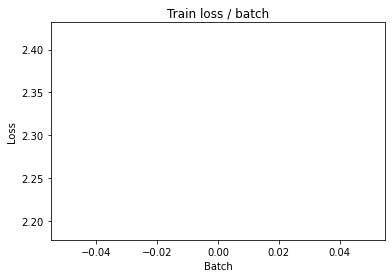

[TRAIN Batch 200/391]	Time 0.036s (0.032s)	Loss 2.0594 (1.9376)	Prec@1  25.0 ( 29.1)	Prec@5  72.7 ( 78.9)


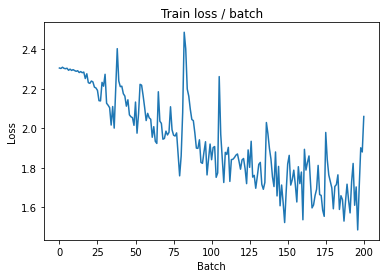


===============> Total time 12s	Avg loss 1.7366	Avg Prec@1 36.85 %	Avg Prec@5 85.00 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 1.4064 (1.4064)	Prec@1  51.6 ( 51.6)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.5099	Avg Prec@1 45.00 %	Avg Prec@5 91.36 %



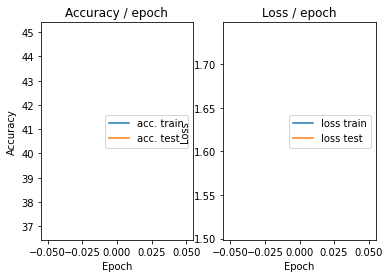

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.159s (0.159s)	Loss 1.5852 (1.5852)	Prec@1  38.3 ( 38.3)	Prec@5  89.8 ( 89.8)


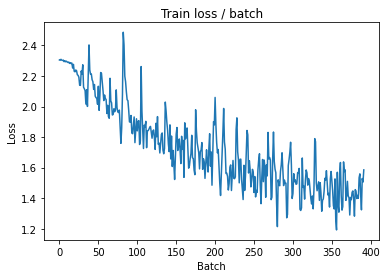

[TRAIN Batch 200/391]	Time 0.060s (0.032s)	Loss 1.2267 (1.3199)	Prec@1  56.2 ( 52.9)	Prec@5  96.9 ( 93.9)


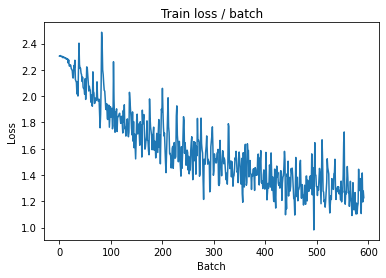


===============> Total time 12s	Avg loss 1.2690	Avg Prec@1 55.00 %	Avg Prec@5 94.54 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.1254 (1.1254)	Prec@1  61.7 ( 61.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.1896	Avg Prec@1 58.56 %	Avg Prec@5 95.47 %



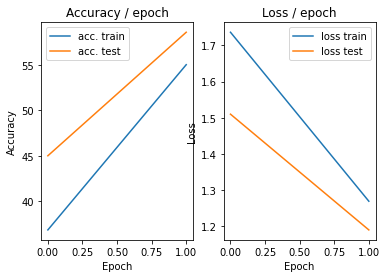

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.153s (0.153s)	Loss 0.9997 (0.9997)	Prec@1  66.4 ( 66.4)	Prec@5  94.5 ( 94.5)


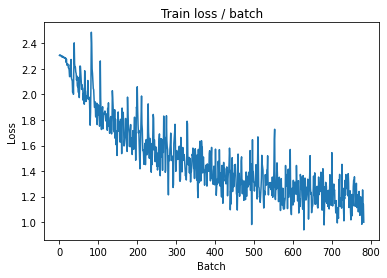

[TRAIN Batch 200/391]	Time 0.040s (0.032s)	Loss 0.8962 (1.0871)	Prec@1  74.2 ( 61.9)	Prec@5  97.7 ( 96.1)


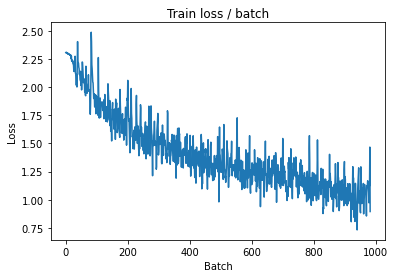


===============> Total time 12s	Avg loss 1.0419	Avg Prec@1 63.48 %	Avg Prec@5 96.57 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.0424 (1.0424)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0510	Avg Prec@1 63.22 %	Avg Prec@5 96.44 %



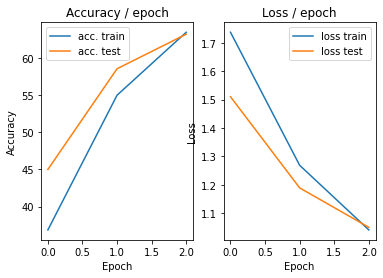

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.162s (0.162s)	Loss 1.0963 (1.0963)	Prec@1  60.2 ( 60.2)	Prec@5  93.8 ( 93.8)


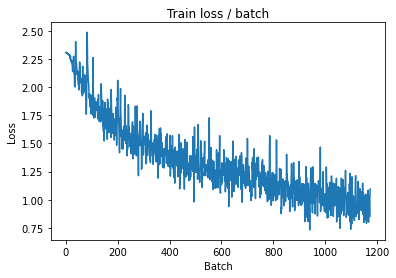

[TRAIN Batch 200/391]	Time 0.015s (0.032s)	Loss 0.7609 (0.8896)	Prec@1  73.4 ( 69.0)	Prec@5 100.0 ( 97.5)


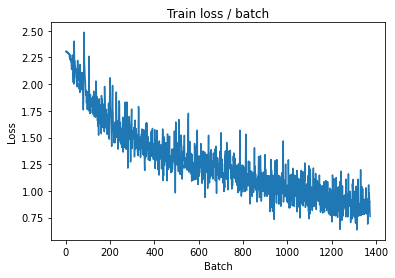


===============> Total time 12s	Avg loss 0.8762	Avg Prec@1 69.42 %	Avg Prec@5 97.65 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.9964 (0.9964)	Prec@1  58.6 ( 58.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 1.0376	Avg Prec@1 63.45 %	Avg Prec@5 96.99 %



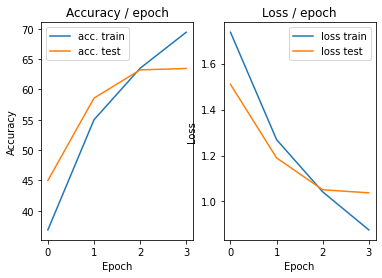

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.175s (0.175s)	Loss 1.0554 (1.0554)	Prec@1  60.9 ( 60.9)	Prec@5  99.2 ( 99.2)


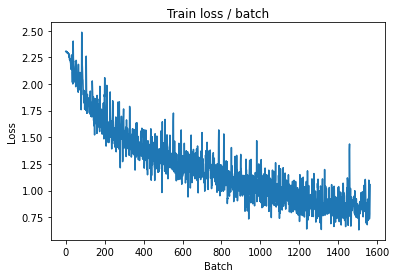

[TRAIN Batch 200/391]	Time 0.018s (0.032s)	Loss 0.5810 (0.7421)	Prec@1  79.7 ( 74.1)	Prec@5 100.0 ( 98.3)


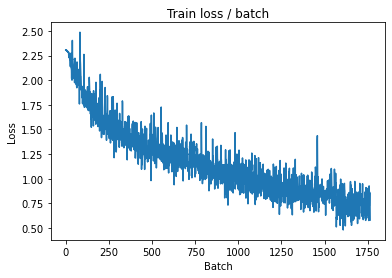


===============> Total time 12s	Avg loss 0.7343	Avg Prec@1 74.59 %	Avg Prec@5 98.34 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 0.7649 (0.7649)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.8819	Avg Prec@1 70.29 %	Avg Prec@5 97.46 %



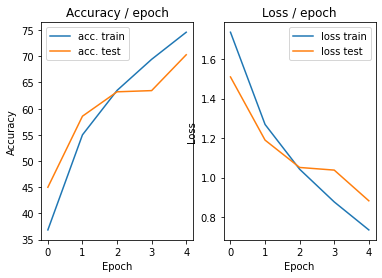

In [ ]:
main(128, 0.1, cuda=True)

# 3.2 Data augmentation

In [ ]:

class ConvNetAlex(nn.Module):

    def __init__(self):
        #CIFAR10
        super(ConvNetAlex, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier` #4x4x64=1024
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10),
            
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    normalize = transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.RandomCrop(28),transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)



Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.250s (0.250s)	Loss 2.3028 (2.3028)	Prec@1  10.9 ( 10.9)	Prec@5  50.0 ( 50.0)


<Figure size 432x288 with 0 Axes>

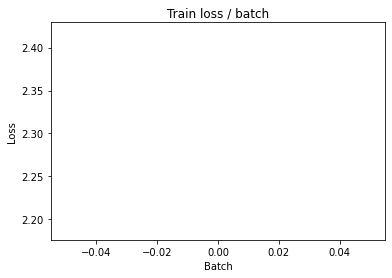

[TRAIN Batch 200/391]	Time 0.014s (0.044s)	Loss 1.6032 (1.9620)	Prec@1  42.2 ( 28.1)	Prec@5  89.8 ( 79.2)


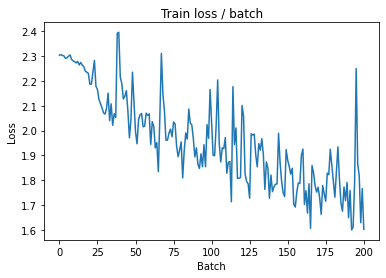


===============> Total time 17s	Avg loss 1.7939	Avg Prec@1 34.49 %	Avg Prec@5 84.41 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.5334 (1.5334)	Prec@1  45.3 ( 45.3)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.5616	Avg Prec@1 42.18 %	Avg Prec@5 91.56 %



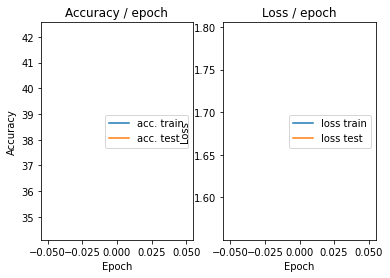

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 1.4419 (1.4419)	Prec@1  50.8 ( 50.8)	Prec@5  93.8 ( 93.8)


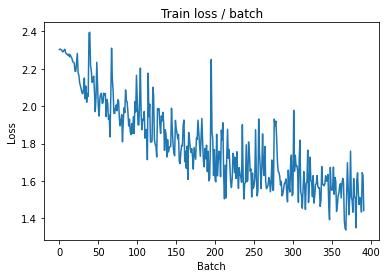

[TRAIN Batch 200/391]	Time 0.018s (0.045s)	Loss 1.5733 (1.4487)	Prec@1  46.9 ( 48.2)	Prec@5  86.7 ( 92.4)


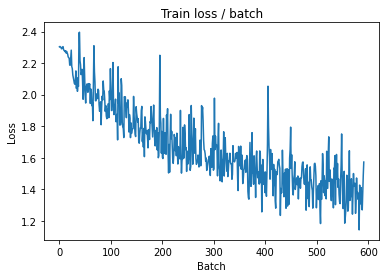


===============> Total time 17s	Avg loss 1.3821	Avg Prec@1 50.76 %	Avg Prec@5 93.13 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.1591 (1.1591)	Prec@1  63.3 ( 63.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1938	Avg Prec@1 57.14 %	Avg Prec@5 95.64 %



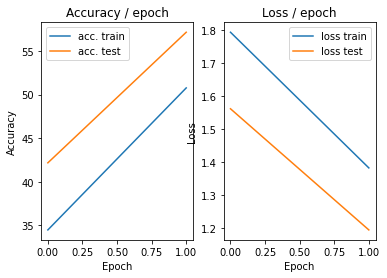

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 1.1081 (1.1081)	Prec@1  57.0 ( 57.0)	Prec@5  96.9 ( 96.9)


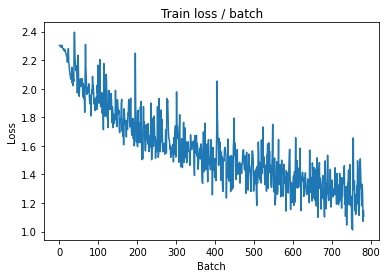

[TRAIN Batch 200/391]	Time 0.080s (0.044s)	Loss 1.2326 (1.2008)	Prec@1  58.6 ( 57.6)	Prec@5  96.9 ( 95.2)


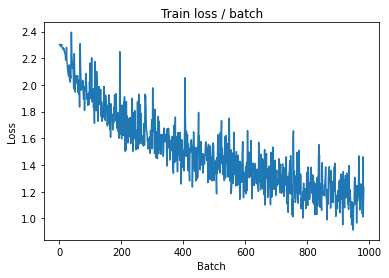


===============> Total time 17s	Avg loss 1.1582	Avg Prec@1 59.12 %	Avg Prec@5 95.55 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.9481 (0.9481)	Prec@1  71.1 ( 71.1)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9997	Avg Prec@1 64.97 %	Avg Prec@5 96.65 %



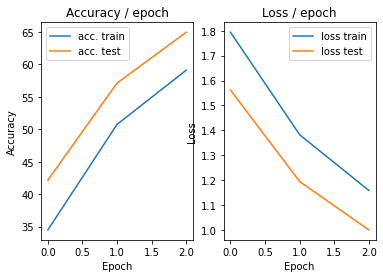

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.0577 (1.0577)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)


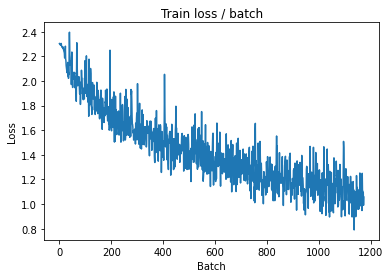

[TRAIN Batch 200/391]	Time 0.014s (0.044s)	Loss 0.9636 (1.0363)	Prec@1  59.4 ( 64.2)	Prec@5 100.0 ( 96.6)


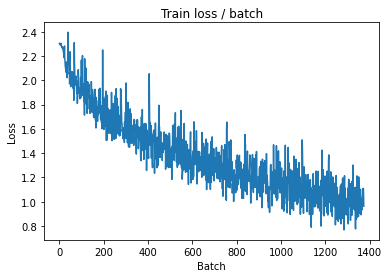


===============> Total time 17s	Avg loss 1.0159	Avg Prec@1 64.81 %	Avg Prec@5 96.62 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.9365 (0.9365)	Prec@1  68.8 ( 68.8)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 0.9551	Avg Prec@1 66.69 %	Avg Prec@5 97.03 %



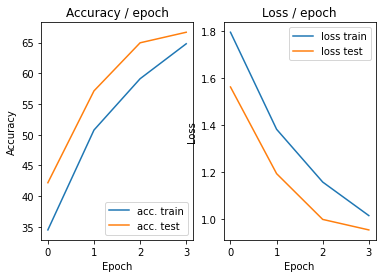

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.1870 (1.1870)	Prec@1  56.2 ( 56.2)	Prec@5  95.3 ( 95.3)


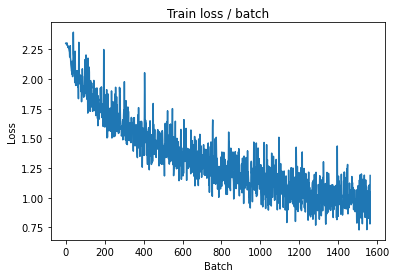

[TRAIN Batch 200/391]	Time 0.013s (0.045s)	Loss 0.8135 (0.9254)	Prec@1  71.9 ( 67.5)	Prec@5  97.7 ( 97.2)


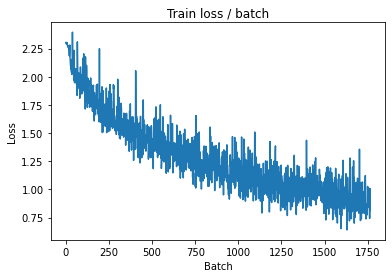


===============> Total time 17s	Avg loss 0.9063	Avg Prec@1 68.23 %	Avg Prec@5 97.29 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.9357 (0.9357)	Prec@1  68.8 ( 68.8)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.9394	Avg Prec@1 67.54 %	Avg Prec@5 97.06 %



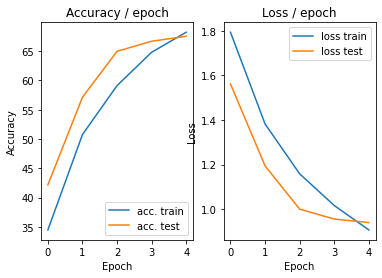

In [ ]:
main(128, 0.1, cuda=True)

## 3.3 Variantes sur l’algorithme d’optimisation


In [ ]:

class ConvNetAlex(nn.Module):

    def __init__(self):
        #CIFAR10
        super(ConvNetAlex, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier` #4x4x64=1024
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Linear(1000, 10),
            
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    normalize = transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.RandomCrop(28),transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
import torch.optim.lr_scheduler
def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr, momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)
        lr_sched.step()



Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 2.3049 (2.3049)	Prec@1  10.9 ( 10.9)	Prec@5  45.3 ( 45.3)


<Figure size 432x288 with 0 Axes>

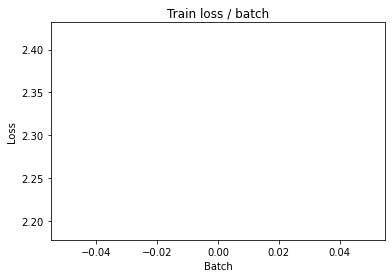

[TRAIN Batch 200/391]	Time 0.057s (0.044s)	Loss 1.8390 (1.9121)	Prec@1  39.8 ( 29.3)	Prec@5  82.8 ( 81.9)


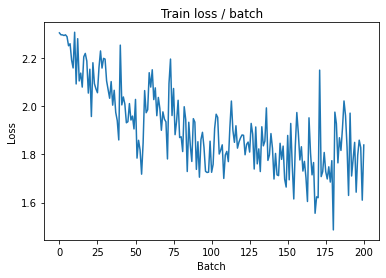


===============> Total time 16s	Avg loss 1.7957	Avg Prec@1 34.35 %	Avg Prec@5 85.25 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.5645 (1.5645)	Prec@1  46.9 ( 46.9)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.5217	Avg Prec@1 45.13 %	Avg Prec@5 90.72 %



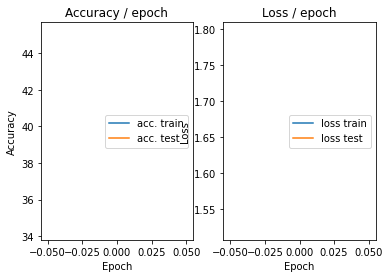

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 1.4614 (1.4614)	Prec@1  46.9 ( 46.9)	Prec@5  89.8 ( 89.8)


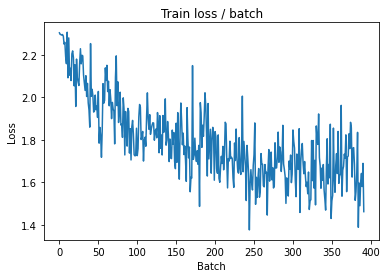

[TRAIN Batch 200/391]	Time 0.035s (0.043s)	Loss 1.4787 (1.5991)	Prec@1  44.5 ( 42.1)	Prec@5  93.8 ( 90.0)


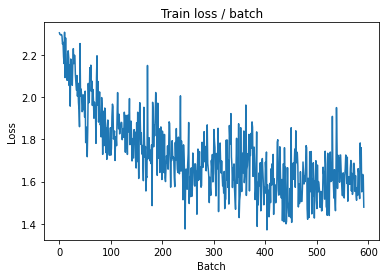


===============> Total time 16s	Avg loss 1.5751	Avg Prec@1 43.38 %	Avg Prec@5 90.47 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.6113 (1.6113)	Prec@1  45.3 ( 45.3)	Prec@5  88.3 ( 88.3)

===============> Total time 2s	Avg loss 1.5328	Avg Prec@1 45.83 %	Avg Prec@5 91.94 %



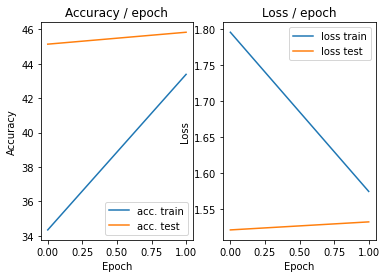

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.7545 (1.7545)	Prec@1  42.2 ( 42.2)	Prec@5  90.6 ( 90.6)


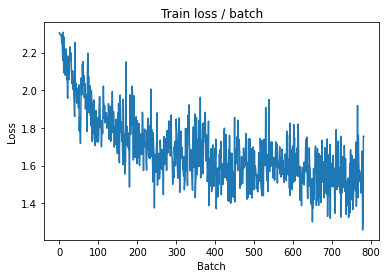

[TRAIN Batch 200/391]	Time 0.015s (0.044s)	Loss 1.4389 (1.5270)	Prec@1  43.0 ( 45.5)	Prec@5  93.8 ( 91.1)


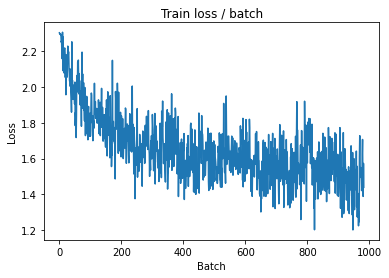


===============> Total time 16s	Avg loss 1.5019	Avg Prec@1 46.74 %	Avg Prec@5 91.46 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.5911 (1.5911)	Prec@1  51.6 ( 51.6)	Prec@5  85.9 ( 85.9)

===============> Total time 2s	Avg loss 1.4443	Avg Prec@1 49.26 %	Avg Prec@5 91.54 %



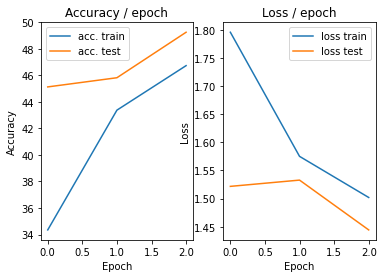

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 1.3677 (1.3677)	Prec@1  50.0 ( 50.0)	Prec@5  88.3 ( 88.3)


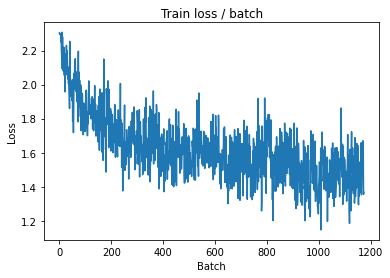

[TRAIN Batch 200/391]	Time 0.078s (0.043s)	Loss 1.4680 (1.4025)	Prec@1  47.7 ( 51.0)	Prec@5  94.5 ( 92.5)


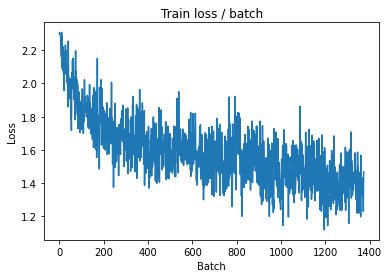


===============> Total time 16s	Avg loss 1.4148	Avg Prec@1 50.90 %	Avg Prec@5 92.34 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 1.4107 (1.4107)	Prec@1  49.2 ( 49.2)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.4192	Avg Prec@1 49.97 %	Avg Prec@5 92.29 %



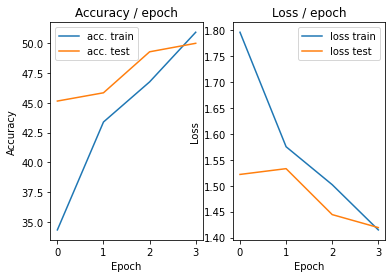

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.6612 (1.6612)	Prec@1  44.5 ( 44.5)	Prec@5  89.8 ( 89.8)


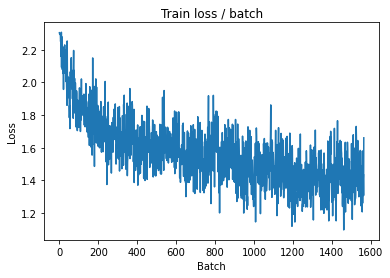

[TRAIN Batch 200/391]	Time 0.066s (0.043s)	Loss 1.4277 (1.3761)	Prec@1  55.5 ( 52.2)	Prec@5  93.0 ( 92.7)


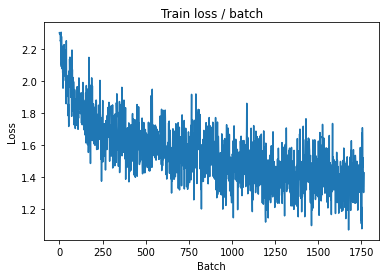


===============> Total time 16s	Avg loss 1.3757	Avg Prec@1 52.62 %	Avg Prec@5 92.59 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.2614 (1.2614)	Prec@1  54.7 ( 54.7)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.3011	Avg Prec@1 54.72 %	Avg Prec@5 93.28 %



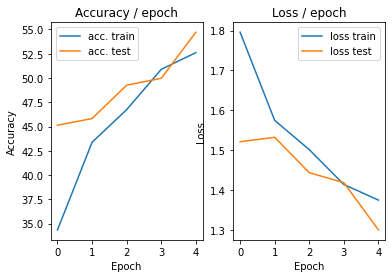

In [ ]:
main(128, 0.1, cuda=True)

## 3.4 Régularisation du réseau par dropout

In [ ]:

class ConvNetAlex(nn.Module):

    def __init__(self):
        #CIFAR10
        super(ConvNetAlex, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier` #4x4x64=1024
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1000, 10),
            
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    normalize = transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.RandomCrop(28),transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
import torch.optim.lr_scheduler
def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr, momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)
        lr_sched.step()



Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 2.3008 (2.3008)	Prec@1  10.2 ( 10.2)	Prec@5  53.9 ( 53.9)


<Figure size 432x288 with 0 Axes>

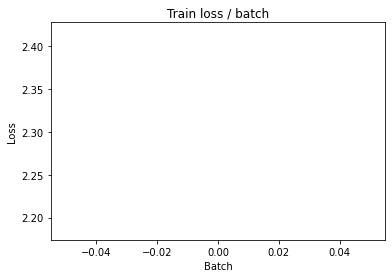

[TRAIN Batch 200/391]	Time 0.008s (0.043s)	Loss 1.8699 (2.0646)	Prec@1  28.9 ( 23.6)	Prec@5  82.8 ( 76.4)


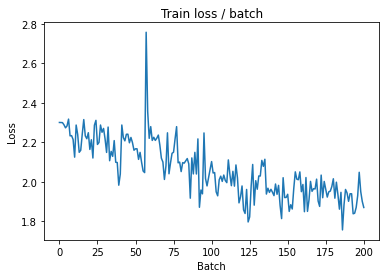


===============> Total time 16s	Avg loss 1.9773	Avg Prec@1 26.56 %	Avg Prec@5 79.75 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.7748 (1.7748)	Prec@1  36.7 ( 36.7)	Prec@5  84.4 ( 84.4)

===============> Total time 2s	Avg loss 1.7492	Avg Prec@1 34.67 %	Avg Prec@5 86.52 %



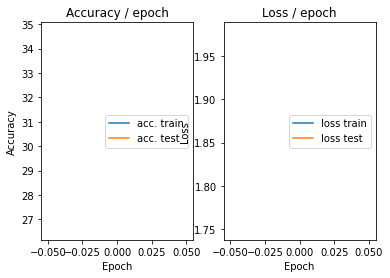

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 1.8824 (1.8824)	Prec@1  27.3 ( 27.3)	Prec@5  81.2 ( 81.2)


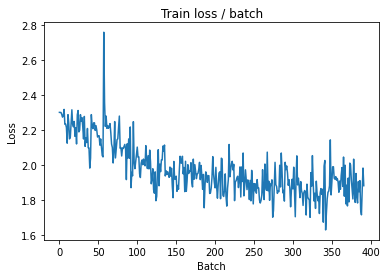

[TRAIN Batch 200/391]	Time 0.060s (0.043s)	Loss 1.8938 (1.8146)	Prec@1  31.2 ( 32.1)	Prec@5  78.1 ( 85.6)


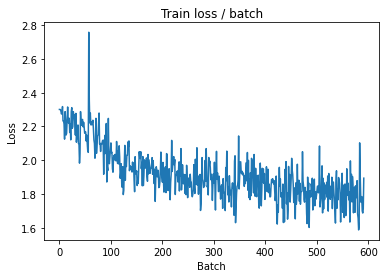


===============> Total time 16s	Avg loss 1.8257	Avg Prec@1 31.83 %	Avg Prec@5 85.20 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.7678 (1.7678)	Prec@1  38.3 ( 38.3)	Prec@5  85.9 ( 85.9)

===============> Total time 2s	Avg loss 1.7078	Avg Prec@1 37.14 %	Avg Prec@5 87.42 %



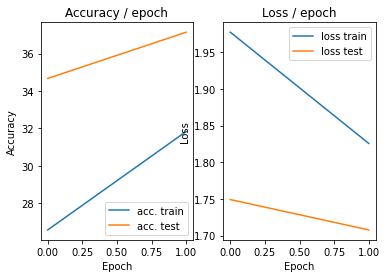

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 1.8604 (1.8604)	Prec@1  36.7 ( 36.7)	Prec@5  89.8 ( 89.8)


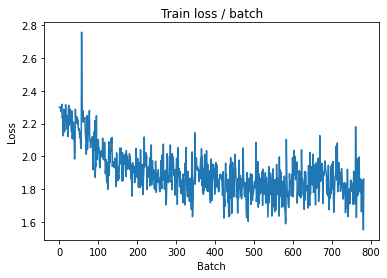

[TRAIN Batch 200/391]	Time 0.027s (0.043s)	Loss 1.8569 (1.7709)	Prec@1  29.7 ( 33.9)	Prec@5  84.4 ( 86.4)


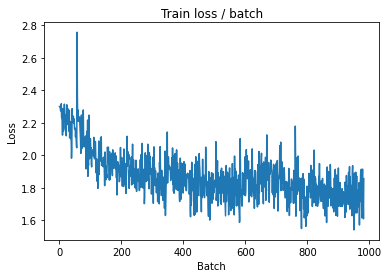


===============> Total time 16s	Avg loss 1.7663	Avg Prec@1 34.16 %	Avg Prec@5 86.50 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 1.6994 (1.6994)	Prec@1  37.5 ( 37.5)	Prec@5  89.1 ( 89.1)

===============> Total time 2s	Avg loss 1.6312	Avg Prec@1 39.64 %	Avg Prec@5 88.76 %



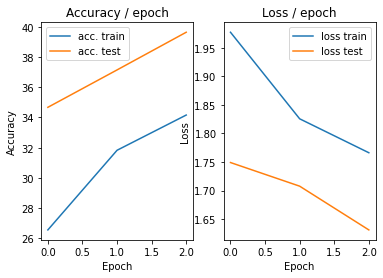

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 1.8489 (1.8489)	Prec@1  28.1 ( 28.1)	Prec@5  85.9 ( 85.9)


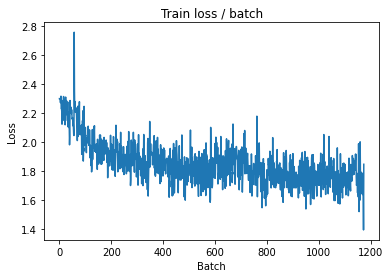

[TRAIN Batch 200/391]	Time 0.023s (0.043s)	Loss 1.6508 (1.7085)	Prec@1  30.5 ( 36.9)	Prec@5  90.6 ( 88.0)


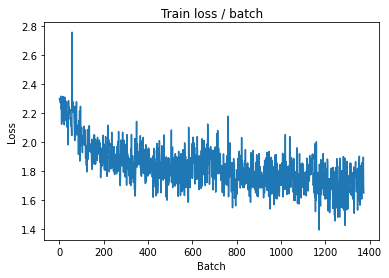


===============> Total time 16s	Avg loss 1.6987	Avg Prec@1 37.17 %	Avg Prec@5 88.02 %

[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 1.5729 (1.5729)	Prec@1  39.1 ( 39.1)	Prec@5  89.1 ( 89.1)

===============> Total time 2s	Avg loss 1.5721	Avg Prec@1 41.88 %	Avg Prec@5 90.44 %



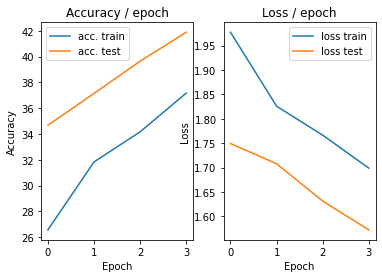

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.7470 (1.7470)	Prec@1  34.4 ( 34.4)	Prec@5  86.7 ( 86.7)


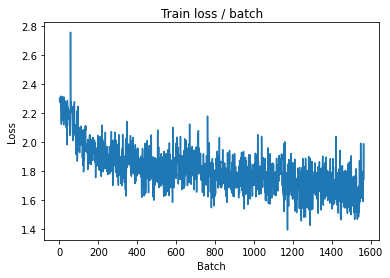

[TRAIN Batch 200/391]	Time 0.014s (0.044s)	Loss 1.8449 (1.6568)	Prec@1  31.2 ( 39.2)	Prec@5  85.2 ( 89.0)


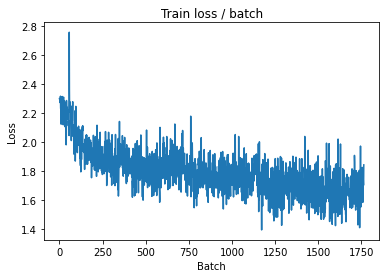


===============> Total time 16s	Avg loss 1.6572	Avg Prec@1 39.24 %	Avg Prec@5 88.74 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 1.5488 (1.5488)	Prec@1  46.1 ( 46.1)	Prec@5  88.3 ( 88.3)

===============> Total time 2s	Avg loss 1.5760	Avg Prec@1 42.44 %	Avg Prec@5 89.55 %



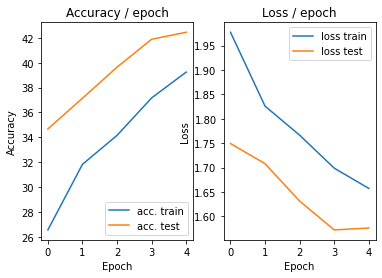

In [ ]:
main(128, 0.1, cuda=True)

## 3.5 Utilisation de batch normalization

In [ ]:

class ConvNetAlex(nn.Module):

    def __init__(self):
        #CIFAR10
        super(ConvNetAlex, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier` #4x4x64=1024
        self.classifier = nn.Sequential(
            nn.Linear(1024, 1000),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(1000, 10),
            
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )
    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output


def get_dataset(batch_size, cuda=False):
    normalize = transforms.Normalize(mean=[0.491, 0.482, 0.447], std=[0.202, 0.199, 0.201])
    
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.RandomCrop(28),transforms.RandomHorizontalFlip()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(), normalize, transforms.CenterCrop(28)
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader


def epoch(data, model, criterion, optimizer=None, cuda=False):
    

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss

###############
import torch.optim.lr_scheduler
def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model = ConvNetAlex()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr, momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()
    
    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)
        lr_sched.step()



Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 2.3886 (2.3886)	Prec@1   4.7 (  4.7)	Prec@5  53.9 ( 53.9)


<Figure size 432x288 with 0 Axes>

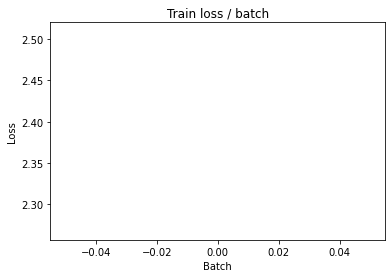

[TRAIN Batch 200/391]	Time 0.018s (0.044s)	Loss 1.4495 (1.7876)	Prec@1  50.0 ( 34.5)	Prec@5  91.4 ( 85.9)


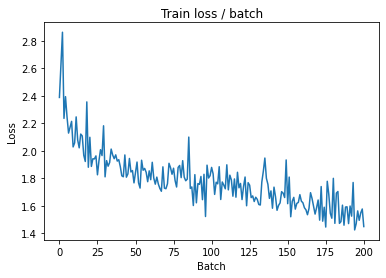


===============> Total time 17s	Avg loss 1.6165	Avg Prec@1 41.16 %	Avg Prec@5 89.18 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.3030 (1.3030)	Prec@1  51.6 ( 51.6)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.3052	Avg Prec@1 53.14 %	Avg Prec@5 93.93 %



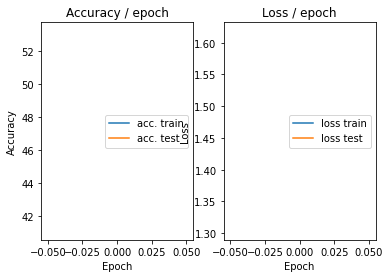

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 1.3660 (1.3660)	Prec@1  57.8 ( 57.8)	Prec@5  91.4 ( 91.4)


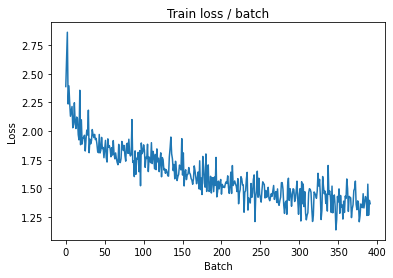

[TRAIN Batch 200/391]	Time 0.078s (0.044s)	Loss 1.2335 (1.2620)	Prec@1  53.9 ( 54.7)	Prec@5  97.7 ( 94.6)


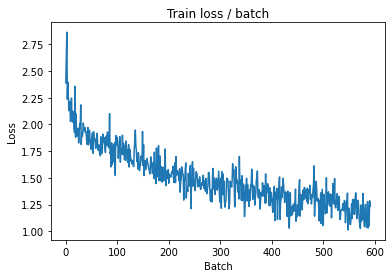


===============> Total time 17s	Avg loss 1.1983	Avg Prec@1 57.32 %	Avg Prec@5 95.05 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.9650 (0.9650)	Prec@1  64.8 ( 64.8)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0159	Avg Prec@1 64.22 %	Avg Prec@5 96.72 %



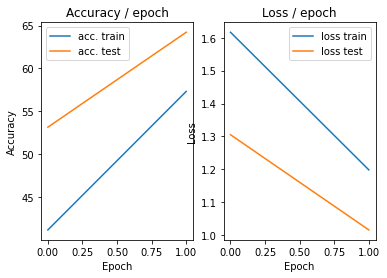

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 1.0294 (1.0294)	Prec@1  60.9 ( 60.9)	Prec@5  98.4 ( 98.4)


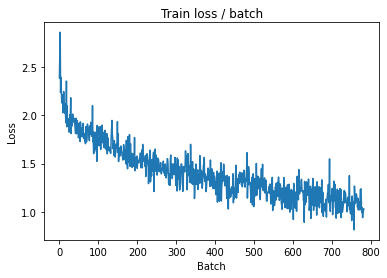

[TRAIN Batch 200/391]	Time 0.069s (0.044s)	Loss 0.9277 (1.0353)	Prec@1  69.5 ( 63.8)	Prec@5  97.7 ( 96.5)


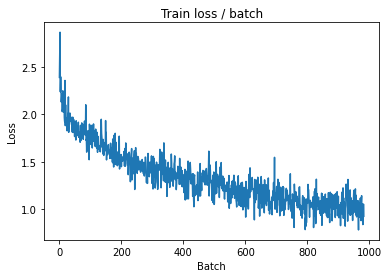


===============> Total time 17s	Avg loss 1.0071	Avg Prec@1 64.87 %	Avg Prec@5 96.53 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.9223 (0.9223)	Prec@1  71.9 ( 71.9)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 0.9284	Avg Prec@1 67.98 %	Avg Prec@5 97.35 %



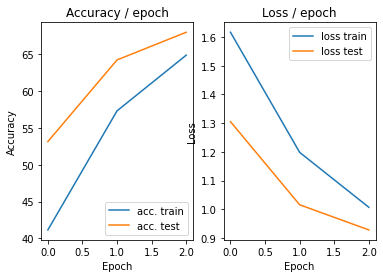

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.9904 (0.9904)	Prec@1  64.1 ( 64.1)	Prec@5  95.3 ( 95.3)


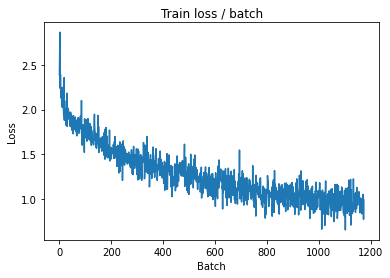

[TRAIN Batch 200/391]	Time 0.074s (0.044s)	Loss 0.8060 (0.9013)	Prec@1  75.8 ( 68.7)	Prec@5  97.7 ( 97.2)


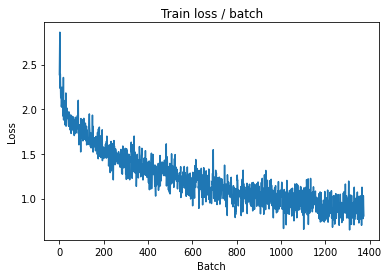


===============> Total time 17s	Avg loss 0.8870	Avg Prec@1 69.32 %	Avg Prec@5 97.32 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.7874 (0.7874)	Prec@1  71.9 ( 71.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8476	Avg Prec@1 70.91 %	Avg Prec@5 97.43 %



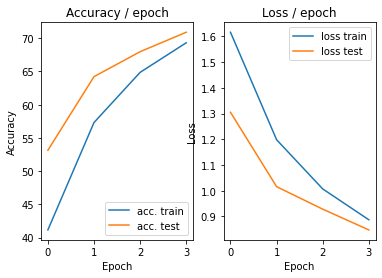

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.9915 (0.9915)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)


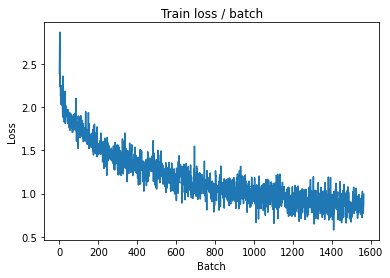

[TRAIN Batch 200/391]	Time 0.019s (0.044s)	Loss 0.9562 (0.8114)	Prec@1  67.2 ( 71.8)	Prec@5  96.9 ( 97.9)


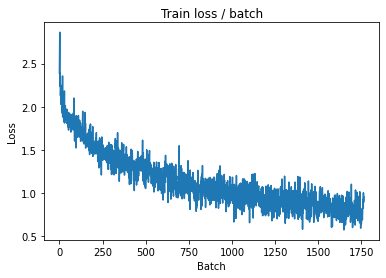


===============> Total time 17s	Avg loss 0.8036	Avg Prec@1 72.16 %	Avg Prec@5 97.82 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.8775 (0.8775)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8800	Avg Prec@1 70.45 %	Avg Prec@5 97.50 %



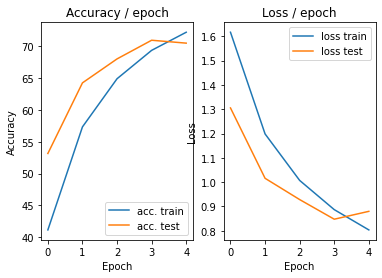

In [ ]:
main(128, 0.1, cuda=True)